In [1]:
%matplotlib inline
import bioread
import numpy as np
import pandas as pd
import neurokit2 as nk
import matplotlib.pyplot as plt
import os

In [2]:
class Segment(object):
    def __init__(self, name, start_index_text, start_index, seg_before):
        self.name = name
        self.start_index_text = start_index_text
        self.start_index = start_index
        self.end_index_text = ""
        self.end_index = 0
        self.before = seg_before
        self.after = None
        self.marker_inside_text = ""
        self.marker_inside_index = 0

    def make_df(self, file):
        data = {}
        for channel in file.named_channels:
            signal = np.array(file.named_channels[channel].data[self.start_index:self.end_index])
            data[channel] = signal
        self.df = pd.DataFrame(data)
        print('Dataframe of {0}:'.format(self.name))
        #print(self.df)


In [3]:
class Filedata(object):
    def __init__(self, filename):
        self.filename = filename
        self.segments = {}

    def preparedata(self):
        name_seg_before = None
        name_seg_after = None
        file = bioread.read_file('../RAW_data/labeled/{0}.acq'.format(self.filename))
        for m in file.event_markers:
            if m.text == 'post nf1_VR (crashed)' and self.filename == 'PB1_only_part2':
                continue

            if m.text == 'recording interrupted' and self.filename == 'PB12':
                m.text = 'stress2_MIST_end'

            if m.text == 'stress1_ABBA_start' and m.sample_index == 946410 and self.filename == 'PB13':
                m.text = "stress1_ABBA_end"

            if m.text == 'stress2_MIST_end' and self.filename == 'PB23':
                m.text = "stress1_MIST_end"

            if m.text == '' and self.filename == 'PB27':
                m.text = "nf2_VR_start"

            if m.text == '' and self.filename == 'PB15':
                m.text = "nf2_VR_end"

            if m.text == '' and self.filename in ['PB4', 'PB16', 'PB22', 'PB25', 'PB12-partie_2']:
                continue

            if m.text == 'baseline':
                name = m.text
                current_seg = Segment(name, m.text, m.sample_index, name_seg_before)
                self.segments[name] = current_seg
                name_seg_before = name
            elif m.text.startswith("Segment "):
                continue
            elif m.text.endswith("_start"):
                name = m.text.removesuffix("_start")
                current_seg = Segment(name, m.text, m.sample_index, name_seg_before)
                self.segments[name] = current_seg
                if name_seg_before != None:
                    self.segments[name_seg_before].after = name
                name_seg_before = name
            elif m.text.endswith("_end"):
                name = m.text.removesuffix("_end")
                current_seg = self.segments[name]
                current_seg.end_index_text = m.text
                current_seg.end_index = m.sample_index
                current_seg.make_df(file)
                name_seg_before = name
            elif m.text.endswith("_unlimited"):
                if name_seg_before != None:
                    print("unlimited: " + m.text)
                    self.segments[name_seg_before].marker_inside_text = m.text
                    self.segments[name_seg_before].marker_inside_index = m.sample_index
            else:
                print("unknown: " + m.text)
            print(m.text)

        if self.filename in ['PB4', 'PB7', 'PB12', 'PB13', 'PB14', 'PB15', 'PB16', 'PB17', 'PB21', 'PB25']:
            current_seg = self.segments['baseline']
            current_seg.end_index_text = self.segments['stress1_ABBA'].start_index_text
            current_seg.end_index = self.segments['stress1_ABBA'].start_index
            current_seg.make_df(file)

        if self.filename in ['PB2', 'PB3', 'PB5', 'PB19', 'PB22', 'PB23', 'PB24', 'PB26', 'PB27']:
            current_seg = self.segments['baseline']
            current_seg.end_index_text = self.segments['stress1_MIST'].start_index_text
            current_seg.end_index = self.segments['stress1_MIST'].start_index
            current_seg.make_df(file)

        if self.filename in ['PB12-partie_2']:
            current_seg = self.segments['baseline']
            current_seg.end_index_text = self.segments['stress2_MIST'].start_index_text
            current_seg.end_index = self.segments['stress2_MIST'].start_index
            current_seg.make_df(file)
   

In [4]:
def ECG_report(df, name):
    print('Segment {0}:'.format(name))
    nk.signal_plot(df, subplots=True, sampling_rate=1000)
    plt.grid(True)
    #fig = plt.gcf()
    #fig.savefig("all_{0}.png".format(name))
    plt.show()
    plt.close()

    print('ECG of {0}:'.format(name))
    nk.signal_plot(df['ECG (.5 - 35 Hz)'], sampling_rate=1000)
    plt.title('ECG of {0}:'.format(name))
    plt.grid(True)
    #fig = plt.gcf()
    #fig.savefig("ecg_{0}.png".format(name))
    plt.xlim(0, 10)
    plt.ylim(-0.5,0.5)
    plt.show()
    plt.close()
    # Find peaks
    peaks, info = nk.ecg_peaks(df['ECG (.5 - 35 Hz)'], sampling_rate=1000)
    # Compute HRV indices
    hrv = nk.hrv_time(peaks, sampling_rate=1000, show=True)
    plt.title('ECG Peaks of {0}:'.format(name))
    plt.grid(True)
    #fig = plt.gcf()
    #fig.savefig("hrv_{0}.png".format(name))
    plt.show()
    plt.close()
    print('HRV of segment {0}:'.format(name))
    print(hrv)
    #for col in hrv:
    #    print(col)
    print(hrv['HRV_MeanNN'])
    #print(hrv.iloc[0]['HRV_MeanNN'])
    print(hrv['HRV_SDNN'])
    #print(hrv.iloc[0]['HRV_SDNN'])
    print(hrv['HRV_RMSSD'])
    #print(hrv.iloc[0]['HRV_RMSSD'])

In [5]:
def EDA_report(df, name):
    #reportname = 'EDAreport_{0}.html'.format(name)
    #signals, info = nk.eda_process(df['EDA (0 - 35 Hz)'], sampling_rate=1000, report=reportname)
    #signals, info = nk.eda_process(df['EDA (0 - 35 Hz)'], sampling_rate=1000, report="text")
    signals, info = nk.eda_process(df['EDA (0 - 35 Hz)'], sampling_rate=1000)
    nk.eda_plot(signals, info)
    plt.grid(True)
    #fig = plt.gcf()
    #fig.savefig("eda_{0}.png".format(name))
    plt.show()
    plt.close()
    print('EDA of segment {0}:'.format(name))
    #print(signals)
    #print(info)
    analyze_df = nk.eda_analyze(signals, sampling_rate=1000)
    print(analyze_df)



In [6]:
def sort_filelist(l):
    import re
    convert = lambda text: int(text) if text.isdigit() else text
    alphanum = lambda key: [convert(c) for c in re.split(r'PB(\d+)', key)]
    l.sort(key=alphanum)
    return l

In [7]:
def main():
    fdatas = {}
    labeled_files = os.listdir('../RAW_data/labeled')
    for lbfile in sort_filelist(labeled_files):
        if lbfile.endswith(".acq"):
           filename = lbfile.removesuffix(".acq")
           print(filename)
           fdata = Filedata(filename)
           fdata.preparedata()
           fdatas[filename] = fdata

    for fnam, fdat in fdatas.items():
        print('\nFile {0}:'.format(fnam))
        for name, seg in fdat.segments.items():
            ECG_report(seg.df, name)
            EDA_report(seg.df, name)
            #pass

        print('\nFor file {0}:'.format(fnam))
        for name, seg in fdat.segments.items():
            if seg.marker_inside_index != 0:
                print(seg.marker_inside_index)
                print('segment: [{0}] before: [{1}] after [{2}] start [{3}] end [{4}] marker_inside label[{5}] marker_inside index [{6}]'.format(name, seg.before, seg.after, seg.start_index, seg.end_index, seg.marker_inside_text, seg.marker_inside_index))
            else:
                print('segment: [{0}] before: [{1}] after [{2}] start [{3}] end [{4}]'.format(name, seg.before, seg.after, seg.start_index, seg.end_index))
        #first = ""
        #for name, seg in segments.items():
        #    if seg.before == None:
        #        first = name
        #        break
        #seg = segments[first]
        #while True:
        #    print(seg.name)
        #    if seg.after == None:
        #        break
        #    seg = segments[seg.after]
        #In Python 3.6+ dictionaries preserve insertion order.
        #sys.exit(0)
    return 0

PB1_only_part2
stress2_ABBA_start
Dataframe of stress2_ABBA:
stress2_ABBA_end
nf2_2D_start
unlimited: nf2_2D_unlimited
nf2_2D_unlimited
Dataframe of nf2_2D:
nf2_2D_end
PB2
baseline
stress1_MIST_start
Dataframe of stress1_MIST:
stress1_MIST_end
unknown: 

nf1_VR_start
unlimited: nf1_VR_unlimited
nf1_VR_unlimited
Dataframe of nf1_VR:
nf1_VR_end
stress2_ABBA_start
Dataframe of stress2_ABBA:
stress2_ABBA_end
nf2_2D_start
unlimited: nf2_2D_unlimited
nf2_2D_unlimited
Dataframe of nf2_2D:
nf2_2D_end
Dataframe of baseline:
PB3
baseline
stress1_MIST_start
Dataframe of stress1_MIST:
stress1_MIST_end
nf1_2D_start
unlimited: nf1_2D_unlimited
nf1_2D_unlimited
Dataframe of nf1_2D:
nf1_2D_end
stress2_ABBA_start
Dataframe of stress2_ABBA:
stress2_ABBA_end
nf2_VR_start
unlimited: nf2_VR_unlimited
nf2_VR_unlimited
Dataframe of nf2_VR:
nf2_VR_end
Dataframe of baseline:
PB4
baseline
stress1_ABBA_start
Dataframe of stress1_ABBA:
stress1_ABBA_end
nf1_2D_start
unlimited: nf1_2D_unlimited
nf1_2D_unlimited
Dat

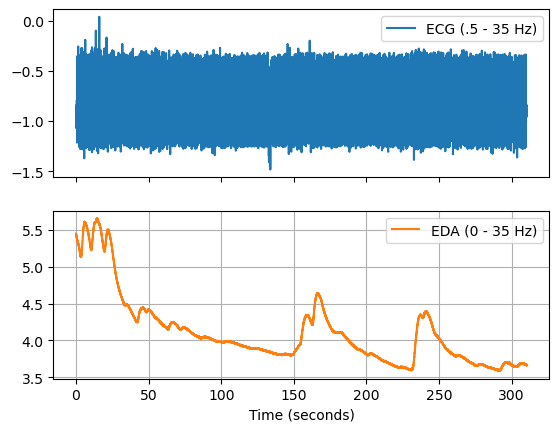

ECG of stress2_ABBA:


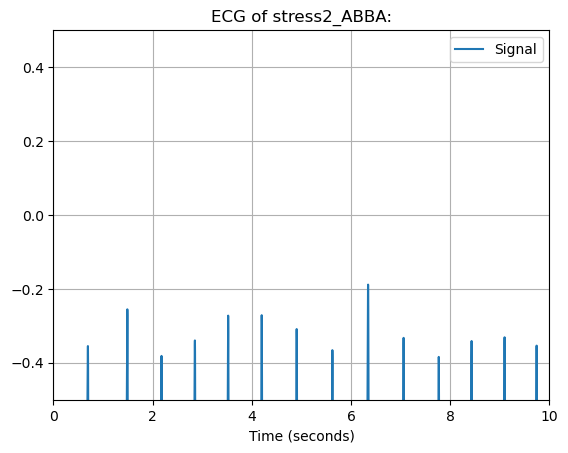

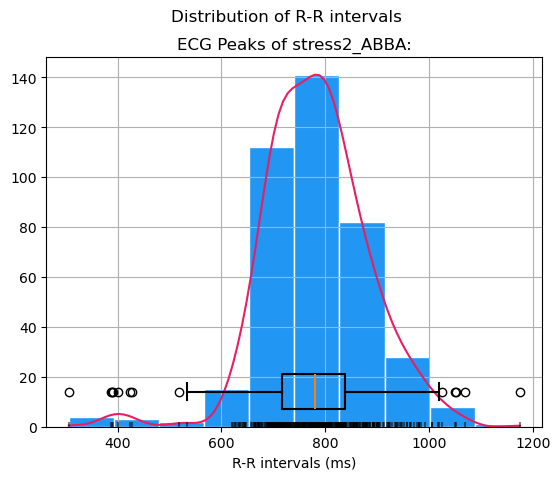

HRV of segment stress2_ABBA:
   HRV_MeanNN    HRV_SDNN  HRV_SDANN1  HRV_SDNNI1  HRV_SDANN2  HRV_SDNNI2  \
0  781.828283  105.784475   27.763008  102.618978   26.699003   103.86276   

   HRV_SDANN5  HRV_SDNNI5   HRV_RMSSD    HRV_SDSD  ...  HRV_IQRNN  \
0         NaN         NaN  100.187482  100.312086  ...      122.0   

   HRV_SDRMSSD  HRV_Prc20NN  HRV_Prc80NN  HRV_pNN50  HRV_pNN20  HRV_MinNN  \
0     1.055865        706.0        859.0  40.656566  68.939394      306.0   

   HRV_MaxNN  HRV_HTI  HRV_TINN  
0     1175.0     22.0   421.875  

[1 rows x 25 columns]
0    781.828283
Name: HRV_MeanNN, dtype: float64
0    105.784475
Name: HRV_SDNN, dtype: float64
0    100.187482
Name: HRV_RMSSD, dtype: float64


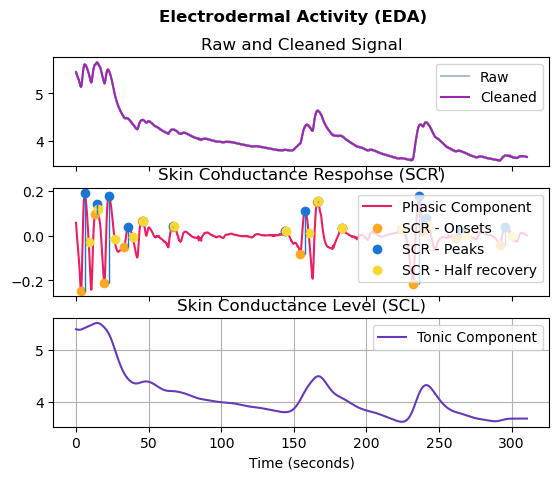

EDA of segment stress2_ABBA:
   SCR_Peaks_N  SCR_Peaks_Amplitude_Mean  EDA_Tonic_SD  EDA_Sympathetic  \
0         15.0                  0.115548      0.473852          0.00303   

   EDA_SympatheticN  EDA_Autocorrelation  
0          0.000439             0.911171  
Segment nf2_2D:


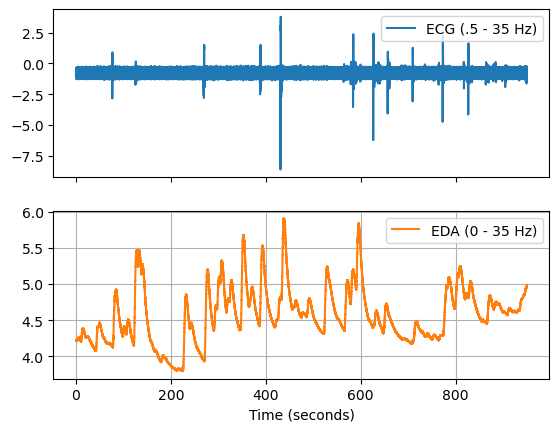

ECG of nf2_2D:


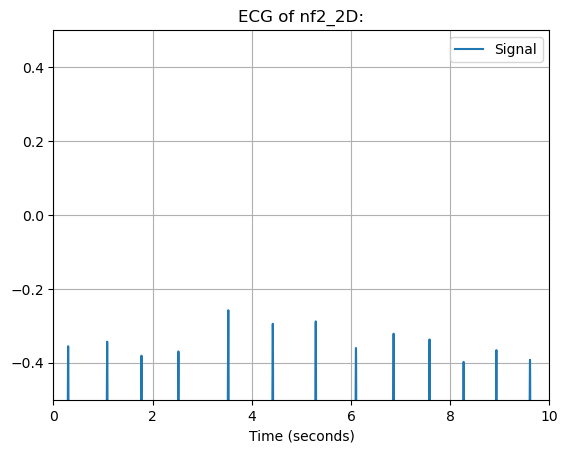

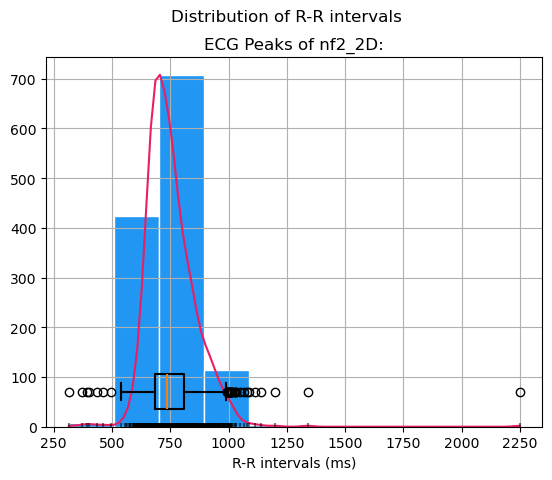

HRV of segment nf2_2D:
   HRV_MeanNN   HRV_SDNN  HRV_SDANN1  HRV_SDNNI1  HRV_SDANN2  HRV_SDNNI2  \
0  753.584591  107.65311   36.812212   97.845323   32.774701  100.351044   

   HRV_SDANN5  HRV_SDNNI5  HRV_RMSSD   HRV_SDSD  ...  HRV_IQRNN  HRV_SDRMSSD  \
0   30.864201  101.827938  98.565655  98.604848  ...      123.0     1.092197   

   HRV_Prc20NN  HRV_Prc80NN  HRV_pNN50  HRV_pNN20  HRV_MinNN  HRV_MaxNN  \
0        674.0        830.0  30.341541  65.687053      315.0     2249.0   

     HRV_HTI  HRV_TINN  
0  22.087719       0.0  

[1 rows x 25 columns]
0    753.584591
Name: HRV_MeanNN, dtype: float64
0    107.65311
Name: HRV_SDNN, dtype: float64
0    98.565655
Name: HRV_RMSSD, dtype: float64


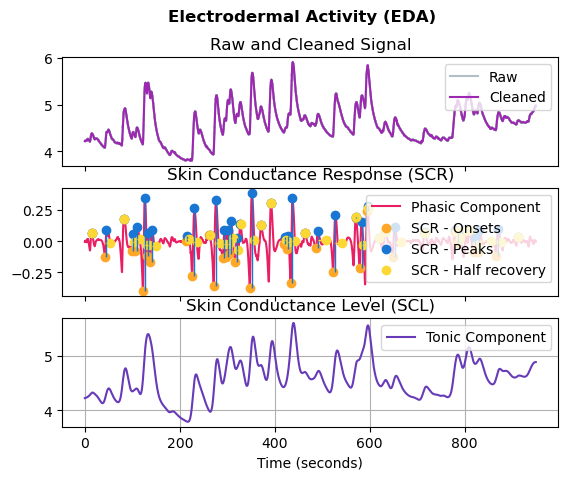

EDA of segment nf2_2D:
   SCR_Peaks_N  SCR_Peaks_Amplitude_Mean  EDA_Tonic_SD  EDA_Sympathetic  \
0         41.0                  0.180399      0.357243         0.012182   

   EDA_SympatheticN  EDA_Autocorrelation  
0          0.006911             0.825832  

For file PB1_only_part2:
segment: [stress2_ABBA] before: [None] after [nf2_2D] start [625593] end [936053]
2028515
segment: [nf2_2D] before: [stress2_ABBA] after [None] start [1126517] end [2076579] marker_inside label[nf2_2D_unlimited] marker_inside index [2028515]

File PB2:
Segment baseline:


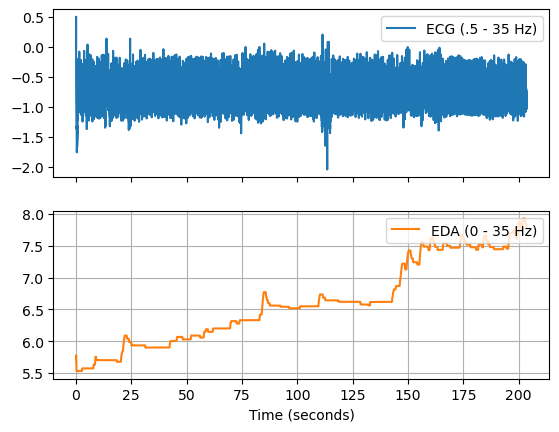

ECG of baseline:


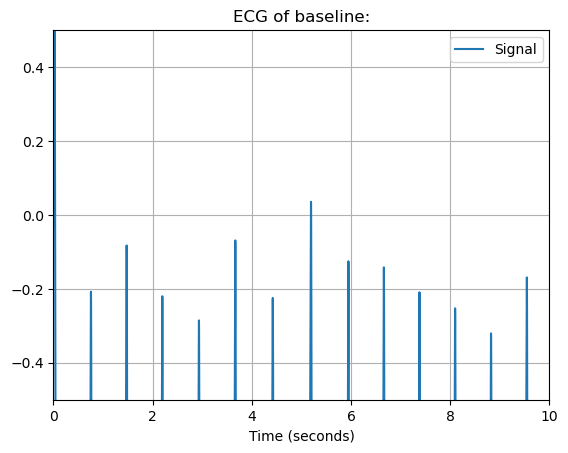

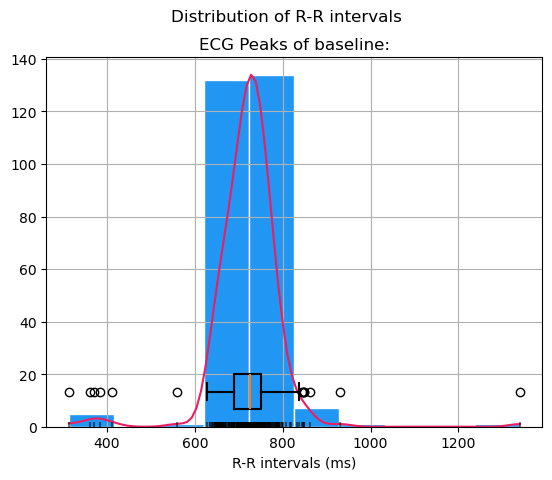

HRV of segment baseline:
   HRV_MeanNN   HRV_SDNN  HRV_SDANN1  HRV_SDNNI1  HRV_SDANN2  HRV_SDNNI2  \
0  720.266904  76.766552   21.618788   73.150928         NaN         NaN   

   HRV_SDANN5  HRV_SDNNI5  HRV_RMSSD   HRV_SDSD  ...  HRV_IQRNN  HRV_SDRMSSD  \
0         NaN         NaN    89.8708  90.031689  ...       61.0     0.854188   

   HRV_Prc20NN  HRV_Prc80NN  HRV_pNN50  HRV_pNN20  HRV_MinNN  HRV_MaxNN  \
0        682.0        759.0   6.761566   30.24911      313.0     1340.0   

     HRV_HTI  HRV_TINN  
0  12.217391  492.1875  

[1 rows x 25 columns]
0    720.266904
Name: HRV_MeanNN, dtype: float64
0    76.766552
Name: HRV_SDNN, dtype: float64
0    89.8708
Name: HRV_RMSSD, dtype: float64


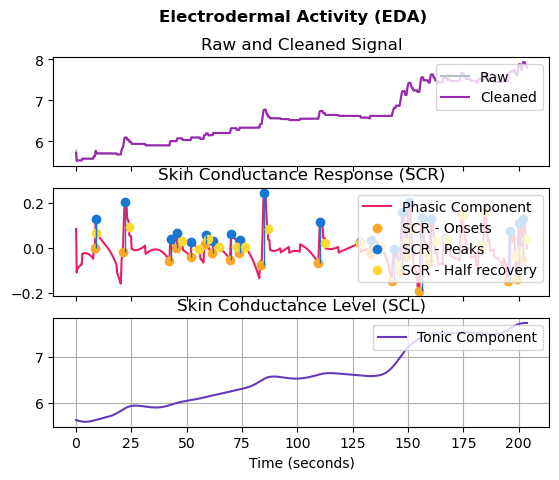

EDA of segment baseline:
   SCR_Peaks_N  SCR_Peaks_Amplitude_Mean  EDA_Tonic_SD  EDA_Sympathetic  \
0         25.0                  0.129672      0.635625         0.002753   

   EDA_SympatheticN  EDA_Autocorrelation  
0          0.000304             0.917387  
Segment stress1_MIST:


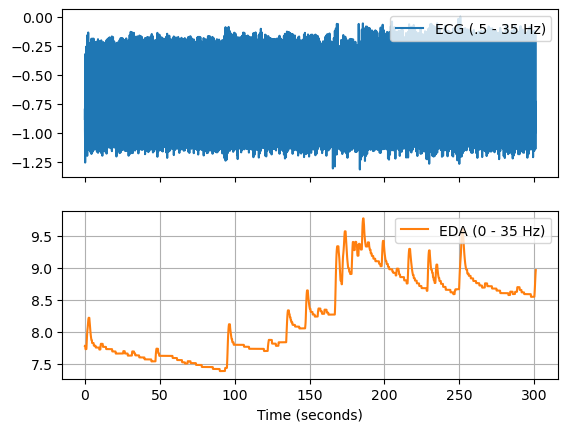

ECG of stress1_MIST:


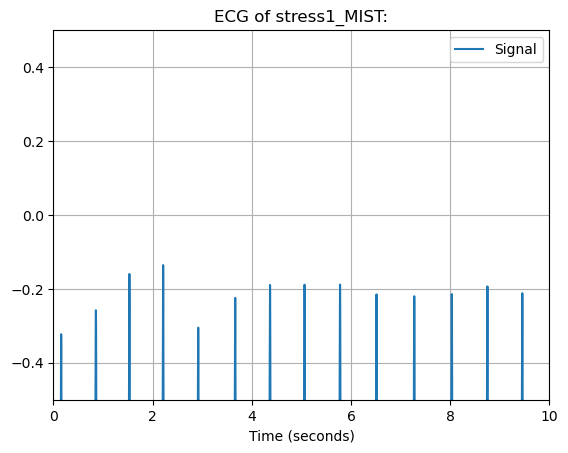

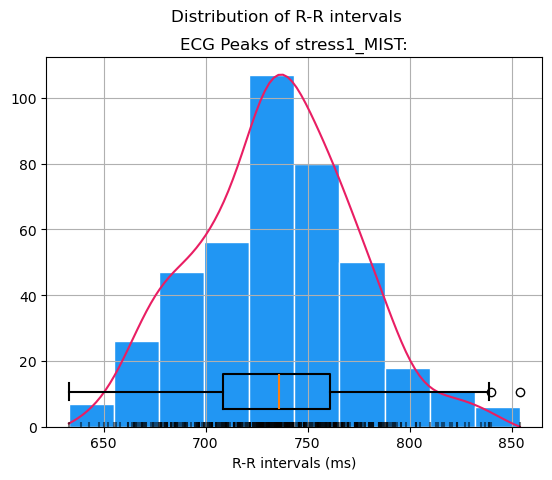

HRV of segment stress1_MIST:
   HRV_MeanNN   HRV_SDNN  HRV_SDANN1  HRV_SDNNI1  HRV_SDANN2  HRV_SDNNI2  \
0  735.137255  39.834619   16.325784   36.813485         NaN         NaN   

   HRV_SDANN5  HRV_SDNNI5  HRV_RMSSD   HRV_SDSD  ...  HRV_IQRNN  HRV_SDRMSSD  \
0         NaN         NaN  22.719635  22.746568  ...      52.25     1.753312   

   HRV_Prc20NN  HRV_Prc80NN  HRV_pNN50  HRV_pNN20  HRV_MinNN  HRV_MaxNN  \
0        701.0        767.0   2.941176  32.107843      633.0      854.0   

    HRV_HTI  HRV_TINN  
0  9.714286  164.0625  

[1 rows x 25 columns]
0    735.137255
Name: HRV_MeanNN, dtype: float64
0    39.834619
Name: HRV_SDNN, dtype: float64
0    22.719635
Name: HRV_RMSSD, dtype: float64


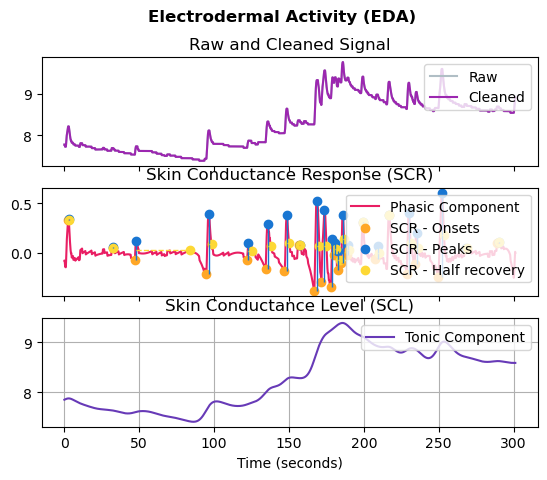

EDA of segment stress1_MIST:
   SCR_Peaks_N  SCR_Peaks_Amplitude_Mean  EDA_Tonic_SD  EDA_Sympathetic  \
0         23.0                  0.302493      0.603181         0.016057   

   EDA_SympatheticN  EDA_Autocorrelation  
0          0.001574             0.935568  
Segment nf1_VR:


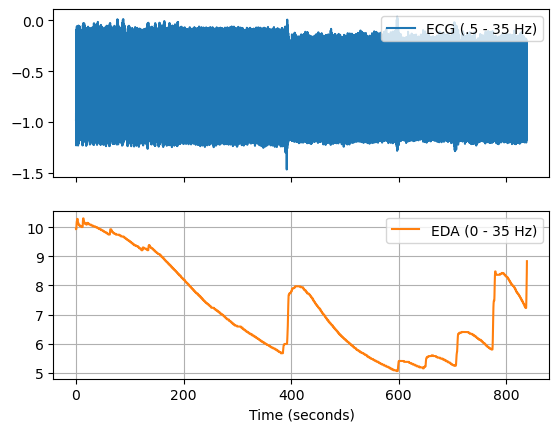

ECG of nf1_VR:


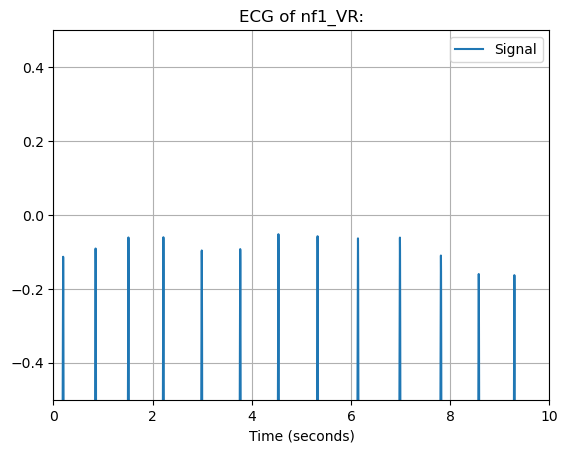

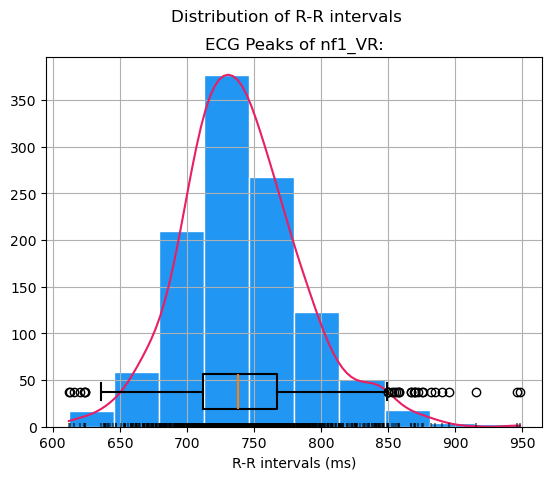

HRV of segment nf1_VR:
   HRV_MeanNN   HRV_SDNN  HRV_SDANN1  HRV_SDNNI1  HRV_SDANN2  HRV_SDNNI2  \
0  741.364925  45.859615   23.816294   37.869688   22.767001   39.953855   

   HRV_SDANN5  HRV_SDNNI5  HRV_RMSSD   HRV_SDSD  ...  HRV_IQRNN  HRV_SDRMSSD  \
0   16.764823   43.094212  22.890601  22.900738  ...       55.0     2.003426   

   HRV_Prc20NN  HRV_Prc80NN  HRV_pNN50  HRV_pNN20  HRV_MinNN  HRV_MaxNN  \
0        706.6        774.0   3.188663  33.835252      612.0      948.0   

     HRV_HTI  HRV_TINN  
0  12.010638  195.3125  

[1 rows x 25 columns]
0    741.364925
Name: HRV_MeanNN, dtype: float64
0    45.859615
Name: HRV_SDNN, dtype: float64
0    22.890601
Name: HRV_RMSSD, dtype: float64


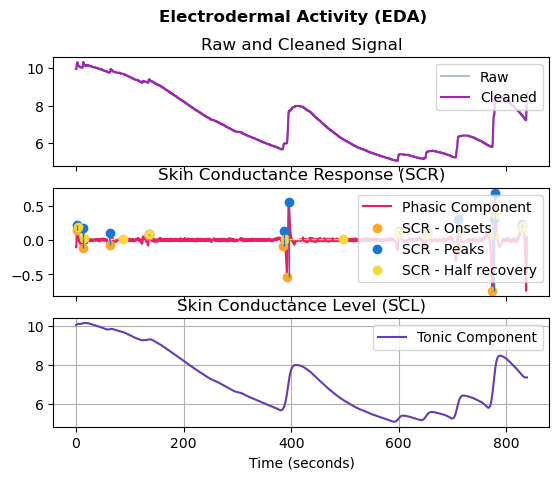

EDA of segment nf1_VR:
   SCR_Peaks_N  SCR_Peaks_Amplitude_Mean  EDA_Tonic_SD  EDA_Sympathetic  \
0         12.0                  0.336874      1.551525          0.00534   

   EDA_SympatheticN  EDA_Autocorrelation  
0          0.000803             0.982576  
Segment stress2_ABBA:


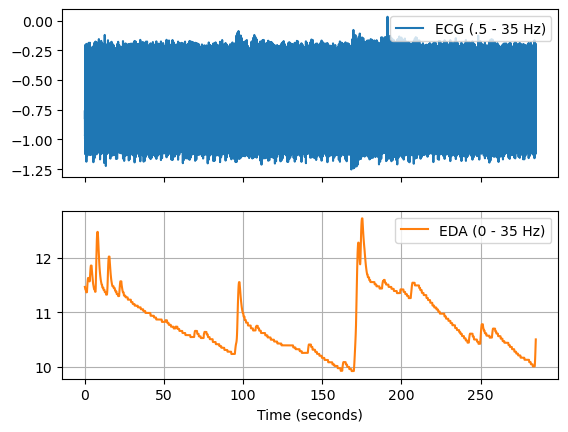

ECG of stress2_ABBA:


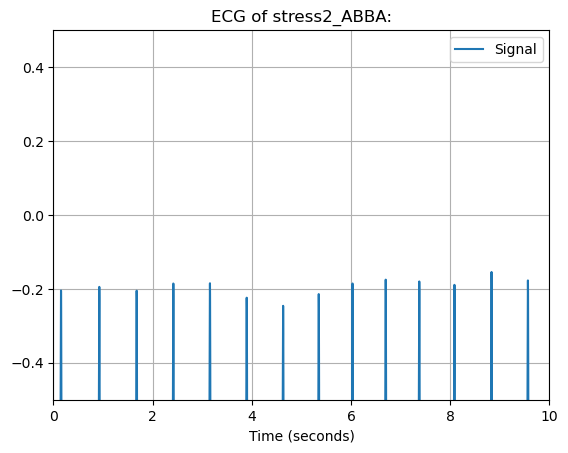

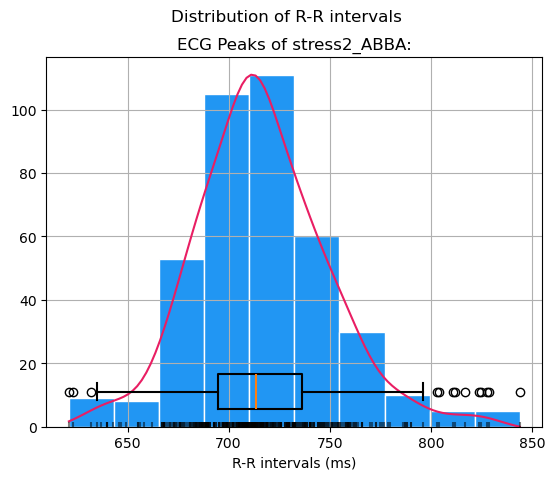

HRV of segment stress2_ABBA:
   HRV_MeanNN   HRV_SDNN  HRV_SDANN1  HRV_SDNNI1  HRV_SDANN2  HRV_SDNNI2  \
0  716.840909  34.966276    7.681257   33.499345         NaN         NaN   

   HRV_SDANN5  HRV_SDNNI5  HRV_RMSSD  HRV_SDSD  ...  HRV_IQRNN  HRV_SDRMSSD  \
0         NaN         NaN  20.474869  20.50083  ...       41.5     1.707766   

   HRV_Prc20NN  HRV_Prc80NN  HRV_pNN50  HRV_pNN20  HRV_MinNN  HRV_MaxNN  \
0        689.0        742.0   1.262626   29.79798      621.0      844.0   

    HRV_HTI  HRV_TINN  
0  7.764706   140.625  

[1 rows x 25 columns]
0    716.840909
Name: HRV_MeanNN, dtype: float64
0    34.966276
Name: HRV_SDNN, dtype: float64
0    20.474869
Name: HRV_RMSSD, dtype: float64


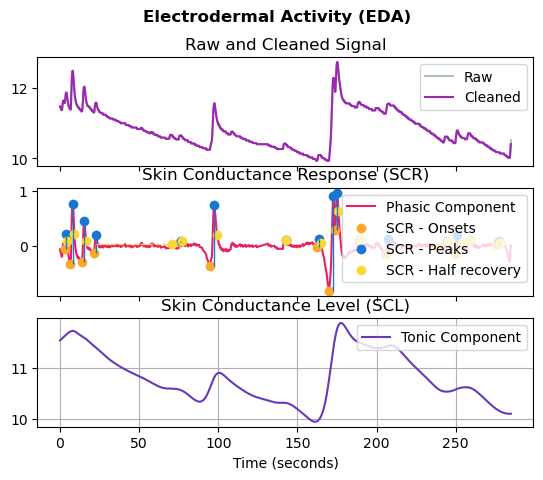

EDA of segment stress2_ABBA:
   SCR_Peaks_N  SCR_Peaks_Amplitude_Mean  EDA_Tonic_SD  EDA_Sympathetic  \
0         16.0                  0.423712      0.495994         0.019768   

   EDA_SympatheticN  EDA_Autocorrelation  
0          0.000707             0.783823  
Segment nf2_2D:


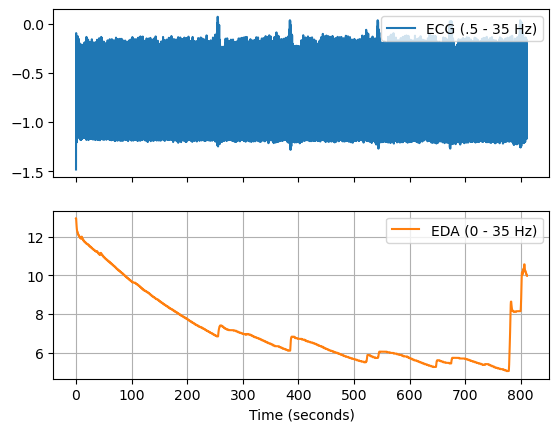

ECG of nf2_2D:


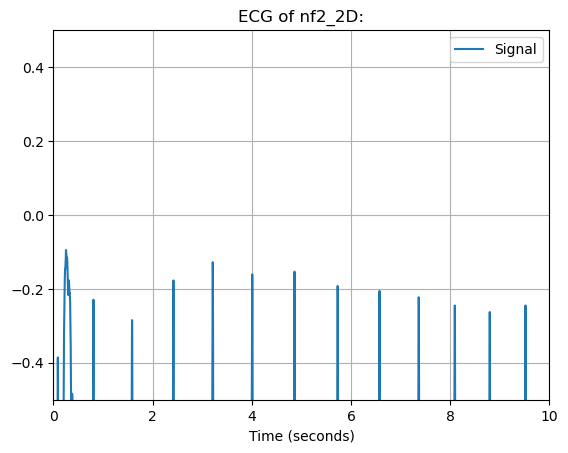

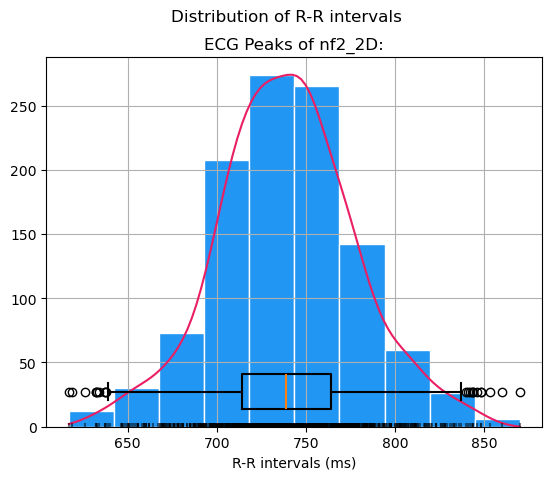

HRV of segment nf2_2D:
   HRV_MeanNN   HRV_SDNN  HRV_SDANN1  HRV_SDNNI1  HRV_SDANN2  HRV_SDNNI2  \
0  739.148723  39.672596   16.713182   36.646459   13.832469    37.38539   

   HRV_SDANN5  HRV_SDNNI5  HRV_RMSSD   HRV_SDSD  ...  HRV_IQRNN  HRV_SDRMSSD  \
0   15.498091   38.194288  18.636587  18.645095  ...       50.0     2.128748   

   HRV_Prc20NN  HRV_Prc80NN  HRV_pNN50  HRV_pNN20  HRV_MinNN  HRV_MaxNN  \
0        709.0        770.0   1.459854  26.368613      617.0      870.0   

     HRV_HTI  HRV_TINN  
0  11.183673  179.6875  

[1 rows x 25 columns]
0    739.148723
Name: HRV_MeanNN, dtype: float64
0    39.672596
Name: HRV_SDNN, dtype: float64
0    18.636587
Name: HRV_RMSSD, dtype: float64


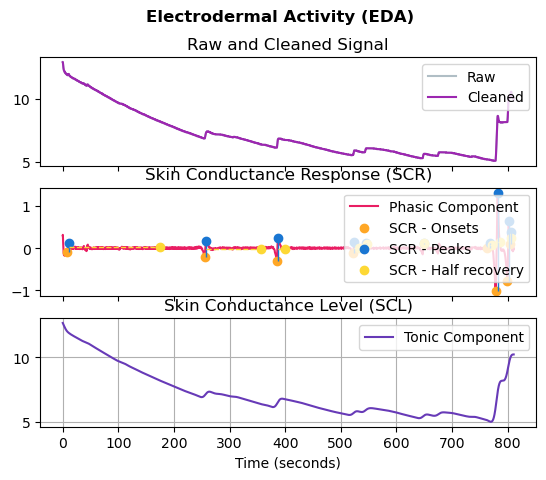

EDA of segment nf2_2D:
   SCR_Peaks_N  SCR_Peaks_Amplitude_Mean  EDA_Tonic_SD  EDA_Sympathetic  \
0         10.0                  0.561344      1.819674         0.005043   

   EDA_SympatheticN  EDA_Autocorrelation  
0          0.000647             0.962548  

For file PB2:
segment: [baseline] before: [None] after [stress1_MIST] start [0] end [203723]
segment: [stress1_MIST] before: [baseline] after [nf1_VR] start [203723] end [504807]
1562554
segment: [nf1_VR] before: [stress1_MIST] after [stress2_ABBA] start [781103] end [1619563] marker_inside label[nf1_VR_unlimited] marker_inside index [1562554]
segment: [stress2_ABBA] before: [nf1_VR] after [nf2_2D] start [2030022] end [2314915]
3223086
segment: [nf2_2D] before: [stress2_ABBA] after [None] start [2443500] end [3254602] marker_inside label[nf2_2D_unlimited] marker_inside index [3223086]

File PB3:
Segment baseline:


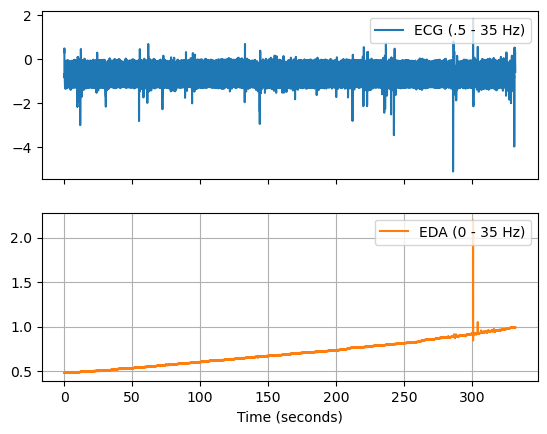

ECG of baseline:


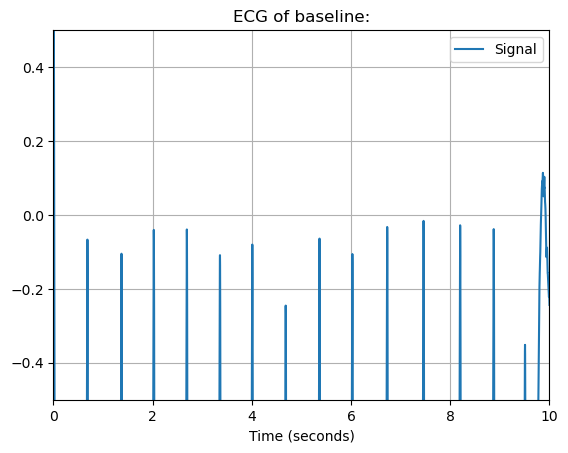

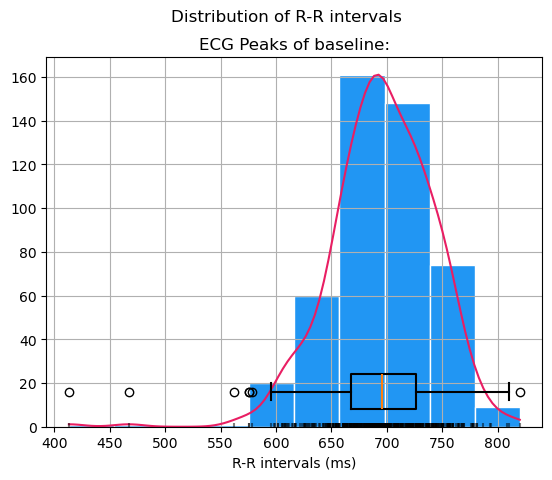

HRV of segment baseline:
   HRV_MeanNN   HRV_SDNN  HRV_SDANN1  HRV_SDNNI1  HRV_SDANN2  HRV_SDNNI2  \
0  695.682105  46.328241   15.720606   42.235612   14.912743   42.936948   

   HRV_SDANN5  HRV_SDNNI5  HRV_RMSSD   HRV_SDSD  ...  HRV_IQRNN  HRV_SDRMSSD  \
0         NaN         NaN  44.595013  44.638351  ...       58.5     1.038866   

   HRV_Prc20NN  HRV_Prc80NN  HRV_pNN50  HRV_pNN20  HRV_MinNN  HRV_MaxNN  \
0        662.0        734.2  16.421053  54.315789      413.0      820.0   

     HRV_HTI  HRV_TINN  
0  11.585366     375.0  

[1 rows x 25 columns]
0    695.682105
Name: HRV_MeanNN, dtype: float64
0    46.328241
Name: HRV_SDNN, dtype: float64
0    44.595013
Name: HRV_RMSSD, dtype: float64


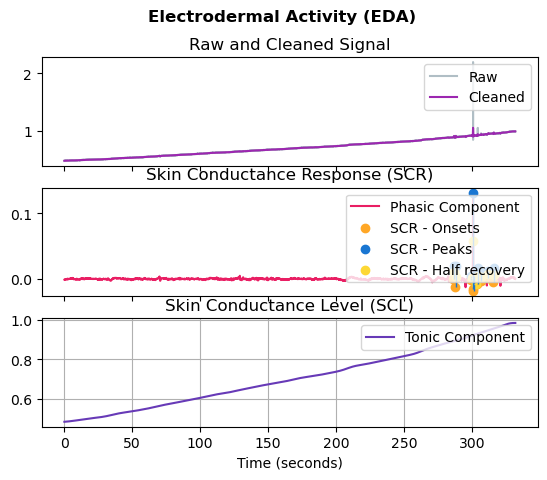

EDA of segment baseline:
   SCR_Peaks_N  SCR_Peaks_Amplitude_Mean  EDA_Tonic_SD  EDA_Sympathetic  \
0          9.0                   0.03297      0.142912         0.000002   

   EDA_SympatheticN  EDA_Autocorrelation  
0           0.00005             0.960121  
Segment stress1_MIST:


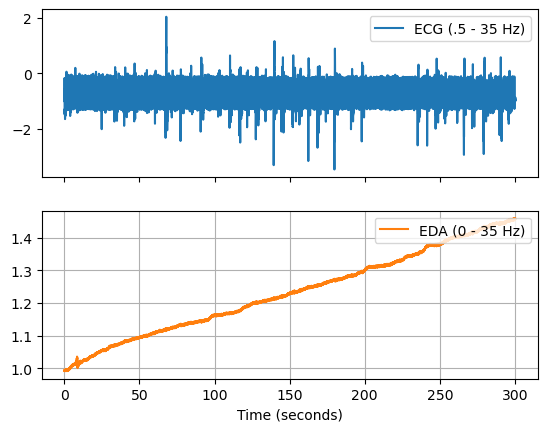

ECG of stress1_MIST:


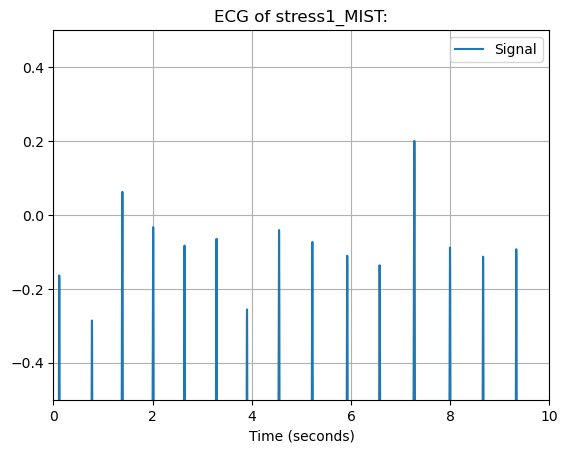

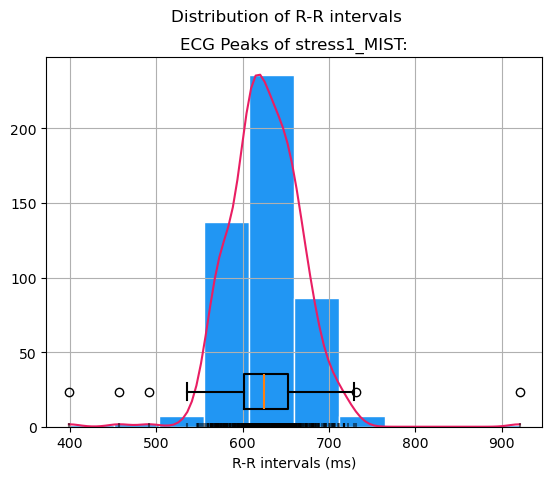

HRV of segment stress1_MIST:
   HRV_MeanNN   HRV_SDNN  HRV_SDANN1  HRV_SDNNI1  HRV_SDANN2  HRV_SDNNI2  \
0  626.475891  42.179214   15.609213   39.752782         NaN         NaN   

   HRV_SDANN5  HRV_SDNNI5  HRV_RMSSD   HRV_SDSD  ...  HRV_IQRNN  HRV_SDRMSSD  \
0         NaN         NaN  43.997422  44.043659  ...       51.0     0.958675   

   HRV_Prc20NN  HRV_Prc80NN  HRV_pNN50  HRV_pNN20  HRV_MinNN  HRV_MaxNN  \
0        595.0        659.0   5.660377  44.863732      399.0      921.0   

     HRV_HTI  HRV_TINN  
0  10.369565  304.6875  

[1 rows x 25 columns]
0    626.475891
Name: HRV_MeanNN, dtype: float64
0    42.179214
Name: HRV_SDNN, dtype: float64
0    43.997422
Name: HRV_RMSSD, dtype: float64


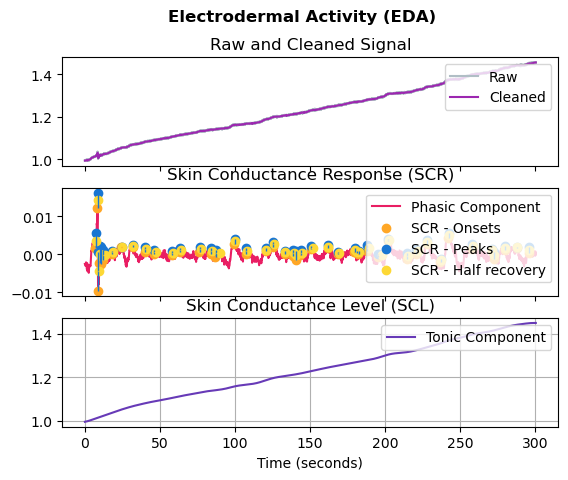

EDA of segment stress1_MIST:
   SCR_Peaks_N  SCR_Peaks_Amplitude_Mean  EDA_Tonic_SD  EDA_Sympathetic  \
0         44.0                  0.001601       0.12702         0.000003   

   EDA_SympatheticN  EDA_Autocorrelation  
0          0.000018             0.955182  
Segment nf1_2D:


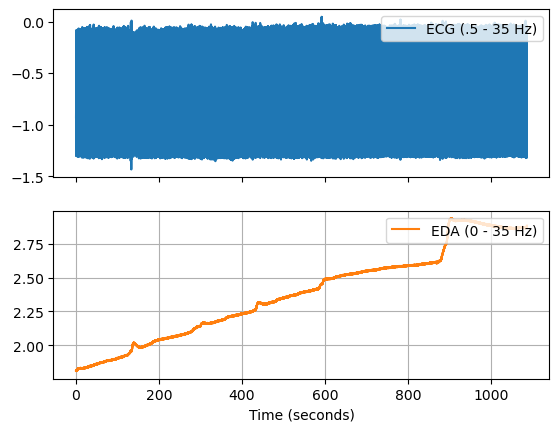

ECG of nf1_2D:


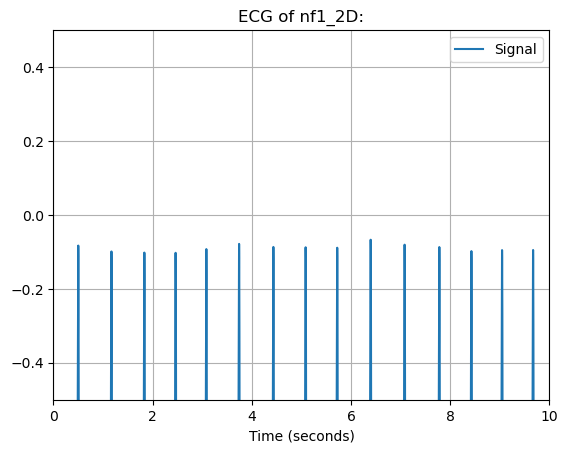

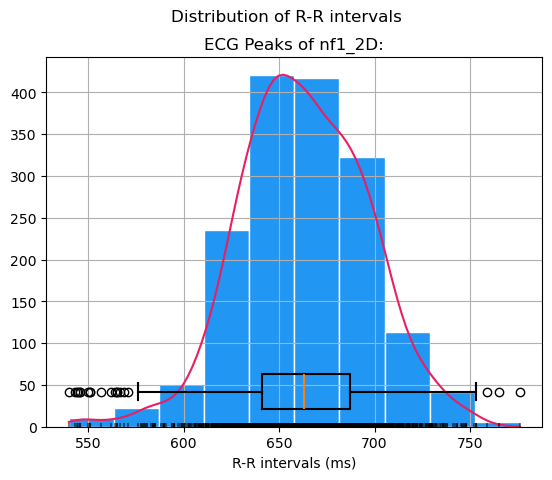

HRV of segment nf1_2D:
   HRV_MeanNN   HRV_SDNN  HRV_SDANN1  HRV_SDNNI1  HRV_SDANN2  HRV_SDNNI2  \
0  662.823673  34.061121    9.197986   32.632399    6.831503    33.37655   

   HRV_SDANN5  HRV_SDNNI5  HRV_RMSSD   HRV_SDSD  ...  HRV_IQRNN  HRV_SDRMSSD  \
0     4.71126   33.001682  25.912575  25.920485  ...       46.0     1.314463   

   HRV_Prc20NN  HRV_Prc80NN  HRV_pNN50  HRV_pNN20  HRV_MinNN  HRV_MaxNN  \
0        635.0        692.0   4.697987  43.990238      540.0      776.0   

     HRV_HTI  HRV_TINN  
0  10.055215       0.0  

[1 rows x 25 columns]
0    662.823673
Name: HRV_MeanNN, dtype: float64
0    34.061121
Name: HRV_SDNN, dtype: float64
0    25.912575
Name: HRV_RMSSD, dtype: float64


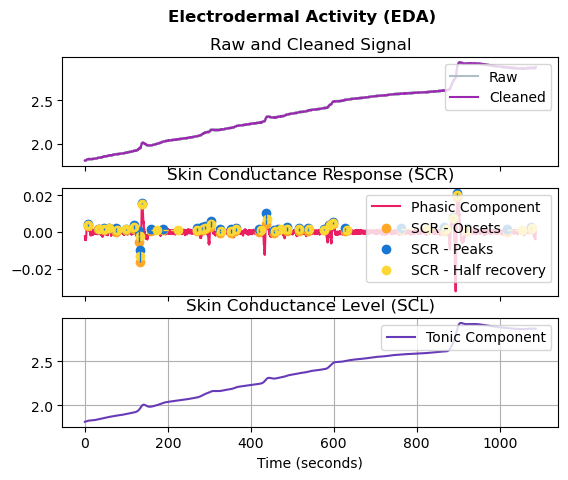

EDA of segment nf1_2D:
   SCR_Peaks_N  SCR_Peaks_Amplitude_Mean  EDA_Tonic_SD  EDA_Sympathetic  \
0         37.0                   0.00172      0.331362         0.000014   

   EDA_SympatheticN  EDA_Autocorrelation  
0          0.000113             0.990036  
Segment stress2_ABBA:


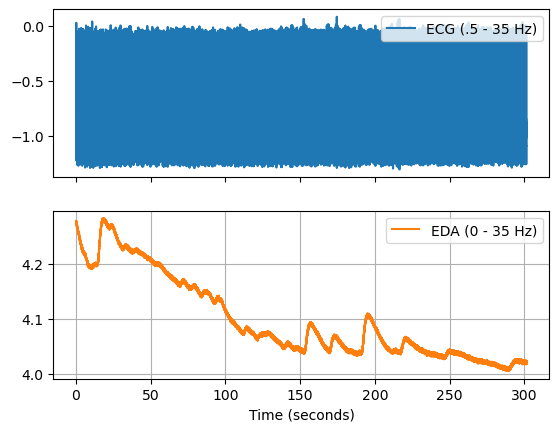

ECG of stress2_ABBA:


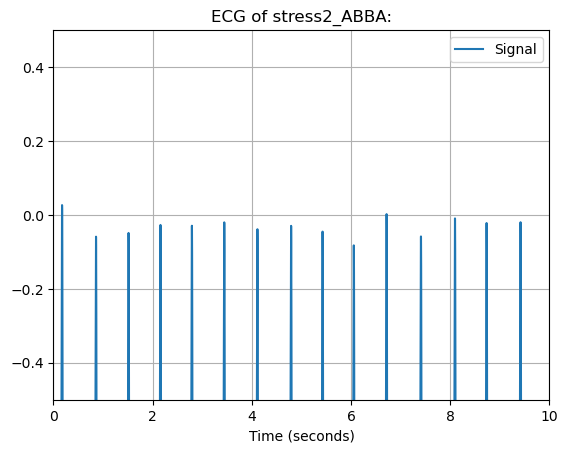

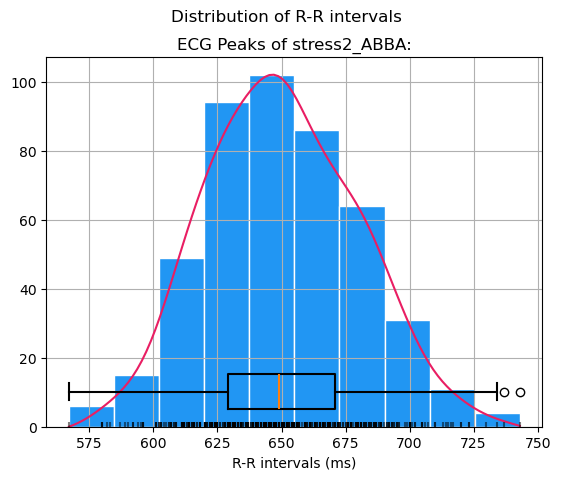

HRV of segment stress2_ABBA:
   HRV_MeanNN  HRV_SDNN  HRV_SDANN1  HRV_SDNNI1  HRV_SDANN2  HRV_SDNNI2  \
0  650.424242  30.46298   13.335428   28.091193   11.940058    27.65643   

   HRV_SDANN5  HRV_SDNNI5  HRV_RMSSD   HRV_SDSD  ...  HRV_IQRNN  HRV_SDRMSSD  \
0         NaN         NaN  26.413777  26.442429  ...       42.0     1.153299   

   HRV_Prc20NN  HRV_Prc80NN  HRV_pNN50  HRV_pNN20  HRV_MinNN  HRV_MaxNN  \
0        624.0        677.0   4.978355  44.805195      567.0      743.0   

    HRV_HTI  HRV_TINN  
0  8.884615  148.4375  

[1 rows x 25 columns]
0    650.424242
Name: HRV_MeanNN, dtype: float64
0    30.46298
Name: HRV_SDNN, dtype: float64
0    26.413777
Name: HRV_RMSSD, dtype: float64


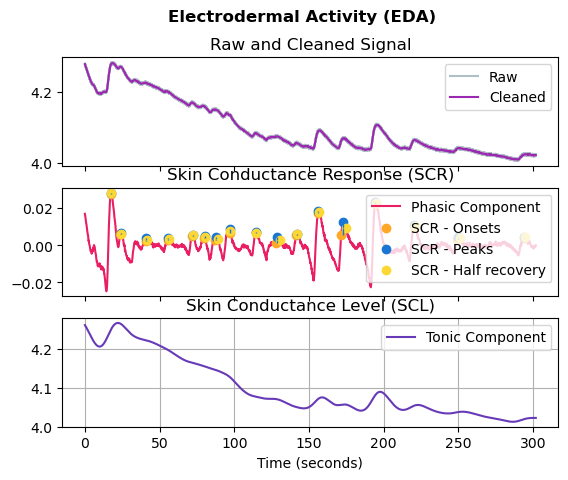

EDA of segment stress2_ABBA:
   SCR_Peaks_N  SCR_Peaks_Amplitude_Mean  EDA_Tonic_SD  EDA_Sympathetic  \
0         17.0                  0.001418      0.075258         0.000078   

   EDA_SympatheticN  EDA_Autocorrelation  
0          0.000028             0.943562  
Segment nf2_VR:


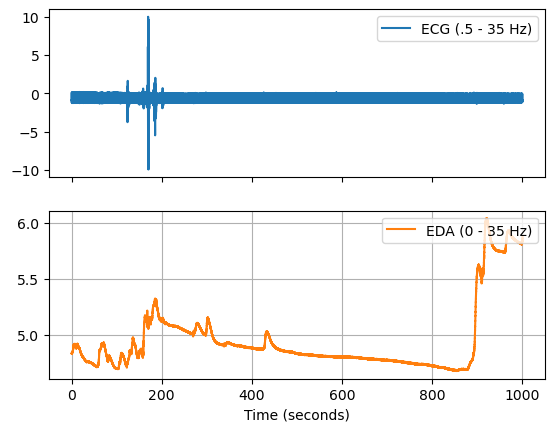

ECG of nf2_VR:


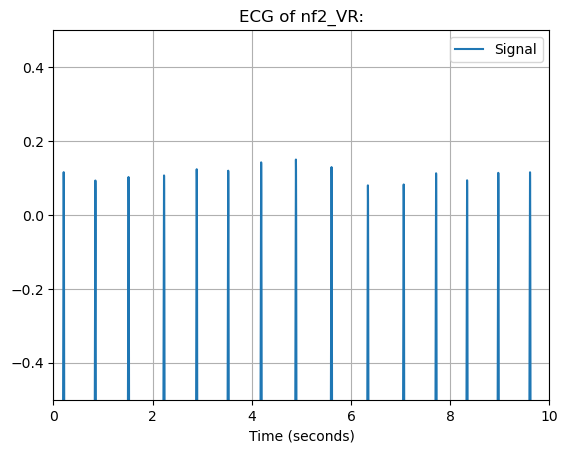

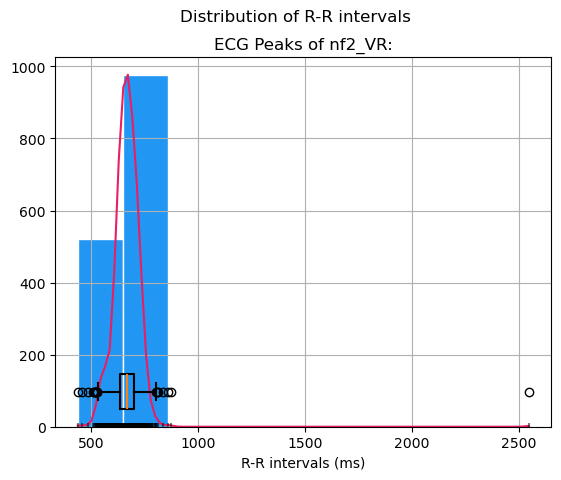

HRV of segment nf2_VR:
   HRV_MeanNN  HRV_SDNN  HRV_SDANN1  HRV_SDNNI1  HRV_SDANN2  HRV_SDNNI2  \
0  665.682212  71.39813   16.896686   53.928244   15.280329   58.171896   

   HRV_SDANN5  HRV_SDNNI5  HRV_RMSSD   HRV_SDSD  ...  HRV_IQRNN  HRV_SDRMSSD  \
0    6.623105    64.53386  82.399689  82.427168  ...       68.0     0.866485   

   HRV_Prc20NN  HRV_Prc80NN  HRV_pNN50  HRV_pNN20  HRV_MinNN  HRV_MaxNN  \
0        626.0        709.0  10.126582  51.165889      437.0     2545.0   

     HRV_HTI  HRV_TINN  
0  14.861386       0.0  

[1 rows x 25 columns]
0    665.682212
Name: HRV_MeanNN, dtype: float64
0    71.39813
Name: HRV_SDNN, dtype: float64
0    82.399689
Name: HRV_RMSSD, dtype: float64


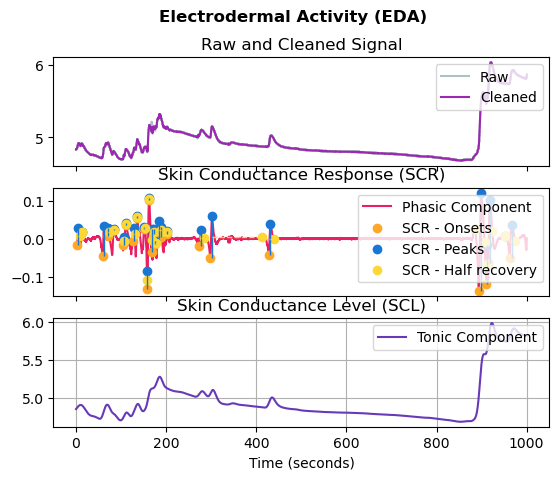

EDA of segment nf2_VR:
   SCR_Peaks_N  SCR_Peaks_Amplitude_Mean  EDA_Tonic_SD  EDA_Sympathetic  \
0         27.0                  0.046973      0.310286         0.000717   

   EDA_SympatheticN  EDA_Autocorrelation  
0          0.000654             0.968548  

For file PB3:
segment: [baseline] before: [None] after [stress1_MIST] start [12550] end [344507]
segment: [stress1_MIST] before: [baseline] after [nf1_2D] start [344507] end [644714]
1780916
segment: [nf1_2D] before: [stress1_MIST] after [stress2_ABBA] start [881405] end [1968321] marker_inside label[nf1_2D_unlimited] marker_inside index [1780916]
segment: [stress2_ABBA] before: [nf1_2D] after [nf2_VR] start [2477702] end [2779498]
4062223
segment: [nf2_VR] before: [stress2_ABBA] after [None] start [3165299] end [4165931] marker_inside label[nf2_VR_unlimited] marker_inside index [4062223]

File PB4:
Segment baseline:


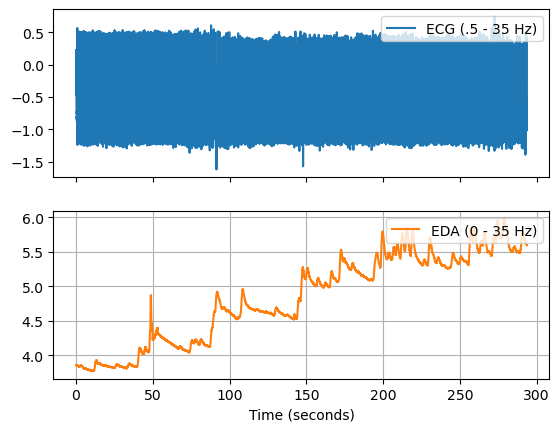

ECG of baseline:


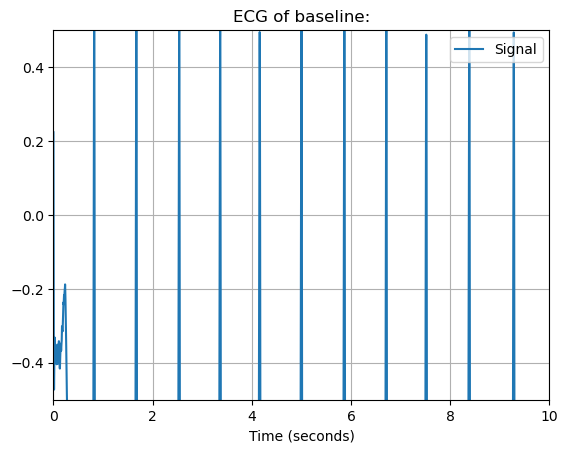

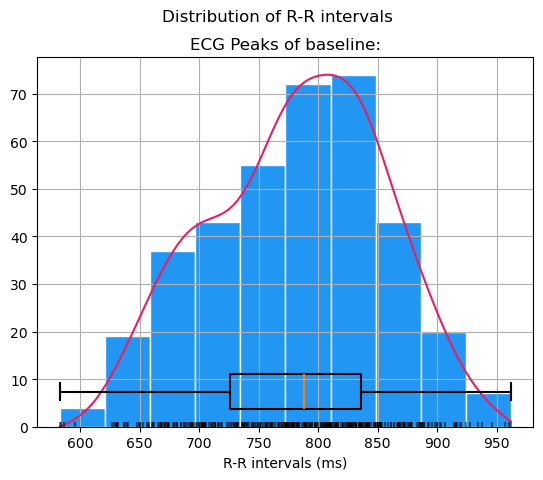

HRV of segment baseline:
   HRV_MeanNN  HRV_SDNN  HRV_SDANN1  HRV_SDNNI1  HRV_SDANN2  HRV_SDNNI2  \
0  781.240642  76.68938   27.385314   72.758732         NaN         NaN   

   HRV_SDANN5  HRV_SDNNI5  HRV_RMSSD   HRV_SDSD  ...  HRV_IQRNN  HRV_SDRMSSD  \
0         NaN         NaN  54.463506  54.534567  ...     109.75     1.408087   

   HRV_Prc20NN  HRV_Prc80NN  HRV_pNN50  HRV_pNN20  HRV_MinNN  HRV_MaxNN  \
0        704.6        847.0  32.887701  69.518717      583.0      962.0   

   HRV_HTI  HRV_TINN  
0     17.0  226.5625  

[1 rows x 25 columns]
0    781.240642
Name: HRV_MeanNN, dtype: float64
0    76.68938
Name: HRV_SDNN, dtype: float64
0    54.463506
Name: HRV_RMSSD, dtype: float64


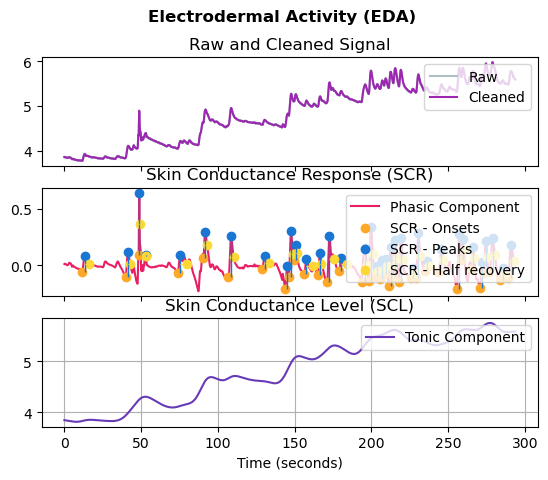

EDA of segment baseline:
   SCR_Peaks_N  SCR_Peaks_Amplitude_Mean  EDA_Tonic_SD  EDA_Sympathetic  \
0         35.0                  0.242828      0.629573         0.007125   

   EDA_SympatheticN  EDA_Autocorrelation  
0          0.002802             0.935082  
Segment stress1_ABBA:


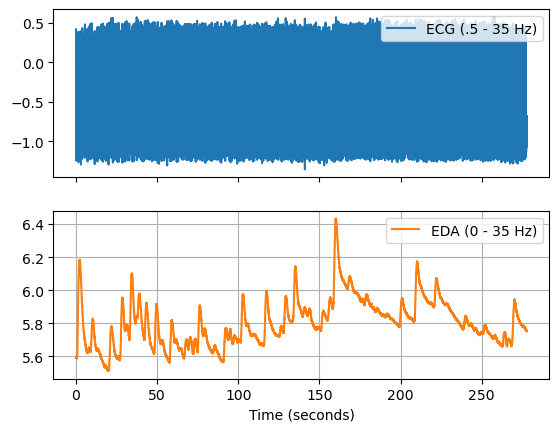

ECG of stress1_ABBA:


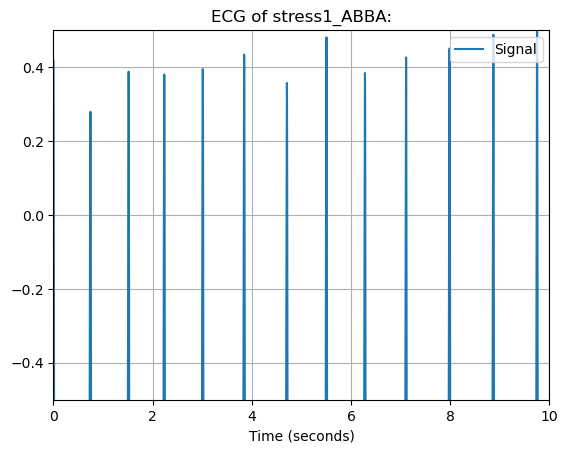

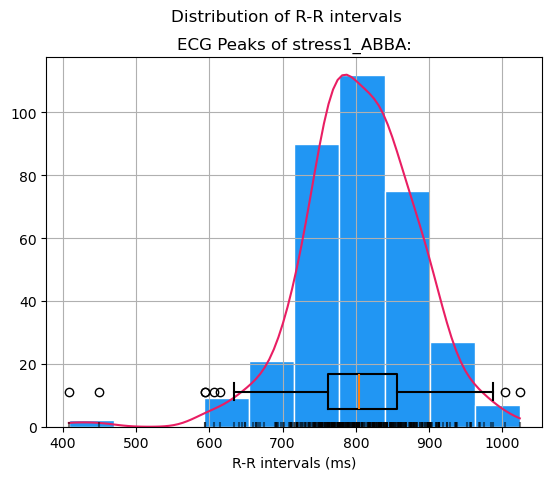

HRV of segment stress1_ABBA:
   HRV_MeanNN   HRV_SDNN  HRV_SDANN1  HRV_SDNNI1  HRV_SDANN2  HRV_SDNNI2  \
0  805.781341  78.299892   31.275765   73.642581         NaN         NaN   

   HRV_SDANN5  HRV_SDNNI5  HRV_RMSSD   HRV_SDSD  ...  HRV_IQRNN  HRV_SDRMSSD  \
0         NaN         NaN  80.013869  80.130967  ...       94.0     0.978579   

   HRV_Prc20NN  HRV_Prc80NN  HRV_pNN50  HRV_pNN20  HRV_MinNN  HRV_MaxNN  \
0        752.4        868.6  42.857143  79.591837      408.0     1024.0   

     HRV_HTI  HRV_TINN  
0  16.333333  429.6875  

[1 rows x 25 columns]
0    805.781341
Name: HRV_MeanNN, dtype: float64
0    78.299892
Name: HRV_SDNN, dtype: float64
0    80.013869
Name: HRV_RMSSD, dtype: float64


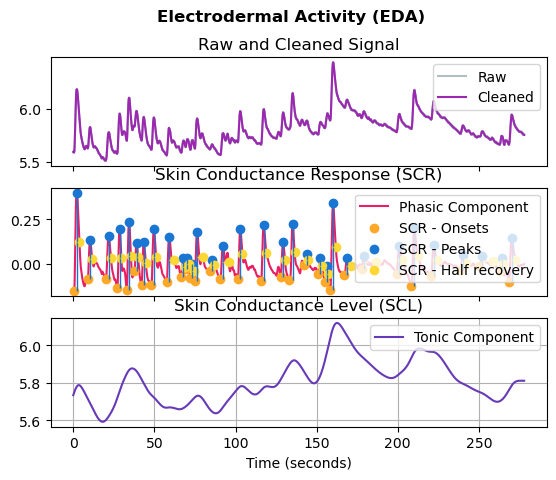

EDA of segment stress1_ABBA:
   SCR_Peaks_N  SCR_Peaks_Amplitude_Mean  EDA_Tonic_SD  EDA_Sympathetic  \
0         32.0                  0.205725      0.114615         0.004661   

   EDA_SympatheticN  EDA_Autocorrelation  
0          0.000898             0.553131  
Segment nf1_2D:


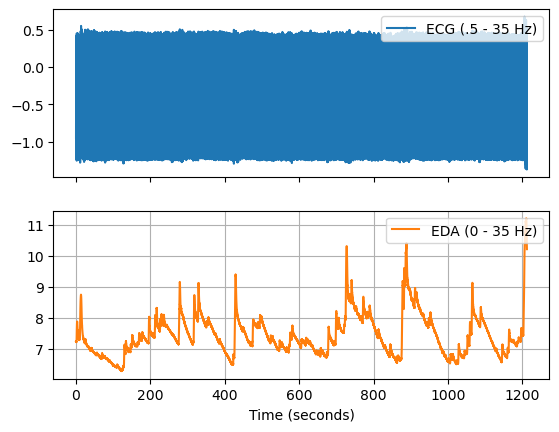

ECG of nf1_2D:


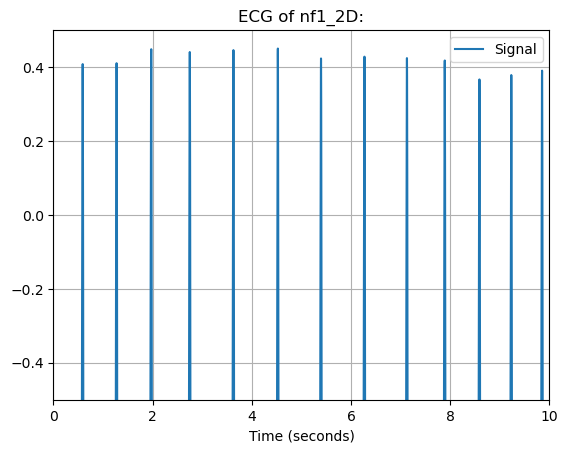

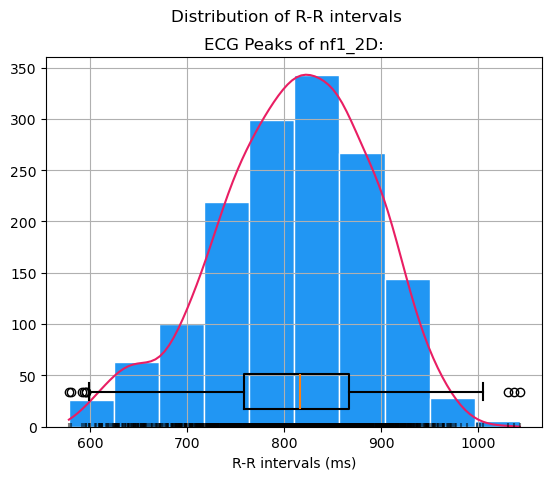

HRV of segment nf1_2D:
   HRV_MeanNN   HRV_SDNN  HRV_SDANN1  HRV_SDNNI1  HRV_SDANN2  HRV_SDNNI2  \
0  810.050836  80.149167   21.991177   74.566874   10.197063   78.474833   

   HRV_SDANN5  HRV_SDNNI5  HRV_RMSSD   HRV_SDSD  ...  HRV_IQRNN  HRV_SDRMSSD  \
0    11.17694   78.614248  57.781451  57.800775  ...      108.0     1.387109   

   HRV_Prc20NN  HRV_Prc80NN  HRV_pNN50  HRV_pNN20  HRV_MinNN  HRV_MaxNN  \
0        744.0        881.0  40.267559  75.986622      578.0     1043.0   

     HRV_HTI  HRV_TINN  
0  21.985294    406.25  

[1 rows x 25 columns]
0    810.050836
Name: HRV_MeanNN, dtype: float64
0    80.149167
Name: HRV_SDNN, dtype: float64
0    57.781451
Name: HRV_RMSSD, dtype: float64


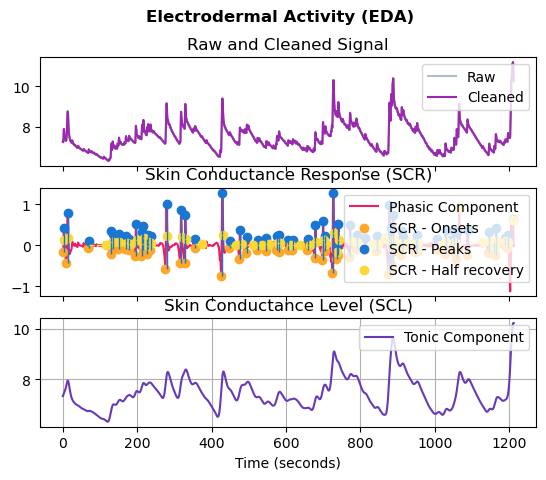

EDA of segment nf1_2D:
   SCR_Peaks_N  SCR_Peaks_Amplitude_Mean  EDA_Tonic_SD  EDA_Sympathetic  \
0         61.0                  0.550405      0.621374         0.025592   

   EDA_SympatheticN  EDA_Autocorrelation  
0          0.006114             0.798854  
Segment stress2_MIST:


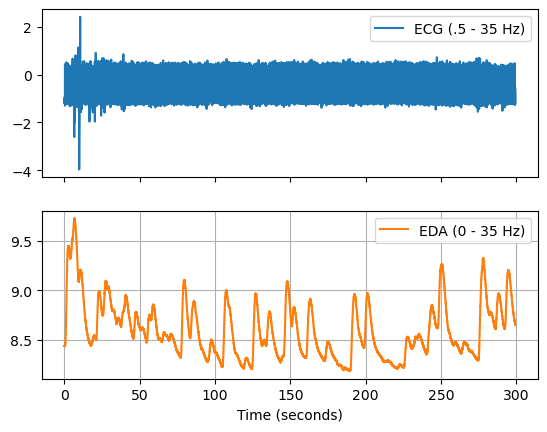

ECG of stress2_MIST:


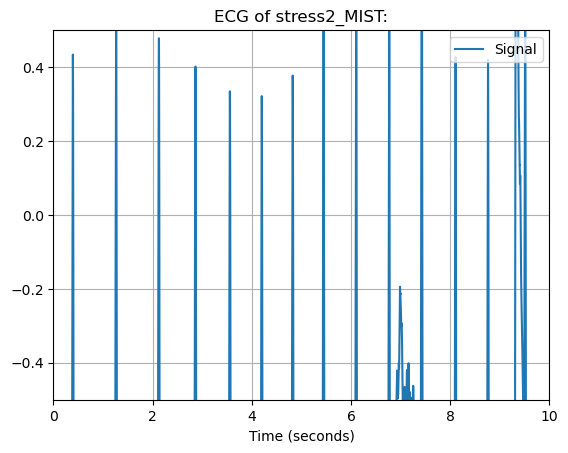

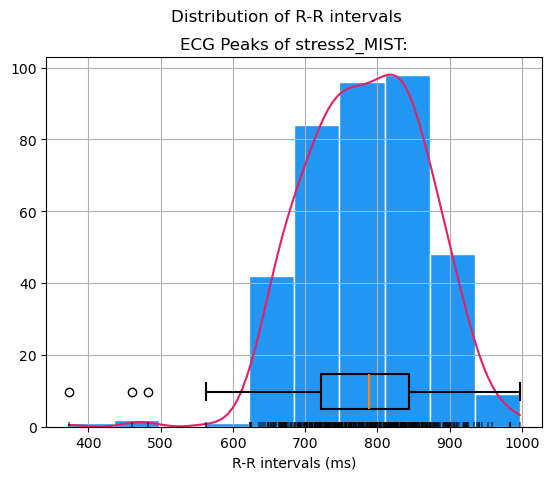

HRV of segment stress2_MIST:
   HRV_MeanNN   HRV_SDNN  HRV_SDANN1  HRV_SDNNI1  HRV_SDANN2  HRV_SDNNI2  \
0  783.391076  84.984004   15.937753   83.075327         NaN         NaN   

   HRV_SDANN5  HRV_SDNNI5  HRV_RMSSD   HRV_SDSD  ...  HRV_IQRNN  HRV_SDRMSSD  \
0         NaN         NaN  70.965373  71.058918  ...      122.0     1.197542   

   HRV_Prc20NN  HRV_Prc80NN  HRV_pNN50  HRV_pNN20  HRV_MinNN  HRV_MaxNN  \
0        710.0        858.0  39.895013   71.91601      373.0      997.0   

     HRV_HTI  HRV_TINN  
0  22.411765  429.6875  

[1 rows x 25 columns]
0    783.391076
Name: HRV_MeanNN, dtype: float64
0    84.984004
Name: HRV_SDNN, dtype: float64
0    70.965373
Name: HRV_RMSSD, dtype: float64


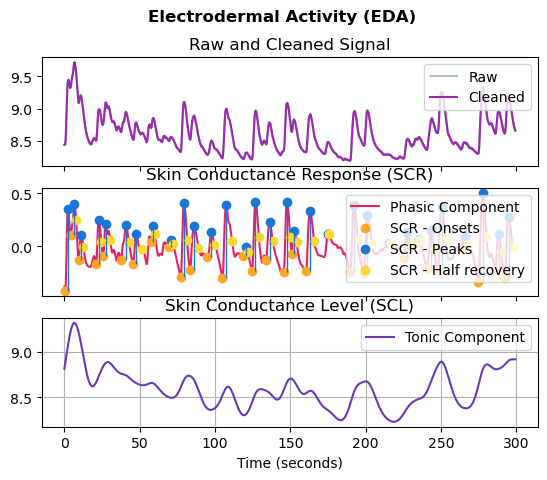

EDA of segment stress2_MIST:
   SCR_Peaks_N  SCR_Peaks_Amplitude_Mean  EDA_Tonic_SD  EDA_Sympathetic  \
0         31.0                  0.378479      0.210982         0.022139   

   EDA_SympatheticN  EDA_Autocorrelation  
0          0.001848              0.39215  
Segment nf2_VR:


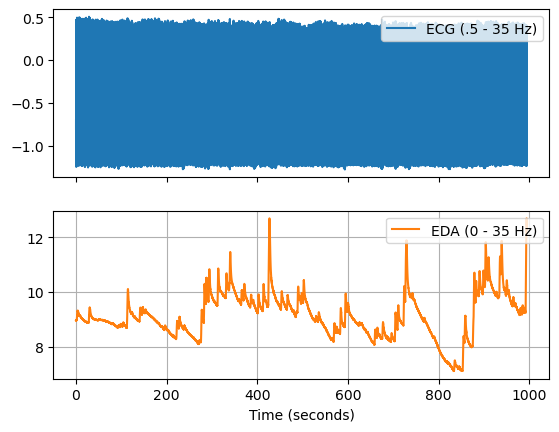

ECG of nf2_VR:


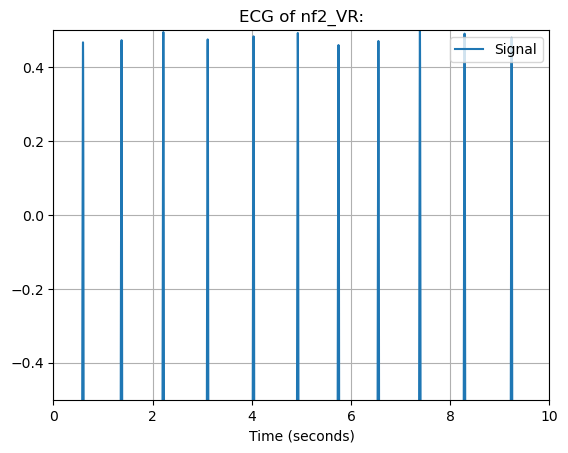

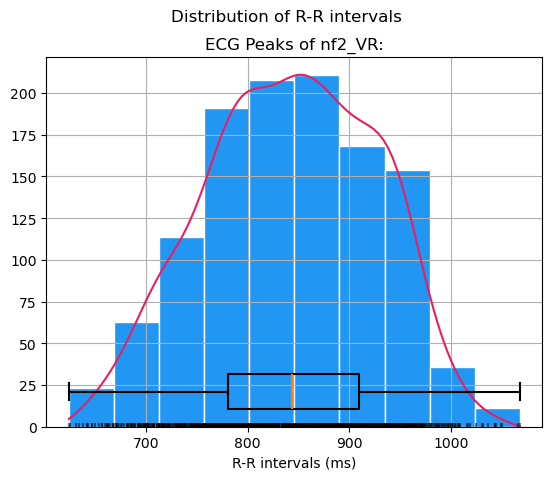

HRV of segment nf2_VR:
   HRV_MeanNN   HRV_SDNN  HRV_SDANN1  HRV_SDNNI1  HRV_SDANN2  HRV_SDNNI2  \
0  842.433418  85.539839   16.069144   83.145479   10.620203   85.980872   

   HRV_SDANN5  HRV_SDNNI5  HRV_RMSSD   HRV_SDSD  ...  HRV_IQRNN  HRV_SDRMSSD  \
0    7.514784   87.311708  64.414629  64.441987  ...      129.0     1.327957   

   HRV_Prc20NN  HRV_Prc80NN  HRV_pNN50  HRV_pNN20  HRV_MinNN  HRV_MaxNN  \
0        766.0        923.0  45.971162  76.844784      624.0     1068.0   

   HRV_HTI  HRV_TINN  
0  24.5625  414.0625  

[1 rows x 25 columns]
0    842.433418
Name: HRV_MeanNN, dtype: float64
0    85.539839
Name: HRV_SDNN, dtype: float64
0    64.414629
Name: HRV_RMSSD, dtype: float64


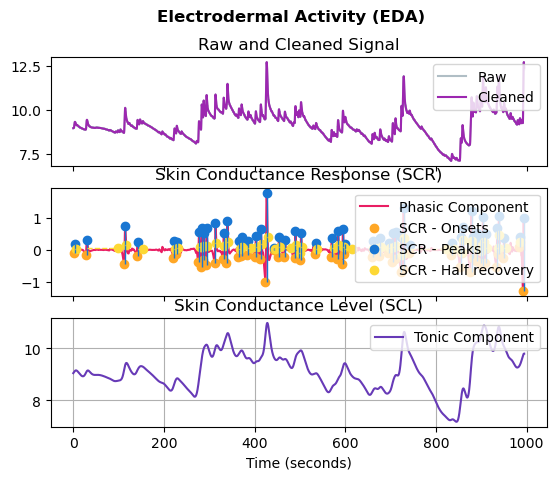

EDA of segment nf2_VR:
   SCR_Peaks_N  SCR_Peaks_Amplitude_Mean  EDA_Tonic_SD  EDA_Sympathetic  \
0         53.0                  0.835829       0.76366         0.040599   

   EDA_SympatheticN  EDA_Autocorrelation  
0          0.008691             0.842803  

For file PB4:
segment: [baseline] before: [None] after [stress1_ABBA] start [57700] end [351394]
segment: [stress1_ABBA] before: [baseline] after [nf1_2D] start [351394] end [629301]
1972504
segment: [nf1_2D] before: [stress1_ABBA] after [stress2_MIST] start [1071782] end [2283824] marker_inside label[nf1_2D_unlimited] marker_inside index [1972504]
segment: [stress2_MIST] before: [nf1_2D] after [nf2_VR] start [2810013] end [3109227]
4509476
segment: [nf2_VR] before: [stress2_MIST] after [None] start [3610172] end [4604696] marker_inside label[nf2_VR_unlimited] marker_inside index [4509476]

File PB5:
Segment baseline:


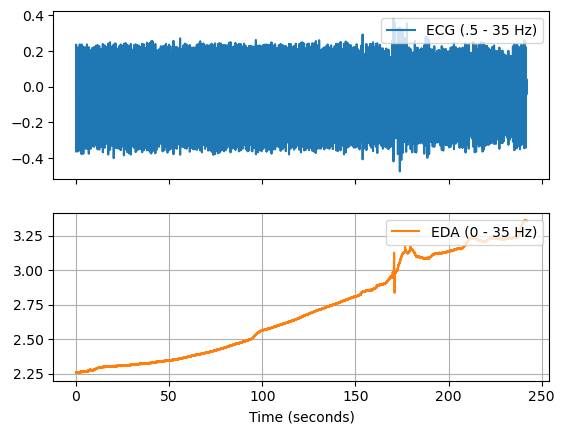

ECG of baseline:


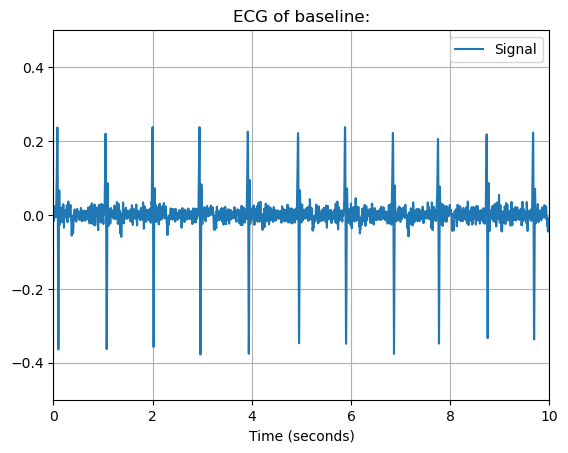

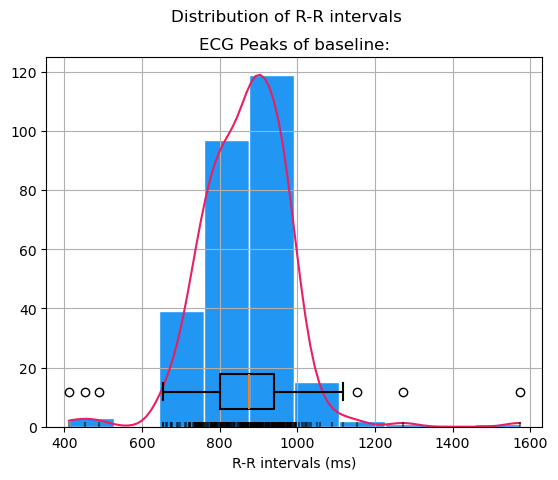

HRV of segment baseline:
   HRV_MeanNN    HRV_SDNN  HRV_SDANN1  HRV_SDNNI1  HRV_SDANN2  HRV_SDNNI2  \
0  867.920578  112.193677   31.178223  106.970486         NaN         NaN   

   HRV_SDANN5  HRV_SDNNI5   HRV_RMSSD    HRV_SDSD  ...  HRV_IQRNN  \
0         NaN         NaN  110.488048  110.686078  ...      140.0   

   HRV_SDRMSSD  HRV_Prc20NN  HRV_Prc80NN  HRV_pNN50  HRV_pNN20  HRV_MinNN  \
0     1.015437        780.2        952.6  33.935018  70.036101      412.0   

   HRV_MaxNN    HRV_HTI  HRV_TINN  
0     1573.0  21.307692     500.0  

[1 rows x 25 columns]
0    867.920578
Name: HRV_MeanNN, dtype: float64
0    112.193677
Name: HRV_SDNN, dtype: float64
0    110.488048
Name: HRV_RMSSD, dtype: float64


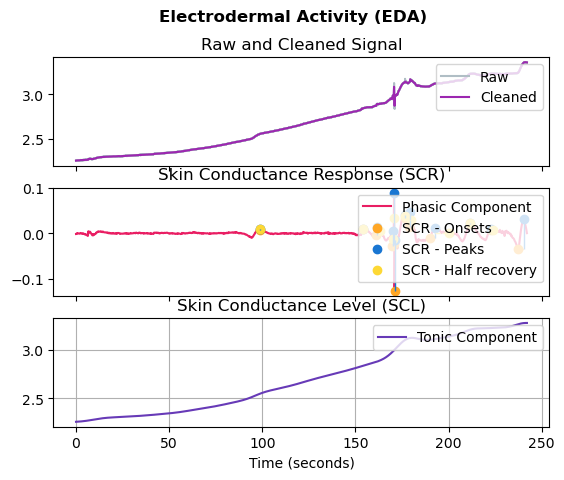

EDA of segment baseline:
   SCR_Peaks_N  SCR_Peaks_Amplitude_Mean  EDA_Tonic_SD  EDA_Sympathetic  \
0         12.0                  0.033952      0.344005          0.00006   

   EDA_SympatheticN  EDA_Autocorrelation  
0          0.000058             0.955245  
Segment stress1_MIST:


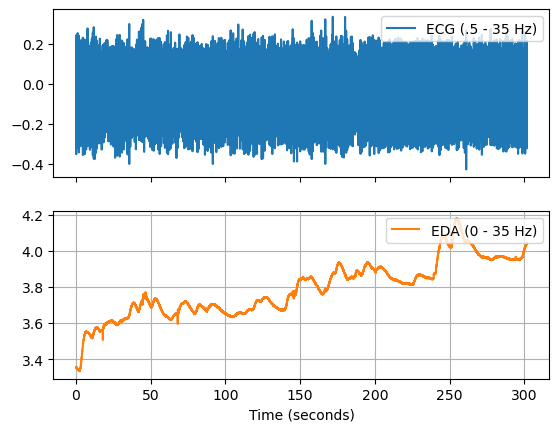

ECG of stress1_MIST:


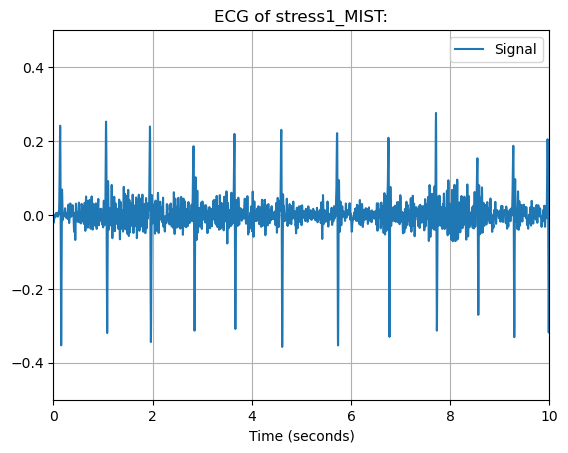

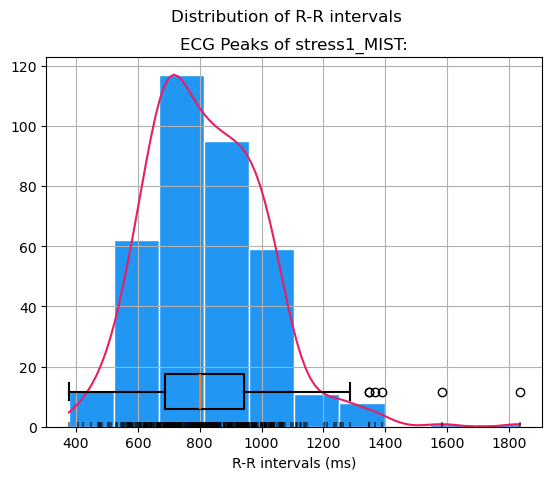

HRV of segment stress1_MIST:
   HRV_MeanNN    HRV_SDNN  HRV_SDANN1  HRV_SDNNI1  HRV_SDANN2  HRV_SDNNI2  \
0   821.23224  191.417919   49.730496  186.547678   19.347756  188.013341   

   HRV_SDANN5  HRV_SDNNI5   HRV_RMSSD    HRV_SDSD  ...  HRV_IQRNN  \
0         NaN         NaN  220.362447  220.664567  ...     254.75   

   HRV_SDRMSSD  HRV_Prc20NN  HRV_Prc80NN  HRV_pNN50  HRV_pNN20  HRV_MinNN  \
0      0.86865        667.0        977.0  53.551913   77.04918      377.0   

   HRV_MaxNN  HRV_HTI  HRV_TINN  
0     1835.0     30.5  367.1875  

[1 rows x 25 columns]
0    821.23224
Name: HRV_MeanNN, dtype: float64
0    191.417919
Name: HRV_SDNN, dtype: float64
0    220.362447
Name: HRV_RMSSD, dtype: float64


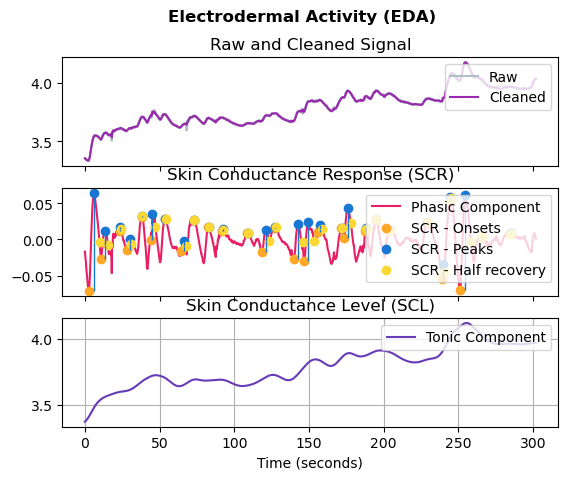

EDA of segment stress1_MIST:
   SCR_Peaks_N  SCR_Peaks_Amplitude_Mean  EDA_Tonic_SD  EDA_Sympathetic  \
0         28.0                  0.021613      0.151306         0.000456   

   EDA_SympatheticN  EDA_Autocorrelation  
0          0.000235             0.887571  
Segment nf1_2D:


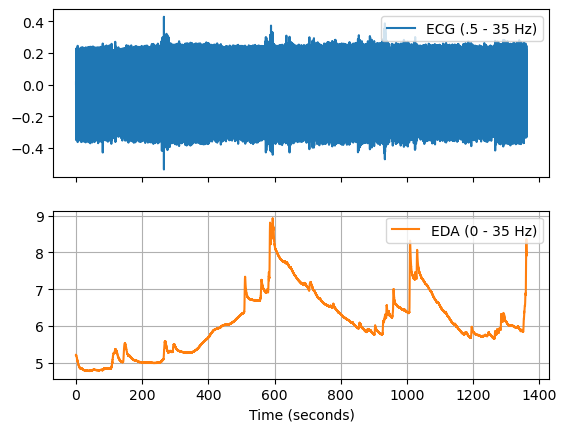

ECG of nf1_2D:


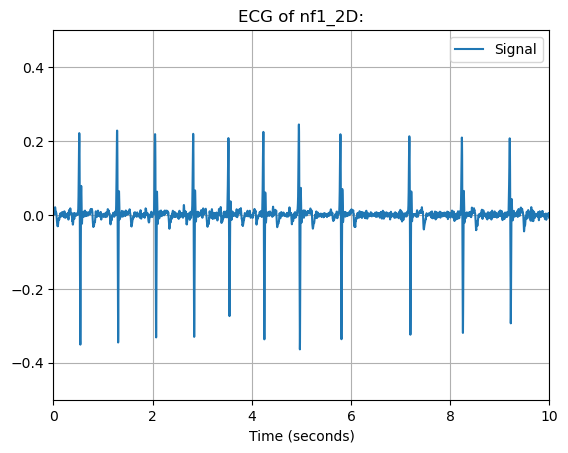

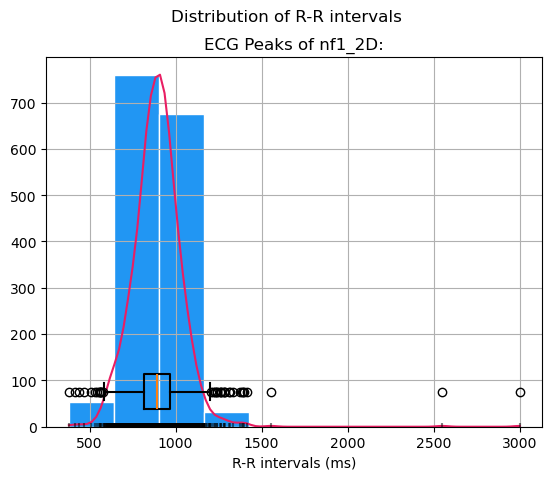

HRV of segment nf1_2D:
   HRV_MeanNN    HRV_SDNN  HRV_SDANN1  HRV_SDNNI1  HRV_SDANN2  HRV_SDNNI2  \
0  893.246719  149.125609   48.391291  128.274652   37.122165  138.451553   

   HRV_SDANN5  HRV_SDNNI5   HRV_RMSSD    HRV_SDSD  ...  HRV_IQRNN  \
0   14.930819  141.704231  150.706622  150.756098  ...      155.5   

   HRV_SDRMSSD  HRV_Prc20NN  HRV_Prc80NN  HRV_pNN50  HRV_pNN20  HRV_MinNN  \
0     0.989509        789.6        991.4   43.43832   71.91601      379.0   

   HRV_MaxNN    HRV_HTI  HRV_TINN  
0     3001.0  28.222222       0.0  

[1 rows x 25 columns]
0    893.246719
Name: HRV_MeanNN, dtype: float64
0    149.125609
Name: HRV_SDNN, dtype: float64
0    150.706622
Name: HRV_RMSSD, dtype: float64


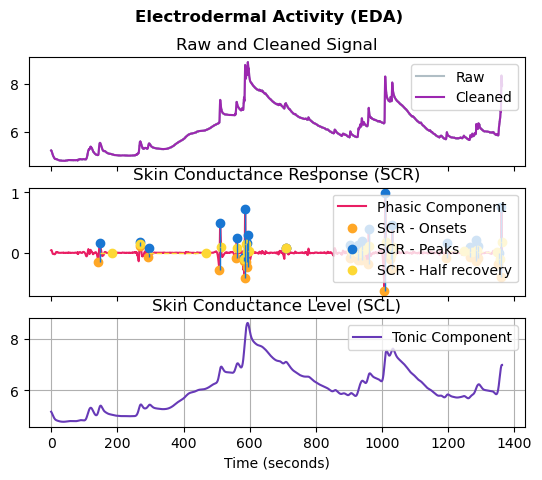

EDA of segment nf1_2D:
   SCR_Peaks_N  SCR_Peaks_Amplitude_Mean  EDA_Tonic_SD  EDA_Sympathetic  \
0         23.0                  0.427327      0.829799         0.004496   

   EDA_SympatheticN  EDA_Autocorrelation  
0          0.003957             0.971277  
Segment stress2_ABBA:


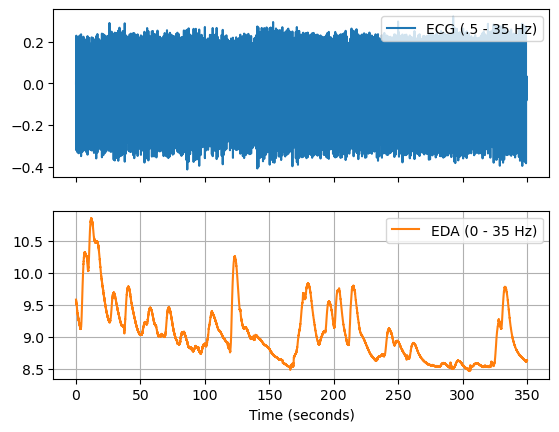

ECG of stress2_ABBA:


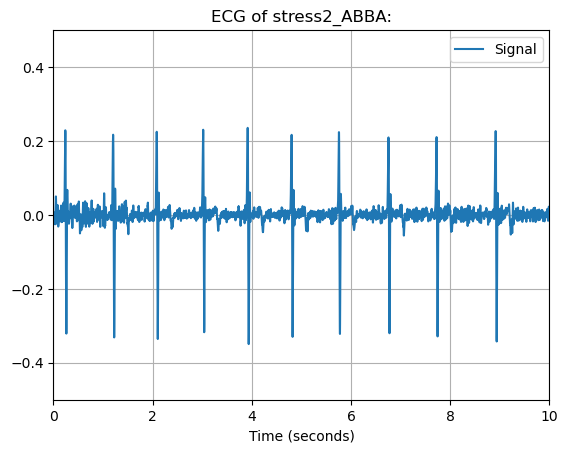

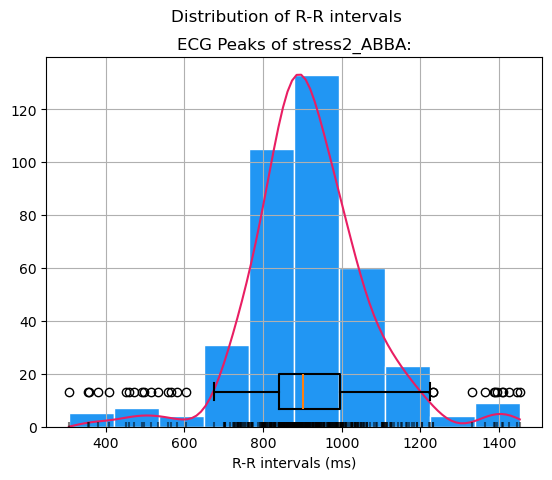

HRV of segment stress2_ABBA:
   HRV_MeanNN    HRV_SDNN  HRV_SDANN1  HRV_SDNNI1  HRV_SDANN2  HRV_SDNNI2  \
0  913.349081  163.967203   37.845809  159.583494   27.544113  162.289596   

   HRV_SDANN5  HRV_SDNNI5   HRV_RMSSD    HRV_SDSD  ...  HRV_IQRNN  \
0         NaN         NaN  161.320643  161.533172  ...      155.0   

   HRV_SDRMSSD  HRV_Prc20NN  HRV_Prc80NN  HRV_pNN50  HRV_pNN20  HRV_MinNN  \
0     1.016406        818.0       1017.0  47.506562  75.065617      306.0   

   HRV_MaxNN  HRV_HTI  HRV_TINN  
0     1453.0  23.8125   609.375  

[1 rows x 25 columns]
0    913.349081
Name: HRV_MeanNN, dtype: float64
0    163.967203
Name: HRV_SDNN, dtype: float64
0    161.320643
Name: HRV_RMSSD, dtype: float64


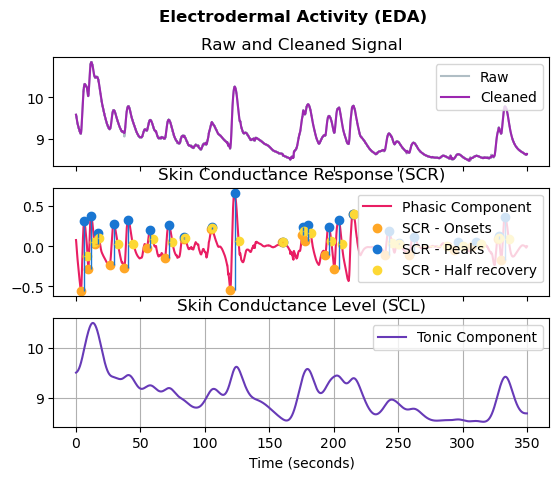

EDA of segment stress2_ABBA:
   SCR_Peaks_N  SCR_Peaks_Amplitude_Mean  EDA_Tonic_SD  EDA_Sympathetic  \
0         23.0                  0.314092      0.411645         0.027951   

   EDA_SympatheticN  EDA_Autocorrelation  
0          0.001759             0.735979  
Segment nf2_VR:


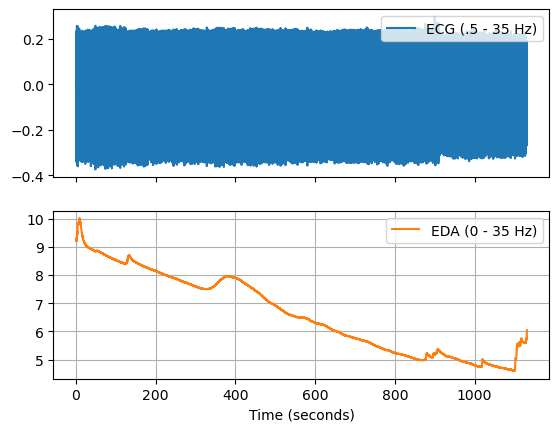

ECG of nf2_VR:


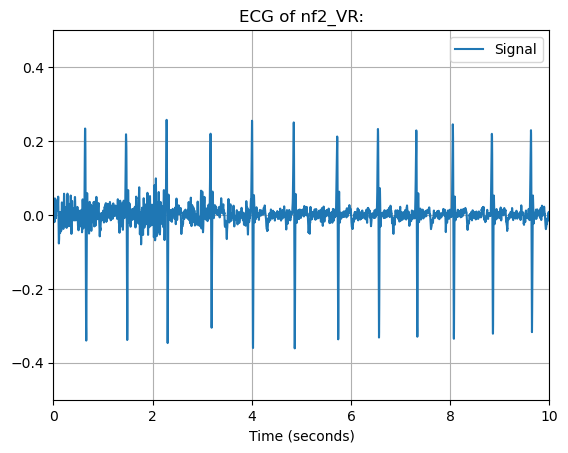

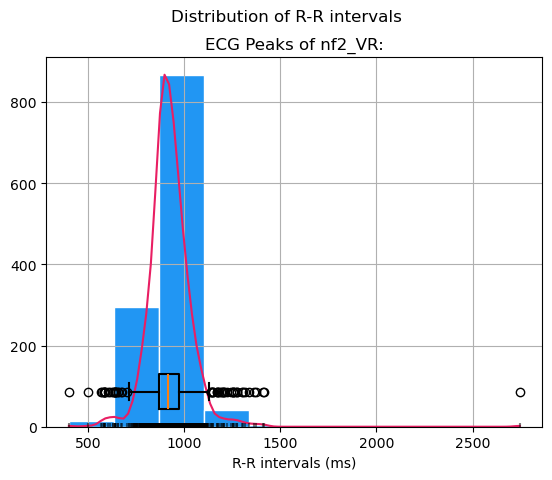

HRV of segment nf2_VR:
   HRV_MeanNN    HRV_SDNN  HRV_SDANN1  HRV_SDNNI1  HRV_SDANN2  HRV_SDNNI2  \
0  924.569092  114.948497   37.873041   91.642274   24.867732   95.960952   

   HRV_SDANN5  HRV_SDNNI5   HRV_RMSSD   HRV_SDSD  ...  HRV_IQRNN  HRV_SDRMSSD  \
0   33.669085  107.961776  109.608487  109.65336  ...      105.0     1.048719   

   HRV_Prc20NN  HRV_Prc80NN  HRV_pNN50  HRV_pNN20  HRV_MinNN  HRV_MaxNN  \
0        858.4        992.0  33.442355  68.438267      400.0     2746.0   

    HRV_HTI  HRV_TINN  
0  20.04918       0.0  

[1 rows x 25 columns]
0    924.569092
Name: HRV_MeanNN, dtype: float64
0    114.948497
Name: HRV_SDNN, dtype: float64
0    109.608487
Name: HRV_RMSSD, dtype: float64


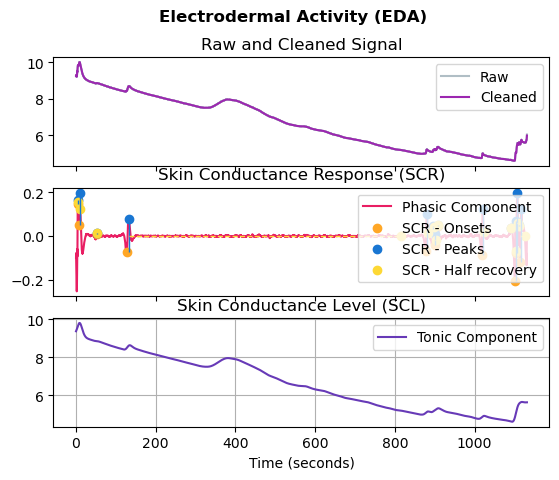

EDA of segment nf2_VR:
   SCR_Peaks_N  SCR_Peaks_Amplitude_Mean  EDA_Tonic_SD  EDA_Sympathetic  \
0         14.0                  0.111888      1.415754         0.000253   

   EDA_SympatheticN  EDA_Autocorrelation  
0          0.000074             0.991567  

For file PB5:
segment: [baseline] before: [None] after [stress1_MIST] start [414405] end [656492]
segment: [stress1_MIST] before: [baseline] after [nf1_2D] start [656492] end [958288]
2255175
segment: [nf1_2D] before: [stress1_MIST] after [stress2_ABBA] start [1312184] end [2674686] marker_inside label[nf1_2D_unlimited] marker_inside index [2255175]
segment: [stress2_ABBA] before: [nf1_2D] after [nf2_VR] start [3757071] end [4106989]
5611674
segment: [nf2_VR] before: [stress2_ABBA] after [None] start [4710946] end [5842463] marker_inside label[nf2_VR_unlimited] marker_inside index [5611674]

File PB7:
Segment baseline:


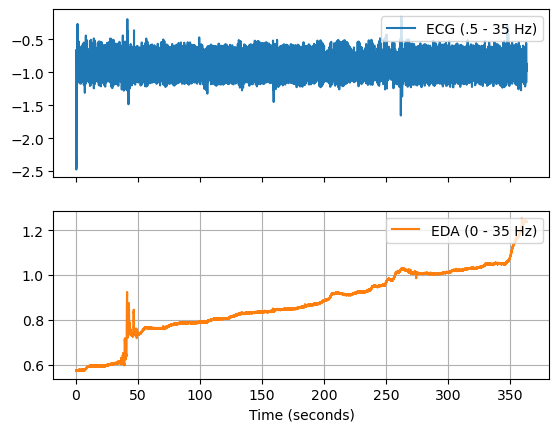

ECG of baseline:


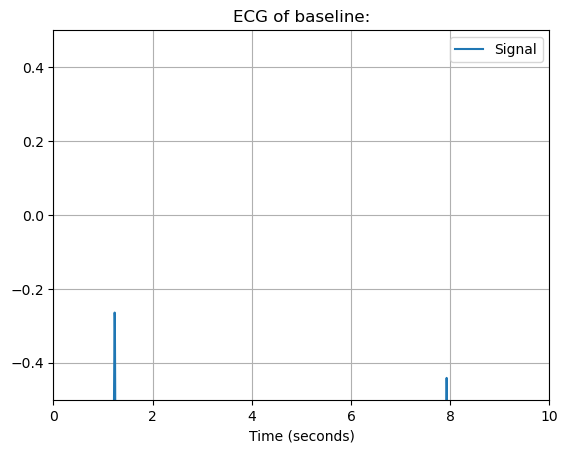

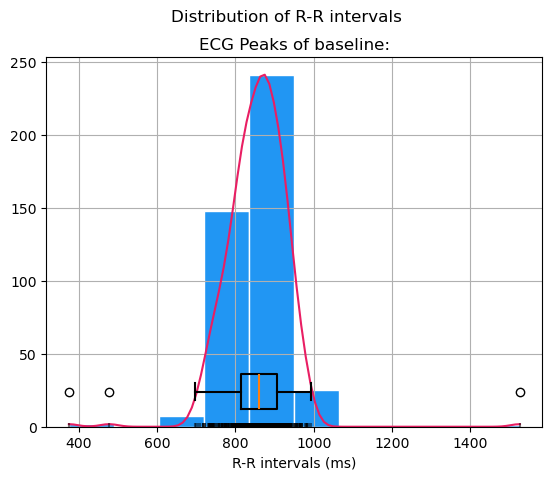

HRV of segment baseline:
   HRV_MeanNN   HRV_SDNN  HRV_SDANN1  HRV_SDNNI1  HRV_SDANN2  HRV_SDNNI2  \
0  855.686321  77.094018   41.170094   62.979973   32.017228   71.170935   

   HRV_SDANN5  HRV_SDNNI5  HRV_RMSSD   HRV_SDSD  ...  HRV_IQRNN  HRV_SDRMSSD  \
0         NaN         NaN  62.810101  62.884476  ...      90.25     1.227414   

   HRV_Prc20NN  HRV_Prc80NN  HRV_pNN50  HRV_pNN20  HRV_MinNN  HRV_MaxNN  \
0        799.0        914.0   5.896226  28.773585      374.0     1527.0   

     HRV_HTI  HRV_TINN  
0  15.703704   453.125  

[1 rows x 25 columns]
0    855.686321
Name: HRV_MeanNN, dtype: float64
0    77.094018
Name: HRV_SDNN, dtype: float64
0    62.810101
Name: HRV_RMSSD, dtype: float64


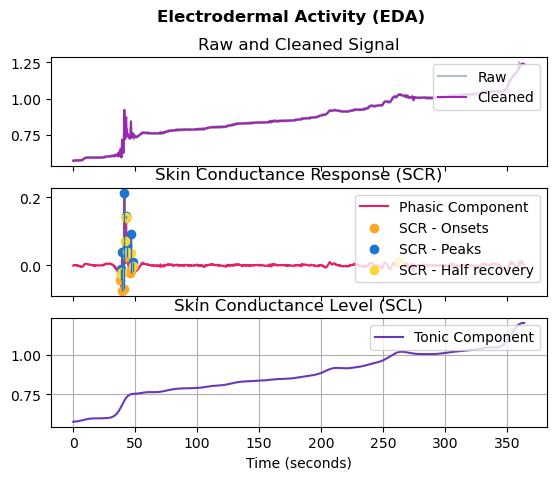

EDA of segment baseline:
   SCR_Peaks_N  SCR_Peaks_Amplitude_Mean  EDA_Tonic_SD  EDA_Sympathetic  \
0          8.0                  0.076475      0.143508         0.000053   

   EDA_SympatheticN  EDA_Autocorrelation  
0          0.001638             0.930982  
Segment stress1_ABBA:


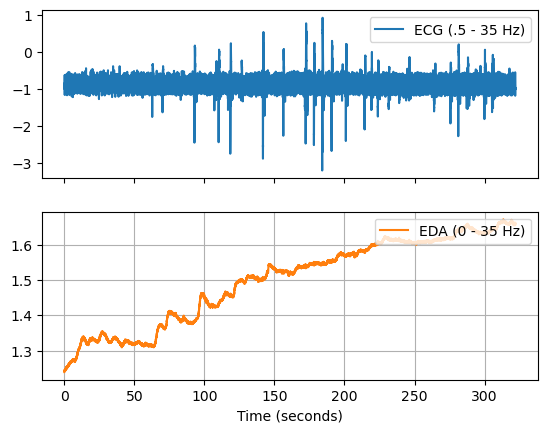

ECG of stress1_ABBA:


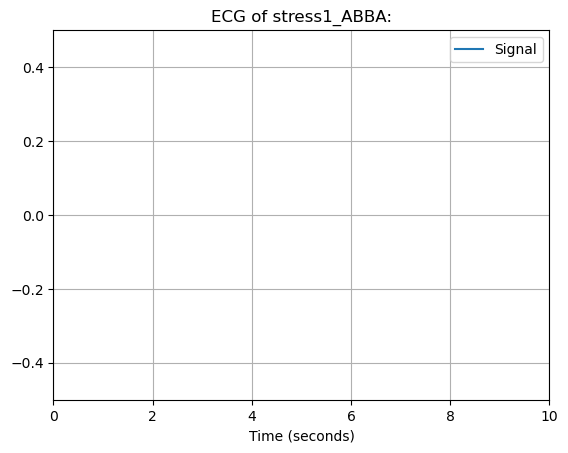

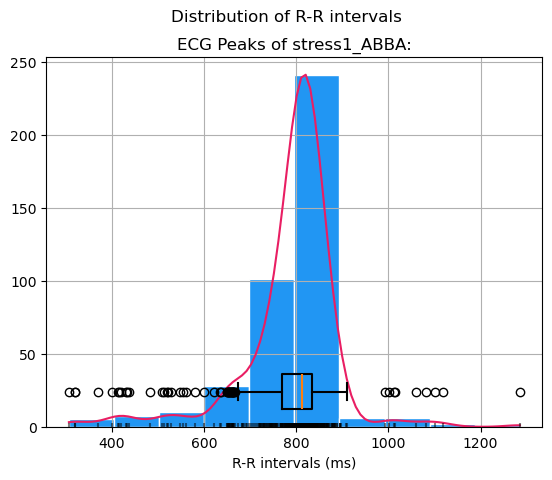

HRV of segment stress1_ABBA:
   HRV_MeanNN   HRV_SDNN  HRV_SDANN1  HRV_SDNNI1  HRV_SDANN2  HRV_SDNNI2  \
0  788.253071  104.92506   29.723004  100.036269    12.11616  102.000627   

   HRV_SDANN5  HRV_SDNNI5   HRV_RMSSD    HRV_SDSD  ...  HRV_IQRNN  \
0         NaN         NaN  124.600534  124.754264  ...       65.0   

   HRV_SDRMSSD  HRV_Prc20NN  HRV_Prc80NN  HRV_pNN50  HRV_pNN20  HRV_MinNN  \
0     0.842092        749.2        841.6  14.987715  36.363636      307.0   

   HRV_MaxNN   HRV_HTI  HRV_TINN  
0     1285.0  9.926829       0.0  

[1 rows x 25 columns]
0    788.253071
Name: HRV_MeanNN, dtype: float64
0    104.92506
Name: HRV_SDNN, dtype: float64
0    124.600534
Name: HRV_RMSSD, dtype: float64


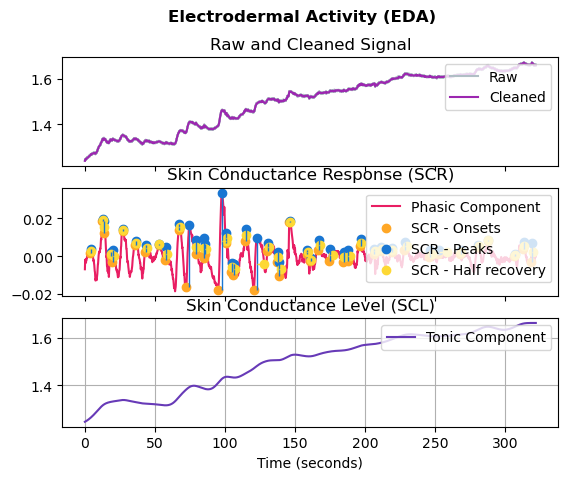

EDA of segment stress1_ABBA:
   SCR_Peaks_N  SCR_Peaks_Amplitude_Mean  EDA_Tonic_SD  EDA_Sympathetic  \
0         44.0                  0.006342      0.119912         0.000061   

   EDA_SympatheticN  EDA_Autocorrelation  
0          0.000246              0.95423  
Segment nf1_VR:


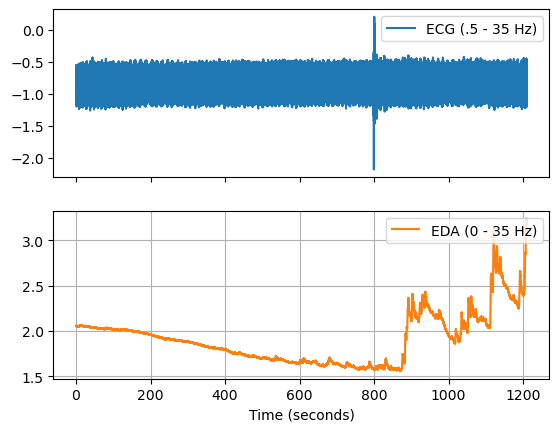

ECG of nf1_VR:


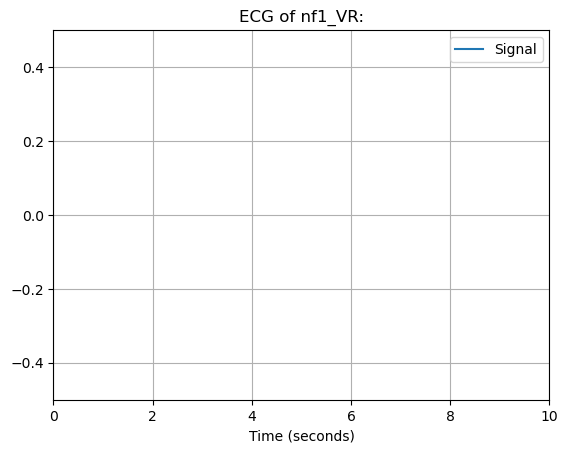

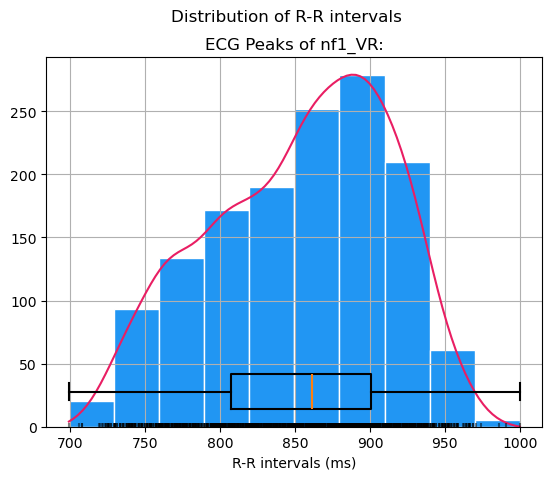

HRV of segment nf1_VR:
   HRV_MeanNN   HRV_SDNN  HRV_SDANN1  HRV_SDNNI1  HRV_SDANN2  HRV_SDNNI2  \
0  853.526836  59.924823   10.858812   59.177597    9.797009   59.189298   

   HRV_SDANN5  HRV_SDNNI5  HRV_RMSSD   HRV_SDSD  ...  HRV_IQRNN  HRV_SDRMSSD  \
0    5.369105   59.794711  29.957249  29.967838  ...       94.0     2.000345   

   HRV_Prc20NN  HRV_Prc80NN  HRV_pNN50  HRV_pNN20  HRV_MinNN  HRV_MaxNN  \
0        796.0        909.0   9.392655  50.070621      699.0     1000.0   

     HRV_HTI  HRV_TINN  
0  16.857143   265.625  

[1 rows x 25 columns]
0    853.526836
Name: HRV_MeanNN, dtype: float64
0    59.924823
Name: HRV_SDNN, dtype: float64
0    29.957249
Name: HRV_RMSSD, dtype: float64


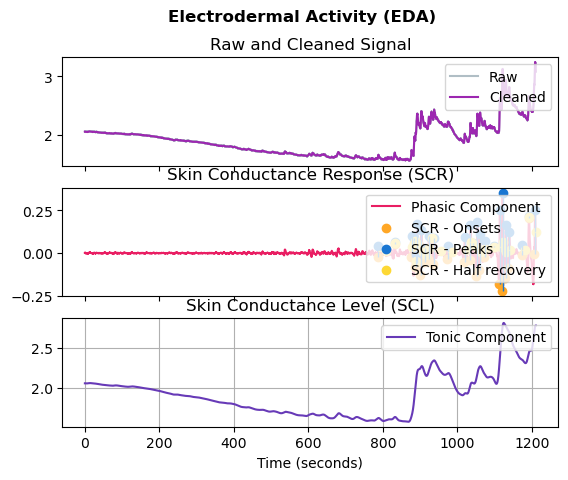

EDA of segment nf1_VR:
   SCR_Peaks_N  SCR_Peaks_Amplitude_Mean  EDA_Tonic_SD  EDA_Sympathetic  \
0         26.0                  0.156726      0.271894         0.001254   

   EDA_SympatheticN  EDA_Autocorrelation  
0          0.005478             0.930949  
Segment stress2_MIST:


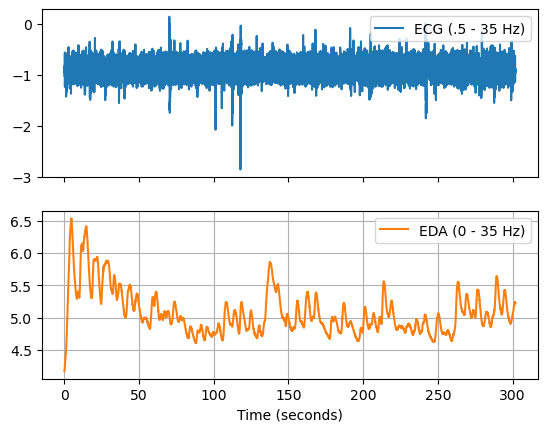

ECG of stress2_MIST:


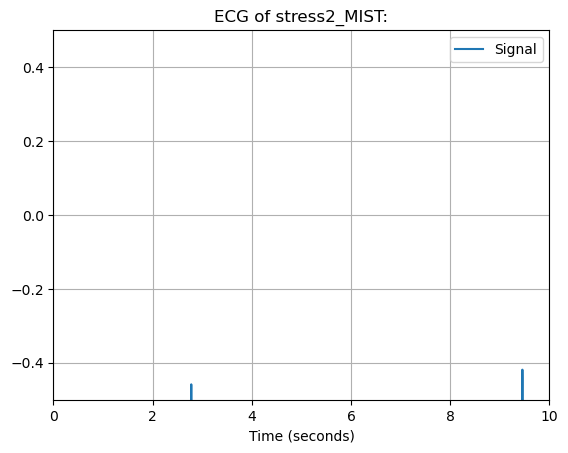

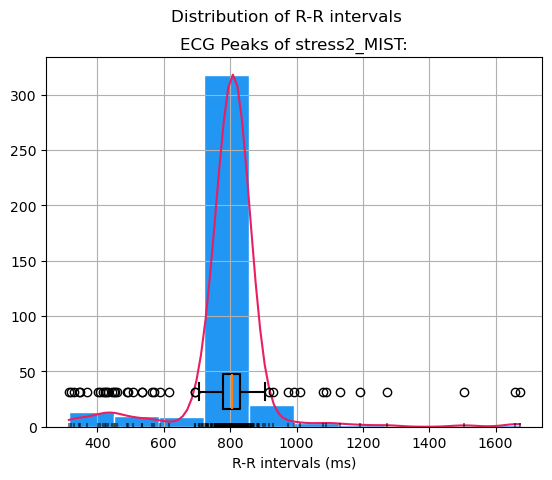

HRV of segment stress2_MIST:
   HRV_MeanNN    HRV_SDNN  HRV_SDANN1  HRV_SDNNI1  HRV_SDANN2  HRV_SDNNI2  \
0  795.226913  130.776421   11.615157  126.479711   11.093882  136.284319   

   HRV_SDANN5  HRV_SDNNI5   HRV_RMSSD    HRV_SDSD  ...  HRV_IQRNN  \
0         NaN         NaN  164.264305  164.481977  ...       54.0   

   HRV_SDRMSSD  HRV_Prc20NN  HRV_Prc80NN  HRV_pNN50  HRV_pNN20  HRV_MinNN  \
0     0.796134        769.0        837.0  16.622691  35.883905      314.0   

   HRV_MaxNN   HRV_HTI  HRV_TINN  
0     1673.0  9.973684       0.0  

[1 rows x 25 columns]
0    795.226913
Name: HRV_MeanNN, dtype: float64
0    130.776421
Name: HRV_SDNN, dtype: float64
0    164.264305
Name: HRV_RMSSD, dtype: float64


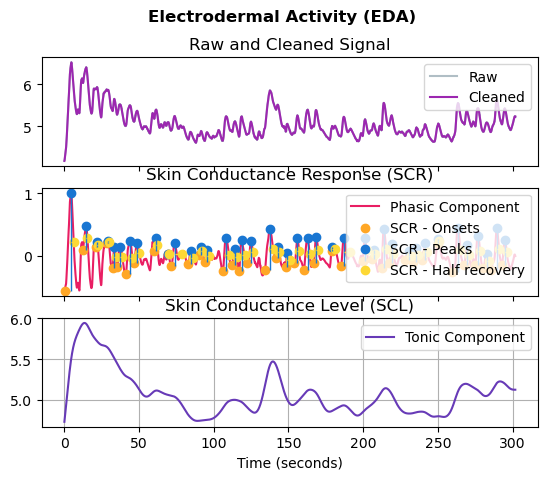

EDA of segment stress2_MIST:
   SCR_Peaks_N  SCR_Peaks_Amplitude_Mean  EDA_Tonic_SD  EDA_Sympathetic  \
0         40.0                  0.350992      0.274353         0.020833   

   EDA_SympatheticN  EDA_Autocorrelation  
0           0.00396             0.466779  
Segment nf2_2D:


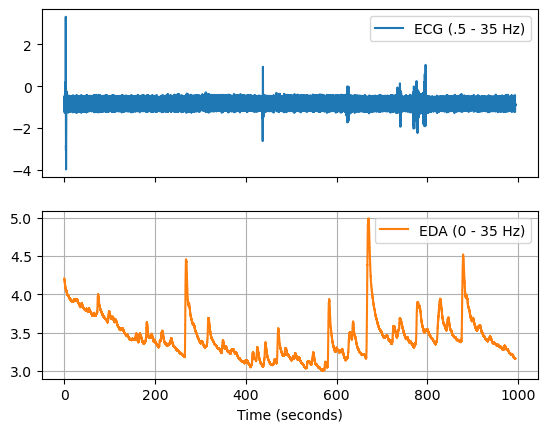

ECG of nf2_2D:


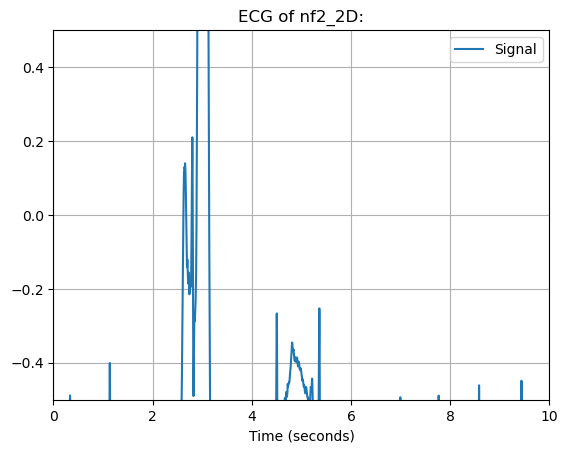

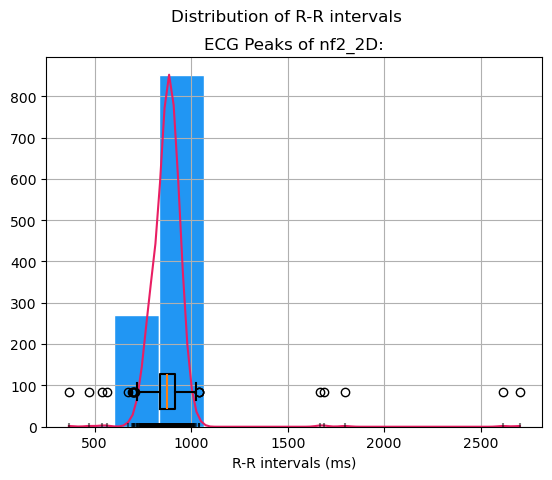

HRV of segment nf2_2D:
   HRV_MeanNN    HRV_SDNN  HRV_SDANN1  HRV_SDNNI1  HRV_SDANN2  HRV_SDNNI2  \
0  877.064488  108.009473   24.755086   84.960751    18.96612    87.58363   

   HRV_SDANN5  HRV_SDNNI5   HRV_RMSSD    HRV_SDSD  ...  HRV_IQRNN  \
0   13.237157   98.367194  134.016003  134.075276  ...       78.0   

   HRV_SDRMSSD  HRV_Prc20NN  HRV_Prc80NN  HRV_pNN50  HRV_pNN20  HRV_MinNN  \
0     0.805945        820.0        924.0  11.660777  40.989399      366.0   

   HRV_MaxNN    HRV_HTI  HRV_TINN  
0     2703.0  14.329114       0.0  

[1 rows x 25 columns]
0    877.064488
Name: HRV_MeanNN, dtype: float64
0    108.009473
Name: HRV_SDNN, dtype: float64
0    134.016003
Name: HRV_RMSSD, dtype: float64


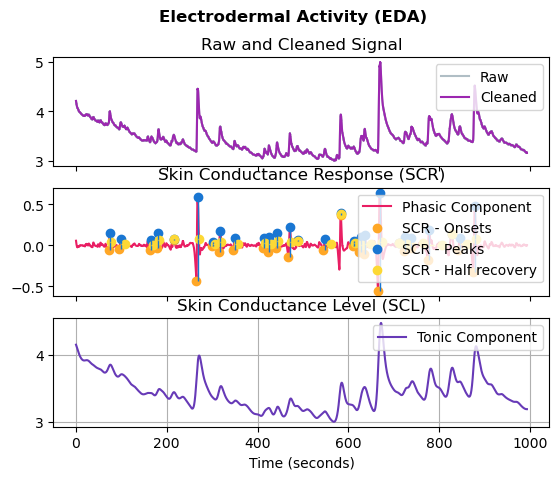

EDA of segment nf2_2D:
   SCR_Peaks_N  SCR_Peaks_Amplitude_Mean  EDA_Tonic_SD  EDA_Sympathetic  \
0         27.0                   0.23859      0.258778          0.00843   

   EDA_SympatheticN  EDA_Autocorrelation  
0          0.007392             0.789036  

For file PB7:
segment: [baseline] before: [None] after [stress1_ABBA] start [0] end [363814]
segment: [stress1_ABBA] before: [baseline] after [nf1_VR] start [363814] end [685774]
2004233
segment: [nf1_VR] before: [stress1_ABBA] after [stress2_MIST] start [1104058] end [2314284] marker_inside label[nf1_VR_unlimited] marker_inside index [2004233]
segment: [stress2_MIST] before: [nf1_VR] after [nf2_2D] start [3295782] end [3597646]
4682751
segment: [nf2_2D] before: [stress2_MIST] after [None] start [3782942] end [4776764] marker_inside label[nf2_2D_unlimited] marker_inside index [4682751]

File PB12-partie_2:
Segment baseline:


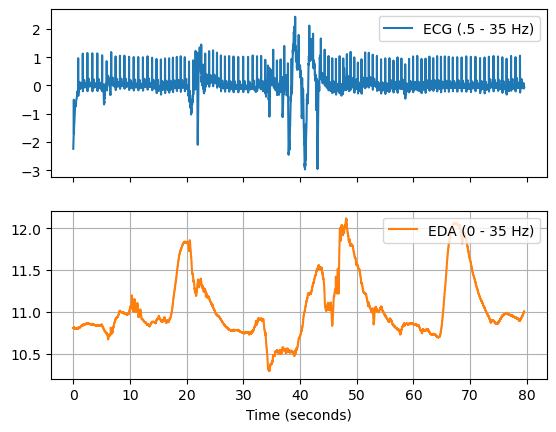

ECG of baseline:


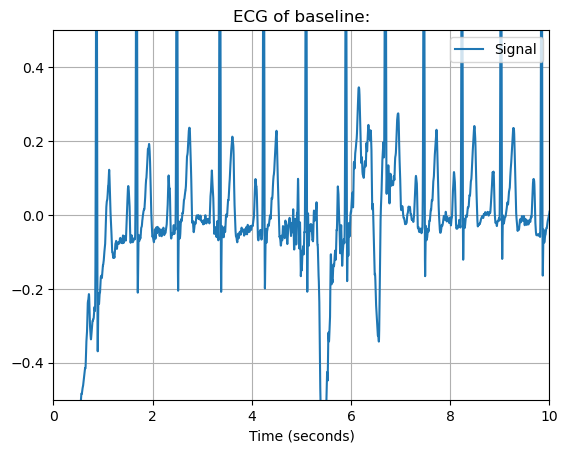

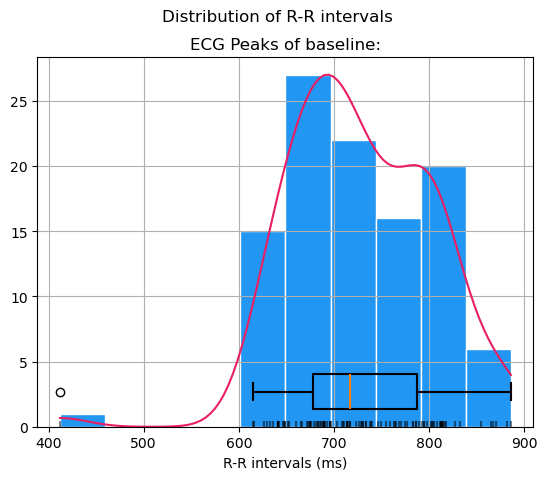

HRV of segment baseline:
   HRV_MeanNN  HRV_SDNN  HRV_SDANN1  HRV_SDNNI1  HRV_SDANN2  HRV_SDNNI2  \
0  728.261682  74.33762         NaN         NaN         NaN         NaN   

   HRV_SDANN5  HRV_SDNNI5  HRV_RMSSD   HRV_SDSD  ...  HRV_IQRNN  HRV_SDRMSSD  \
0         NaN         NaN   61.31053  61.601607  ...      110.0     1.212477   

   HRV_Prc20NN  HRV_Prc80NN  HRV_pNN50  HRV_pNN20  HRV_MinNN  HRV_MaxNN  \
0        672.2        801.2   7.476636  35.514019      412.0      886.0   

     HRV_HTI  HRV_TINN  
0  11.888889   234.375  

[1 rows x 25 columns]
0    728.261682
Name: HRV_MeanNN, dtype: float64
0    74.33762
Name: HRV_SDNN, dtype: float64
0    61.31053
Name: HRV_RMSSD, dtype: float64


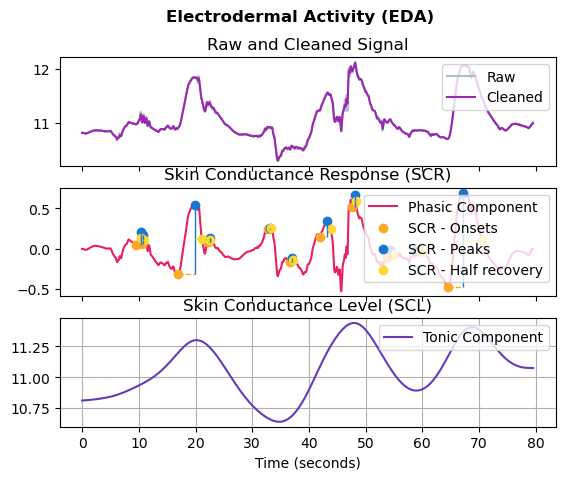

EDA of segment baseline:
   SCR_Peaks_N  SCR_Peaks_Amplitude_Mean  EDA_Tonic_SD  EDA_Sympathetic  \
0         11.0                  0.264087      0.221719         0.041645   

   EDA_SympatheticN  EDA_Autocorrelation  
0          0.000414             0.169029  
Segment stress2_MIST:


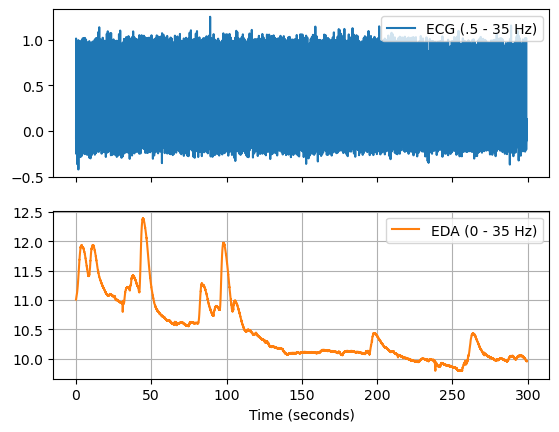

ECG of stress2_MIST:


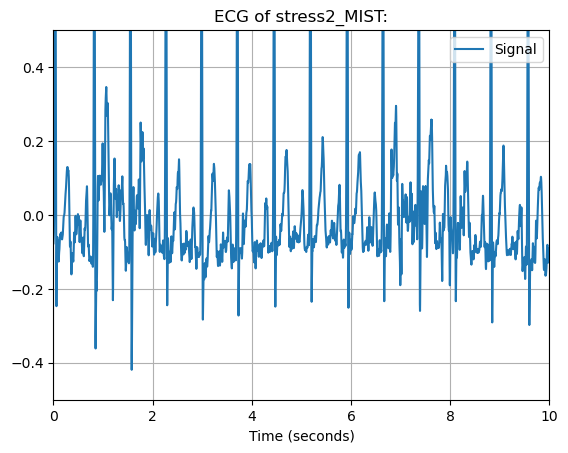

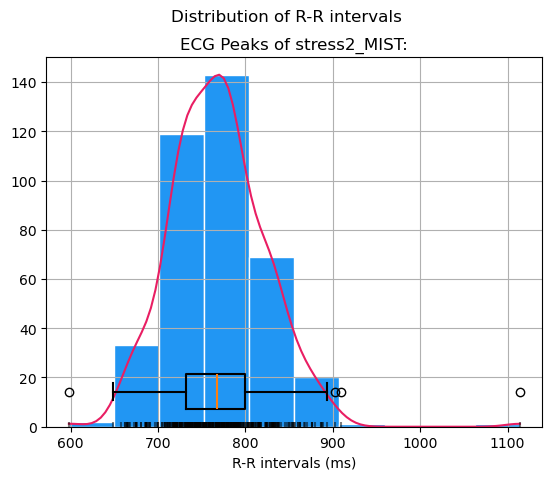

HRV of segment stress2_MIST:
   HRV_MeanNN   HRV_SDNN  HRV_SDANN1  HRV_SDNNI1  HRV_SDANN2  HRV_SDNNI2  \
0  768.365979  54.414289   16.615228   52.156156         NaN         NaN   

   HRV_SDANN5  HRV_SDNNI5  HRV_RMSSD   HRV_SDSD  ...  HRV_IQRNN  HRV_SDRMSSD  \
0         NaN         NaN  43.182534  43.238434  ...       67.5     1.260099   

   HRV_Prc20NN  HRV_Prc80NN  HRV_pNN50  HRV_pNN20  HRV_MinNN  HRV_MaxNN  \
0        723.8        811.6   6.958763  45.618557      598.0     1114.0   

     HRV_HTI  HRV_TINN  
0  12.933333    218.75  

[1 rows x 25 columns]
0    768.365979
Name: HRV_MeanNN, dtype: float64
0    54.414289
Name: HRV_SDNN, dtype: float64
0    43.182534
Name: HRV_RMSSD, dtype: float64


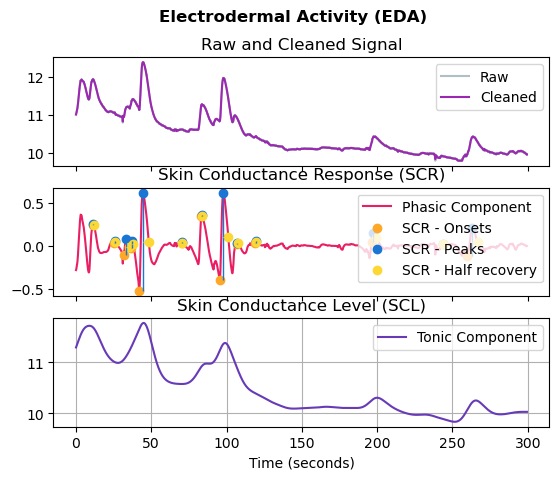

EDA of segment stress2_MIST:
   SCR_Peaks_N  SCR_Peaks_Amplitude_Mean  EDA_Tonic_SD  EDA_Sympathetic  \
0         14.0                  0.225411      0.548744         0.017444   

   EDA_SympatheticN  EDA_Autocorrelation  
0          0.000778             0.860495  
Segment nf2_2D:


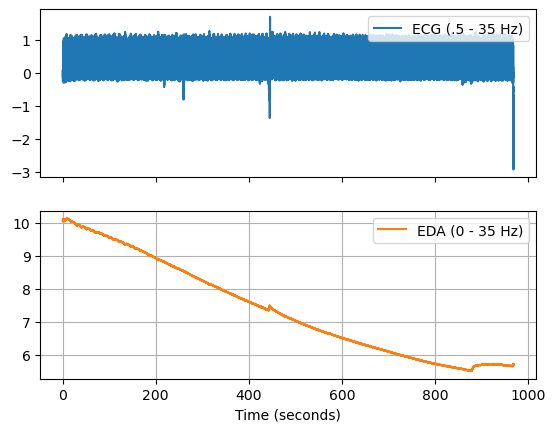

ECG of nf2_2D:


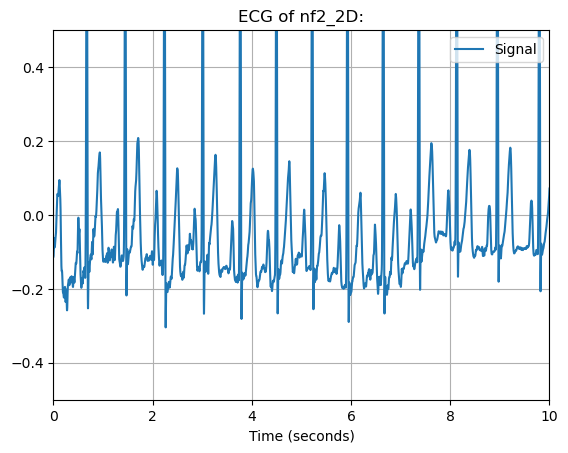

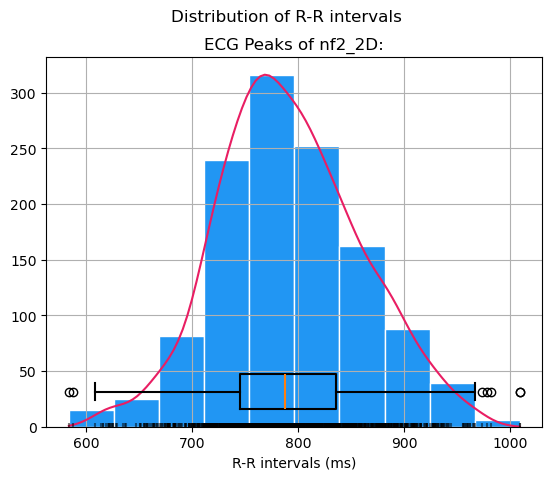

HRV of segment nf2_2D:
   HRV_MeanNN   HRV_SDNN  HRV_SDANN1  HRV_SDNNI1  HRV_SDANN2  HRV_SDNNI2  \
0  791.891251  68.687595   24.202518   63.158087   19.121947   64.901753   

   HRV_SDANN5  HRV_SDNNI5  HRV_RMSSD   HRV_SDSD  ...  HRV_IQRNN  HRV_SDRMSSD  \
0    8.315704   66.186431    33.2737  33.287315  ...       91.0     2.064321   

   HRV_Prc20NN  HRV_Prc80NN  HRV_pNN50  HRV_pNN20  HRV_MinNN  HRV_MaxNN  \
0        737.0        851.0  10.956664   55.19215      584.0     1009.0   

     HRV_HTI  HRV_TINN  
0  16.092105   328.125  

[1 rows x 25 columns]
0    791.891251
Name: HRV_MeanNN, dtype: float64
0    68.687595
Name: HRV_SDNN, dtype: float64
0    33.2737
Name: HRV_RMSSD, dtype: float64


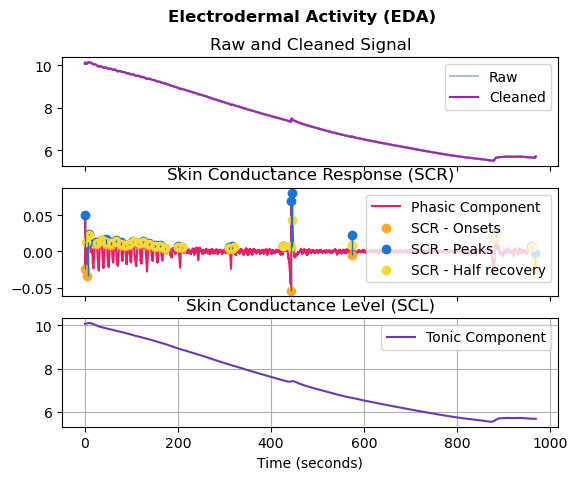

EDA of segment nf2_2D:
   SCR_Peaks_N  SCR_Peaks_Amplitude_Mean  EDA_Tonic_SD  EDA_Sympathetic  \
0         29.0                  0.014889      1.451976         0.000076   

   EDA_SympatheticN  EDA_Autocorrelation  
0          0.000017             0.989855  

For file PB12-partie_2:
segment: [baseline] before: [None] after [stress2_MIST] start [0] end [79532]
segment: [stress2_MIST] before: [baseline] after [nf2_2D] start [79532] end [378985]
1743293
segment: [nf2_2D] before: [stress2_MIST] after [None] start [842645] end [1812074] marker_inside label[nf2_2D_unlimited] marker_inside index [1743293]

File PB12:
Segment baseline:


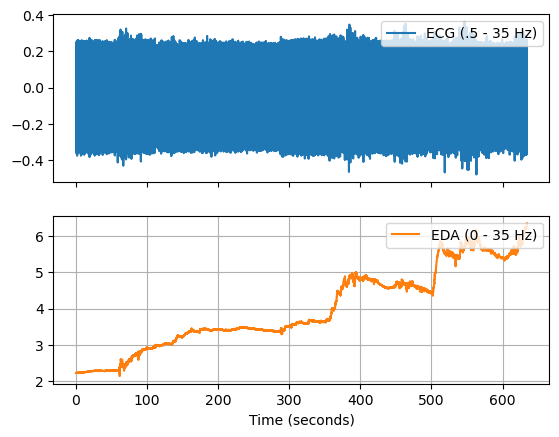

ECG of baseline:


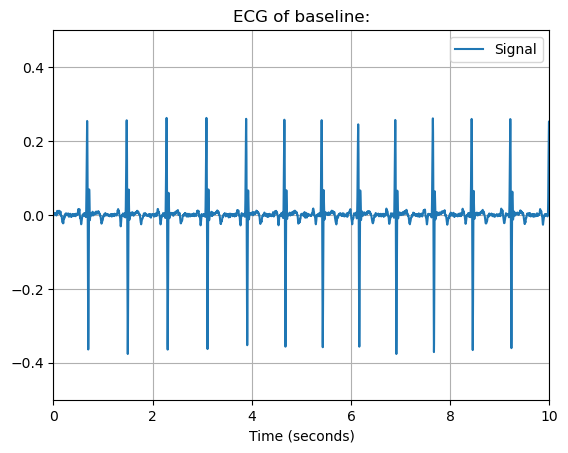

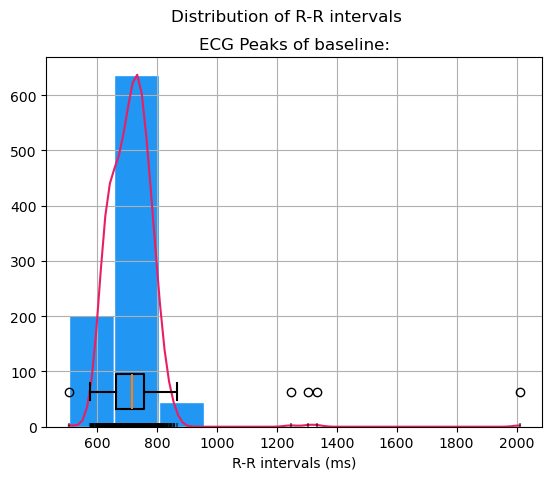

HRV of segment baseline:
   HRV_MeanNN   HRV_SDNN  HRV_SDANN1  HRV_SDNNI1  HRV_SDANN2  HRV_SDNNI2  \
0  714.100338  81.678553   32.238208   65.683172   25.764674   71.154508   

   HRV_SDANN5  HRV_SDNNI5  HRV_RMSSD   HRV_SDSD  ...  HRV_IQRNN  HRV_SDRMSSD  \
0         NaN         NaN   87.74327  87.792684  ...       93.0     0.930881   

   HRV_Prc20NN  HRV_Prc80NN  HRV_pNN50  HRV_pNN20  HRV_MinNN  HRV_MaxNN  \
0        652.0        765.0   6.426156  33.709132      506.0     2011.0   

     HRV_HTI  HRV_TINN  
0  16.425926   328.125  

[1 rows x 25 columns]
0    714.100338
Name: HRV_MeanNN, dtype: float64
0    81.678553
Name: HRV_SDNN, dtype: float64
0    87.74327
Name: HRV_RMSSD, dtype: float64


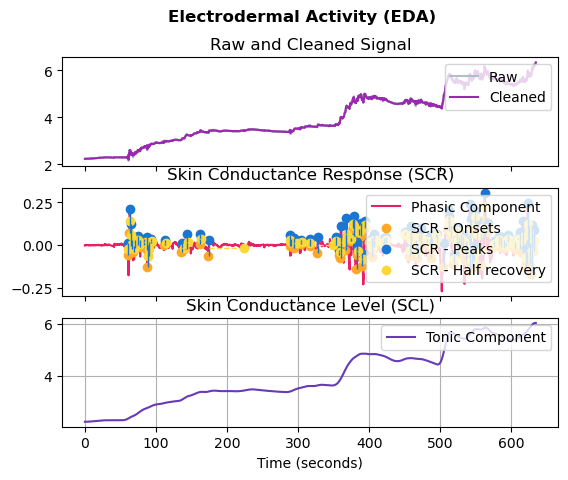

EDA of segment baseline:
   SCR_Peaks_N  SCR_Peaks_Amplitude_Mean  EDA_Tonic_SD  EDA_Sympathetic  \
0        100.0                  0.079123      1.098389         0.002594   

   EDA_SympatheticN  EDA_Autocorrelation  
0          0.003408              0.97387  
Segment stress1_ABBA:


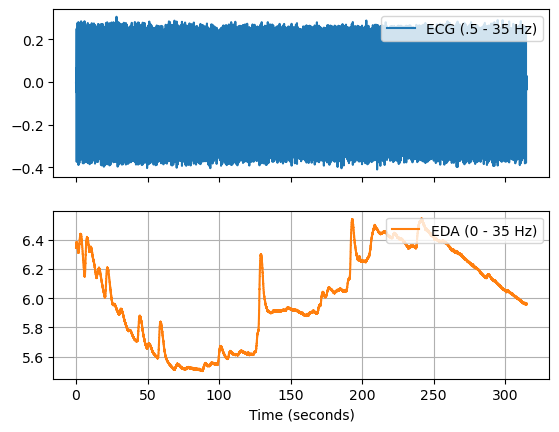

ECG of stress1_ABBA:


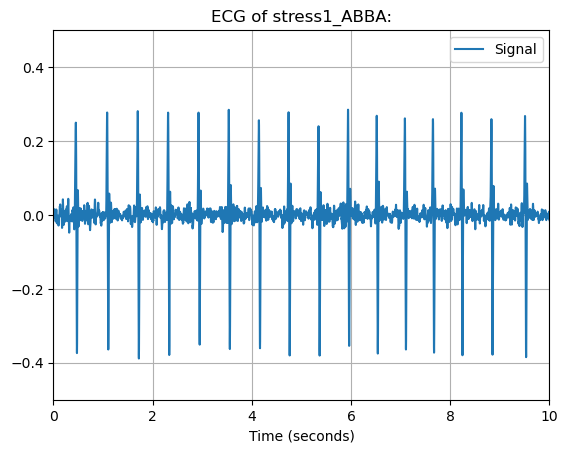

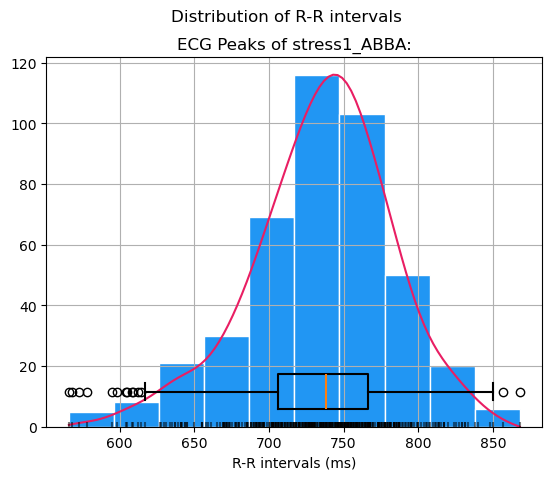

HRV of segment stress1_ABBA:
   HRV_MeanNN   HRV_SDNN  HRV_SDANN1  HRV_SDNNI1  HRV_SDANN2  HRV_SDNNI2  \
0  733.834112  50.474962    21.05647   46.573417    3.780043   49.293495   

   HRV_SDANN5  HRV_SDNNI5  HRV_RMSSD   HRV_SDSD  ...  HRV_IQRNN  HRV_SDRMSSD  \
0         NaN         NaN  30.652429  30.687159  ...       60.0     1.646687   

   HRV_Prc20NN  HRV_Prc80NN  HRV_pNN50  HRV_pNN20  HRV_MinNN  HRV_MaxNN  \
0        697.0        773.6  10.046729  45.794393      566.0      868.0   

     HRV_HTI  HRV_TINN  
0  12.969697  257.8125  

[1 rows x 25 columns]
0    733.834112
Name: HRV_MeanNN, dtype: float64
0    50.474962
Name: HRV_SDNN, dtype: float64
0    30.652429
Name: HRV_RMSSD, dtype: float64


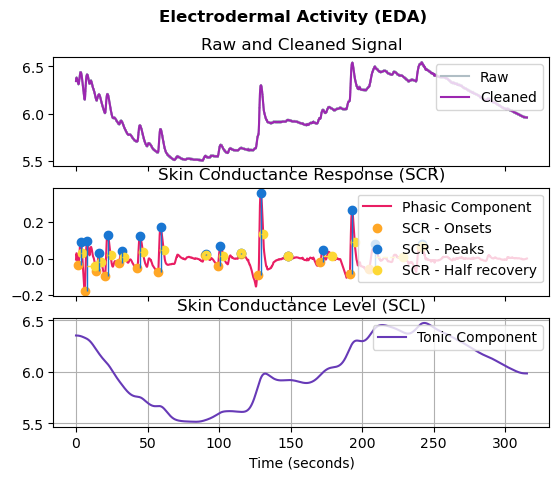

EDA of segment stress1_ABBA:
   SCR_Peaks_N  SCR_Peaks_Amplitude_Mean  EDA_Tonic_SD  EDA_Sympathetic  \
0         16.0                   0.14818      0.302145         0.004213   

   EDA_SympatheticN  EDA_Autocorrelation  
0          0.000689             0.935632  
Segment nf1_VR:


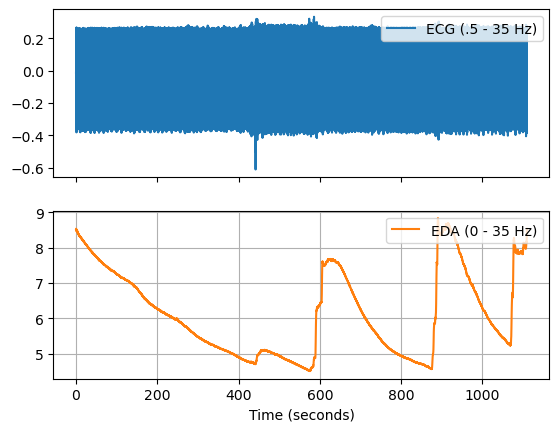

ECG of nf1_VR:


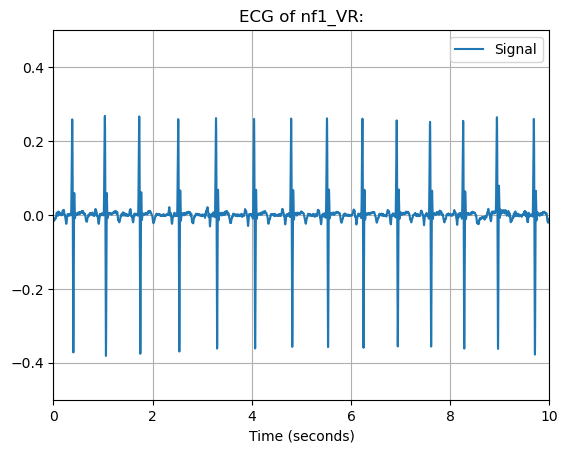

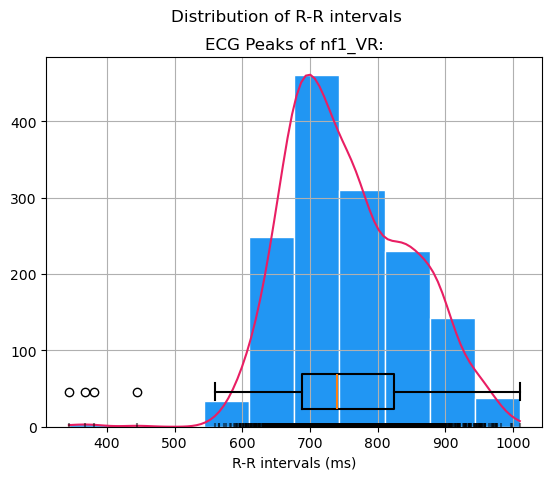

HRV of segment nf1_VR:
   HRV_MeanNN   HRV_SDNN  HRV_SDANN1  HRV_SDNNI1  HRV_SDANN2  HRV_SDNNI2  \
0  755.441718  90.735669    33.11765   84.475492   29.347696   86.366496   

   HRV_SDANN5  HRV_SDNNI5  HRV_RMSSD   HRV_SDSD  ...  HRV_IQRNN  HRV_SDRMSSD  \
0   23.651313   87.623251  44.072502  44.087476  ...      135.5     2.058782   

   HRV_Prc20NN  HRV_Prc80NN  HRV_pNN50  HRV_pNN20  HRV_MinNN  HRV_MaxNN  \
0        678.0        841.8  20.381731  57.191547      344.0     1010.0   

     HRV_HTI  HRV_TINN  
0  21.895522       0.0  

[1 rows x 25 columns]
0    755.441718
Name: HRV_MeanNN, dtype: float64
0    90.735669
Name: HRV_SDNN, dtype: float64
0    44.072502
Name: HRV_RMSSD, dtype: float64


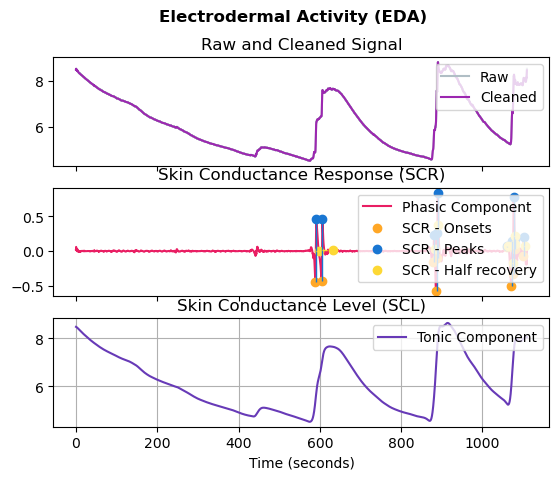

EDA of segment nf1_VR:
   SCR_Peaks_N  SCR_Peaks_Amplitude_Mean  EDA_Tonic_SD  EDA_Sympathetic  \
0         10.0                  0.613372      1.189682         0.005066   

   EDA_SympatheticN  EDA_Autocorrelation  
0          0.001291             0.972388  
Segment stress2_MIST:


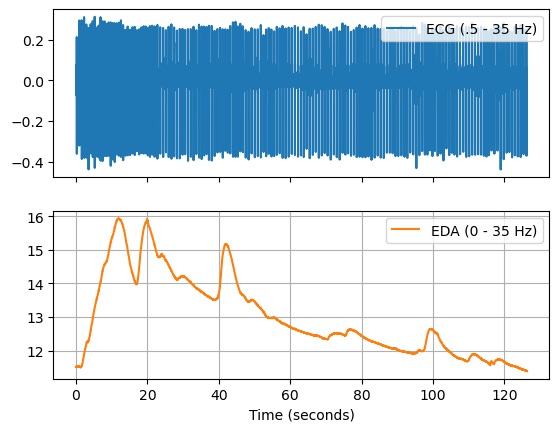

ECG of stress2_MIST:


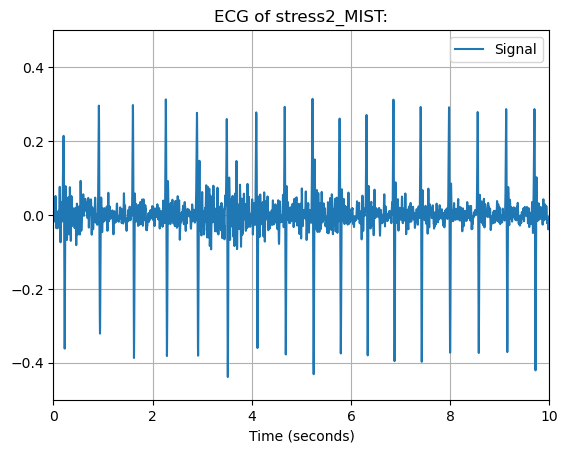

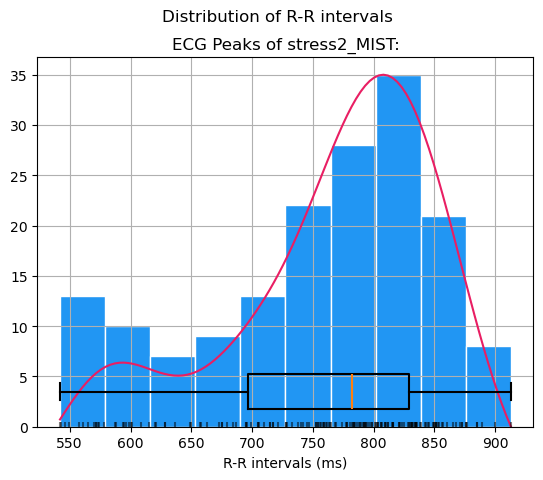

HRV of segment stress2_MIST:
   HRV_MeanNN   HRV_SDNN  HRV_SDANN1  HRV_SDNNI1  HRV_SDANN2  HRV_SDNNI2  \
0   754.36747  94.433385         NaN         NaN         NaN         NaN   

   HRV_SDANN5  HRV_SDNNI5  HRV_RMSSD   HRV_SDSD  ...  HRV_IQRNN  HRV_SDRMSSD  \
0         NaN         NaN  34.252538  34.345342  ...      132.0     2.756975   

   HRV_Prc20NN  HRV_Prc80NN  HRV_pNN50  HRV_pNN20  HRV_MinNN  HRV_MaxNN  \
0        673.0        835.0  12.048193   49.39759      542.0      913.0   

     HRV_HTI  HRV_TINN  
0  15.090909     312.5  

[1 rows x 25 columns]
0    754.36747
Name: HRV_MeanNN, dtype: float64
0    94.433385
Name: HRV_SDNN, dtype: float64
0    34.252538
Name: HRV_RMSSD, dtype: float64


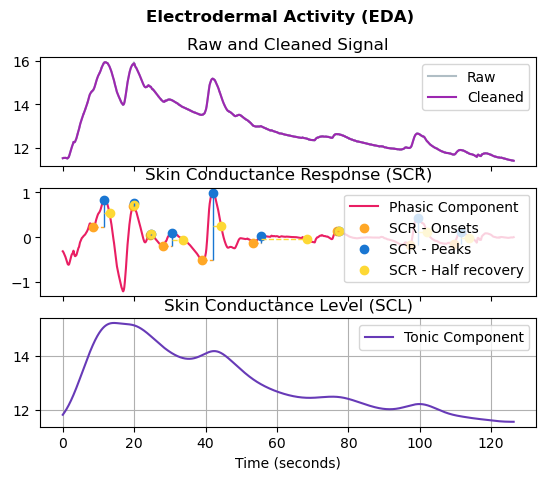

EDA of segment stress2_MIST:
   SCR_Peaks_N  SCR_Peaks_Amplitude_Mean  EDA_Tonic_SD  EDA_Sympathetic  \
0          9.0                  0.392743      1.134298         0.070902   

   EDA_SympatheticN  EDA_Autocorrelation  
0          0.000636             0.793185  

For file PB12:
segment: [baseline] before: [None] after [stress1_ABBA] start [147340] end [781634]
segment: [stress1_ABBA] before: [baseline] after [nf1_VR] start [781634] end [1096822]
2748482
segment: [nf1_VR] before: [stress1_ABBA] after [stress2_MIST] start [1848556] end [2957879] marker_inside label[nf1_VR_unlimited] marker_inside index [2748482]
segment: [stress2_MIST] before: [nf1_VR] after [None] start [3788338] end [3914625]

File PB13:
Segment baseline:


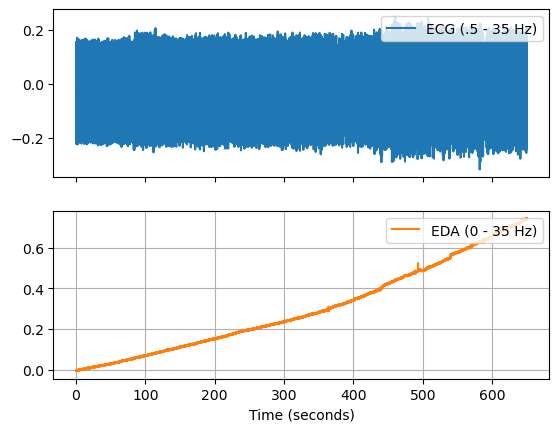

ECG of baseline:


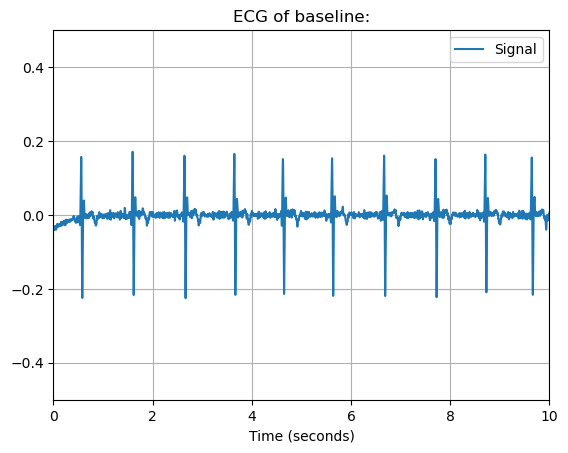

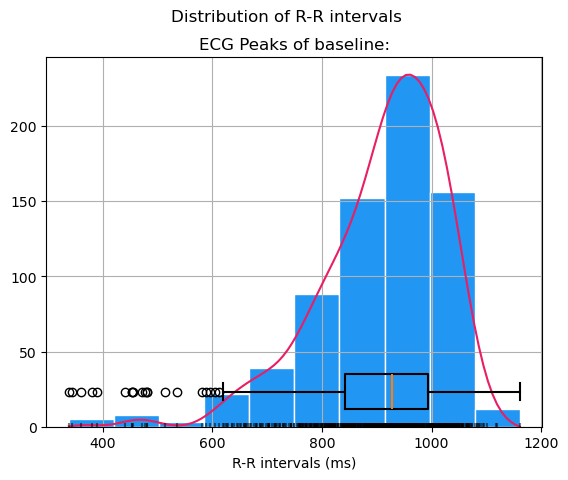

HRV of segment baseline:
   HRV_MeanNN    HRV_SDNN  HRV_SDANN1  HRV_SDNNI1  HRV_SDANN2  HRV_SDNNI2  \
0  902.906815  125.958812    62.02624  106.472718    61.17101  114.535439   

   HRV_SDANN5  HRV_SDNNI5   HRV_RMSSD    HRV_SDSD  ...  HRV_IQRNN  \
0         NaN         NaN  107.284701  107.358035  ...      150.5   

   HRV_SDRMSSD  HRV_Prc20NN  HRV_Prc80NN  HRV_pNN50  HRV_pNN20  HRV_MinNN  \
0     1.174061        816.0       1004.4  39.916551  70.514604      338.0   

   HRV_MaxNN    HRV_HTI  HRV_TINN  
0     1161.0  23.193548  585.9375  

[1 rows x 25 columns]
0    902.906815
Name: HRV_MeanNN, dtype: float64
0    125.958812
Name: HRV_SDNN, dtype: float64
0    107.284701
Name: HRV_RMSSD, dtype: float64


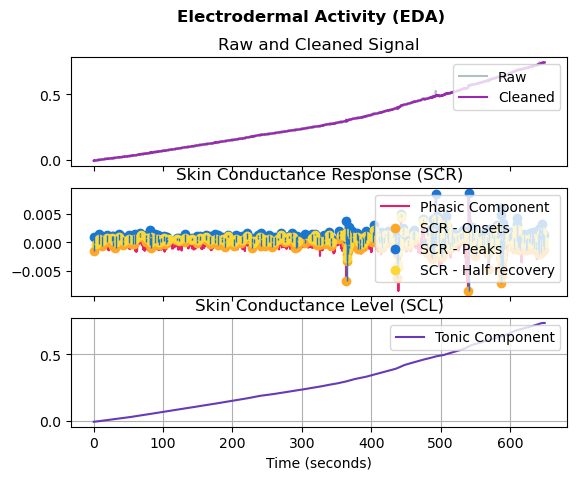

EDA of segment baseline:
   SCR_Peaks_N  SCR_Peaks_Amplitude_Mean  EDA_Tonic_SD  EDA_Sympathetic  \
0        187.0                  0.002144      0.213761         0.000001   

   EDA_SympatheticN  EDA_Autocorrelation  
0          0.015671             0.980503  
Segment stress1_ABBA:


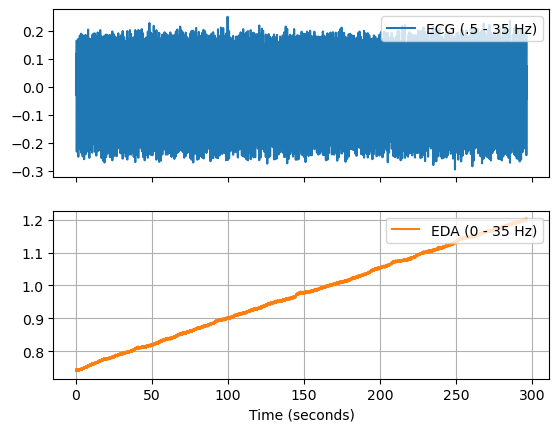

ECG of stress1_ABBA:


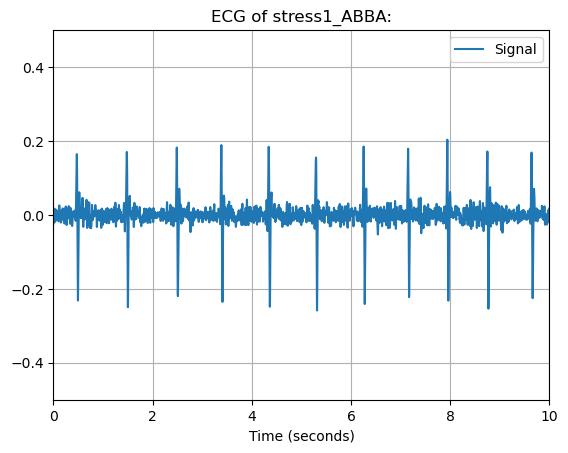

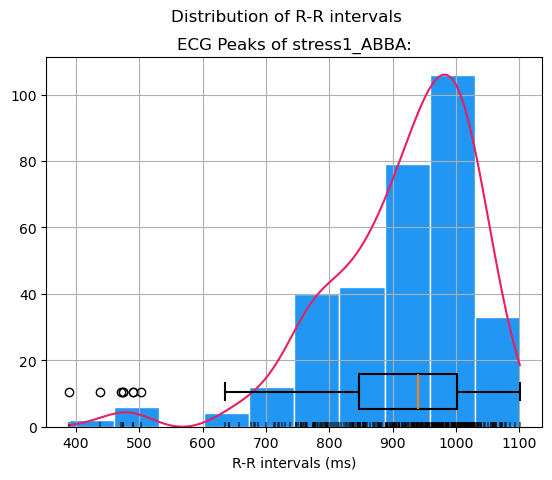

HRV of segment stress1_ABBA:
   HRV_MeanNN    HRV_SDNN  HRV_SDANN1  HRV_SDNNI1  HRV_SDANN2  HRV_SDNNI2  \
0  911.978395  122.244753   21.739596  120.807798         NaN         NaN   

   HRV_SDANN5  HRV_SDNNI5   HRV_RMSSD    HRV_SDSD  ...  HRV_IQRNN  \
0         NaN         NaN  118.469954  118.652262  ...     154.25   

   HRV_SDRMSSD  HRV_Prc20NN  HRV_Prc80NN  HRV_pNN50  HRV_pNN20  HRV_MinNN  \
0     1.031863        821.4       1012.0   54.62963  80.555556      389.0   

   HRV_MaxNN  HRV_HTI  HRV_TINN  
0     1101.0    20.25    656.25  

[1 rows x 25 columns]
0    911.978395
Name: HRV_MeanNN, dtype: float64
0    122.244753
Name: HRV_SDNN, dtype: float64
0    118.469954
Name: HRV_RMSSD, dtype: float64


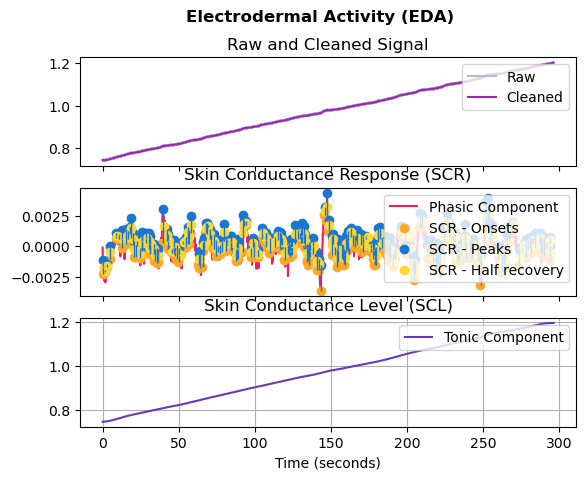

EDA of segment stress1_ABBA:
   SCR_Peaks_N  SCR_Peaks_Amplitude_Mean  EDA_Tonic_SD  EDA_Sympathetic  \
0        210.0                  0.001073      0.131982         0.000002   

   EDA_SympatheticN  EDA_Autocorrelation  
0          0.000019             0.959028  
Segment nf1_2D:


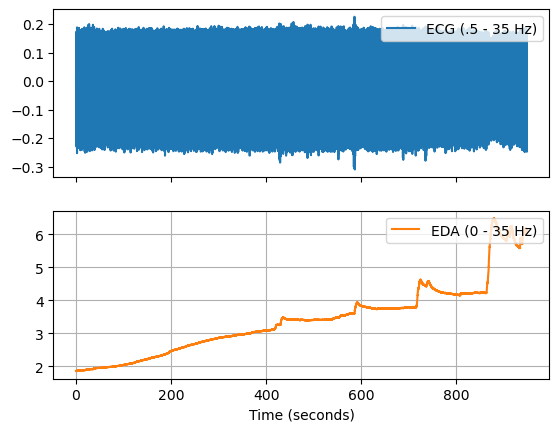

ECG of nf1_2D:


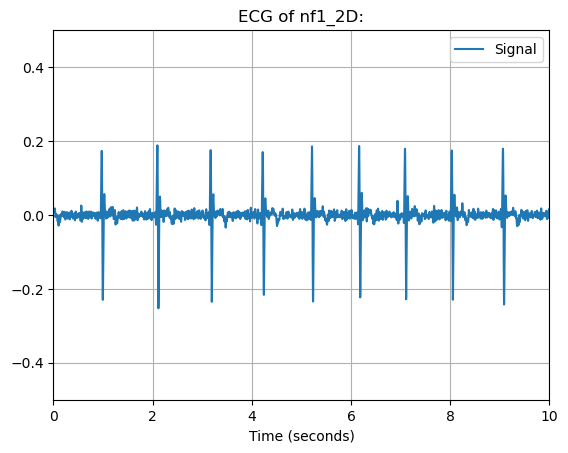

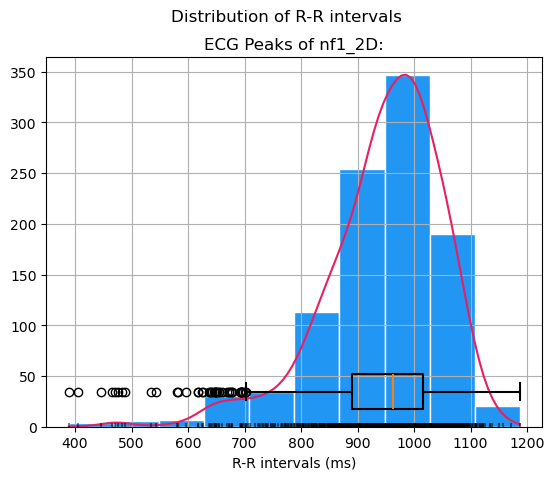

HRV of segment nf1_2D:
   HRV_MeanNN    HRV_SDNN  HRV_SDANN1  HRV_SDNNI1  HRV_SDANN2  HRV_SDNNI2  \
0  942.585075  111.550999   53.578207   91.923297   40.859598  102.037478   

   HRV_SDANN5  HRV_SDNNI5  HRV_RMSSD  HRV_SDSD  ...  HRV_IQRNN  HRV_SDRMSSD  \
0   48.635555  104.308575  83.654466  83.69561  ...      125.0     1.333473   

   HRV_Prc20NN  HRV_Prc80NN  HRV_pNN50  HRV_pNN20  HRV_MinNN  HRV_MaxNN  \
0        869.8       1031.0  33.731343  69.651741      389.0     1187.0   

     HRV_HTI  HRV_TINN  
0  21.382979       0.0  

[1 rows x 25 columns]
0    942.585075
Name: HRV_MeanNN, dtype: float64
0    111.550999
Name: HRV_SDNN, dtype: float64
0    83.654466
Name: HRV_RMSSD, dtype: float64


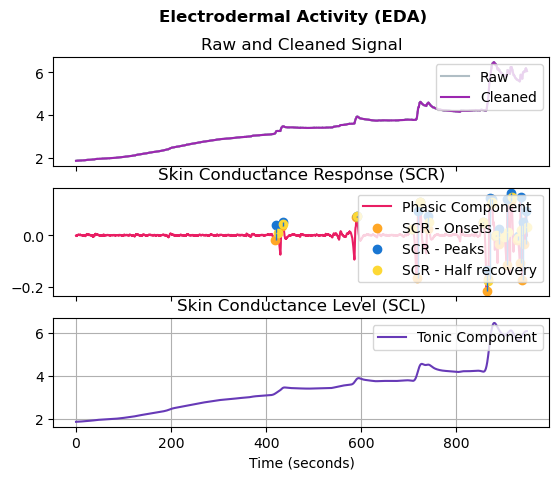

EDA of segment nf1_2D:
   SCR_Peaks_N  SCR_Peaks_Amplitude_Mean  EDA_Tonic_SD  EDA_Sympathetic  \
0         19.0                  0.093335      1.080408         0.001221   

   EDA_SympatheticN  EDA_Autocorrelation  
0          0.002133             0.977655  
Segment stress2_MIST:


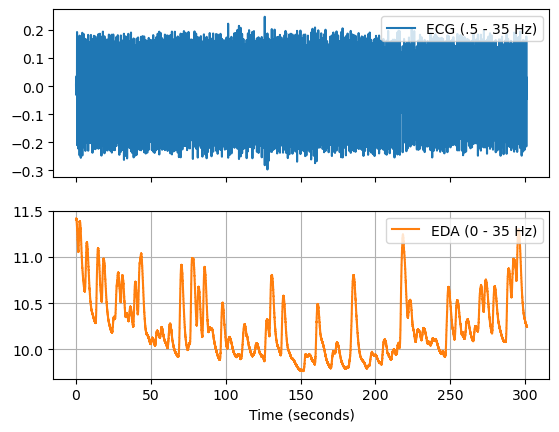

ECG of stress2_MIST:


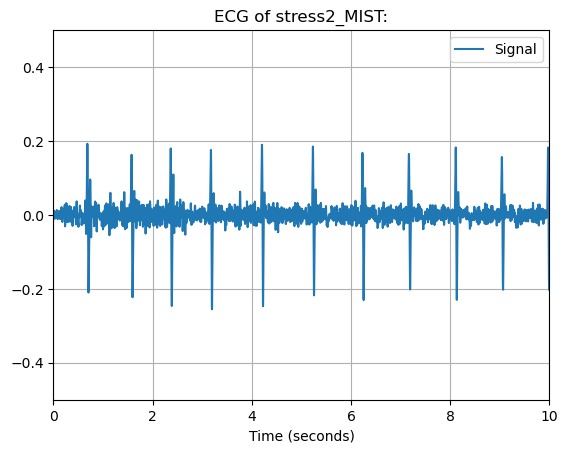

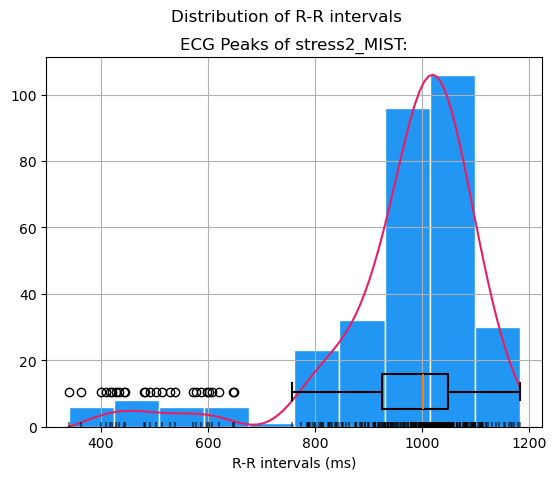

HRV of segment stress2_MIST:
   HRV_MeanNN    HRV_SDNN  HRV_SDANN1  HRV_SDNNI1  HRV_SDANN2  HRV_SDNNI2  \
0  955.920382  161.351114   12.510957  159.740697    9.382971  158.435735   

   HRV_SDANN5  HRV_SDNNI5   HRV_RMSSD    HRV_SDSD  ...  HRV_IQRNN  \
0         NaN         NaN  164.778232  165.041372  ...     122.75   

   HRV_SDRMSSD  HRV_Prc20NN  HRV_Prc80NN  HRV_pNN50  HRV_pNN20  HRV_MinNN  \
0     0.979202        892.6       1055.0  51.910828  77.070064      340.0   

   HRV_MaxNN    HRV_HTI  HRV_TINN  
0     1182.0  17.444444  726.5625  

[1 rows x 25 columns]
0    955.920382
Name: HRV_MeanNN, dtype: float64
0    161.351114
Name: HRV_SDNN, dtype: float64
0    164.778232
Name: HRV_RMSSD, dtype: float64


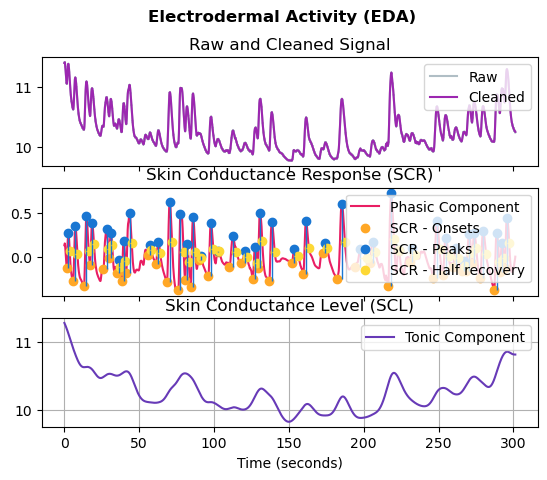

EDA of segment stress2_MIST:
   SCR_Peaks_N  SCR_Peaks_Amplitude_Mean  EDA_Tonic_SD  EDA_Sympathetic  \
0         42.0                  0.436158      0.273356         0.036362   

   EDA_SympatheticN  EDA_Autocorrelation  
0          0.002098             0.408855  
Segment nf2_VR:


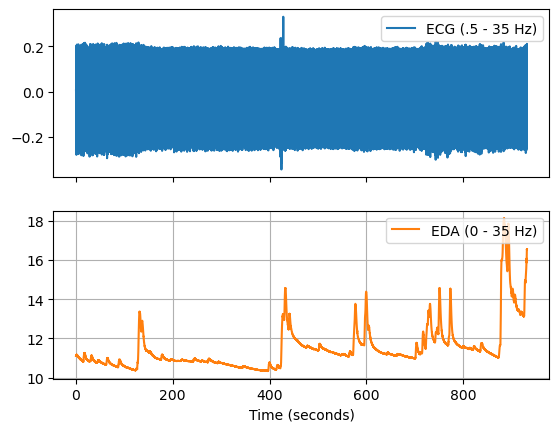

ECG of nf2_VR:


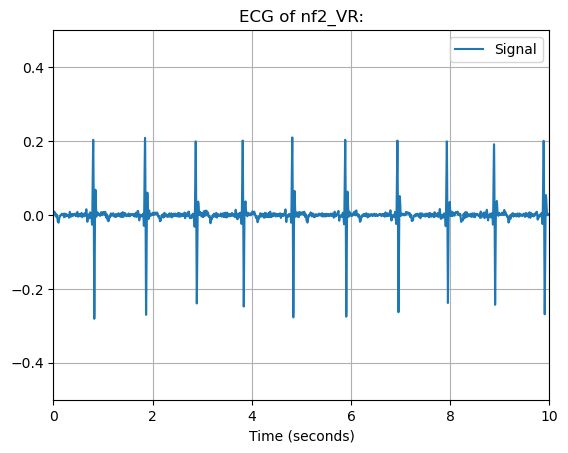

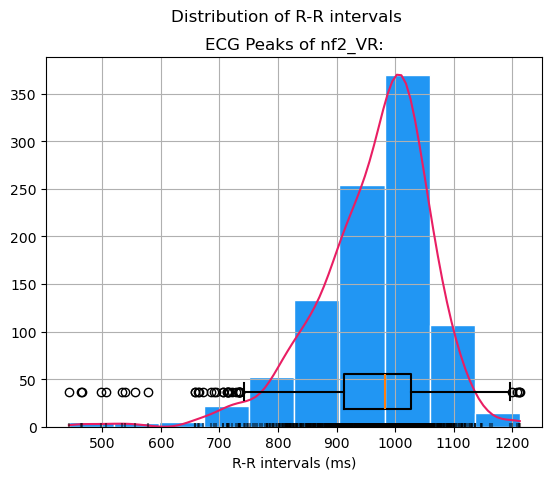

HRV of segment nf2_VR:
   HRV_MeanNN    HRV_SDNN  HRV_SDANN1  HRV_SDNNI1  HRV_SDANN2  HRV_SDNNI2  \
0  963.074534  101.204122   44.348715    87.71992    33.28633    94.96342   

   HRV_SDANN5  HRV_SDNNI5  HRV_RMSSD  HRV_SDSD  ...  HRV_IQRNN  HRV_SDRMSSD  \
0   28.331109   98.781523  83.541644  83.58443  ...      114.0     1.211421   

   HRV_Prc20NN  HRV_Prc80NN  HRV_pNN50  HRV_pNN20  HRV_MinNN  HRV_MaxNN  \
0        894.0       1039.0   46.99793  76.604555      443.0     1213.0   

     HRV_HTI  HRV_TINN  
0  17.563636       0.0  

[1 rows x 25 columns]
0    963.074534
Name: HRV_MeanNN, dtype: float64
0    101.204122
Name: HRV_SDNN, dtype: float64
0    83.541644
Name: HRV_RMSSD, dtype: float64


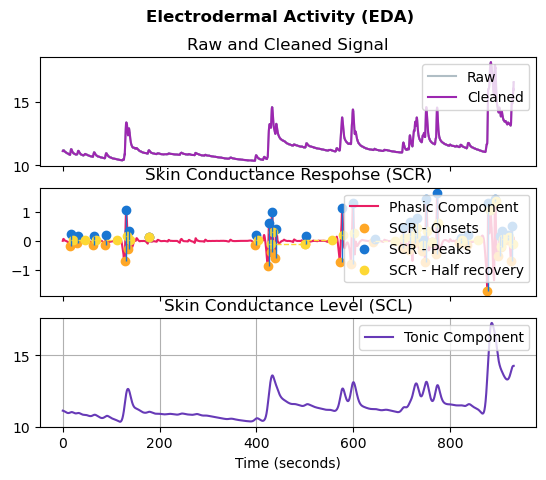

EDA of segment nf2_VR:
   SCR_Peaks_N  SCR_Peaks_Amplitude_Mean  EDA_Tonic_SD  EDA_Sympathetic  \
0         32.0                  0.813025      1.096861         0.079839   

   EDA_SympatheticN  EDA_Autocorrelation  
0          0.006303             0.838469  

For file PB13:
segment: [baseline] before: [None] after [stress1_ABBA] start [0] end [650059]
segment: [stress1_ABBA] before: [baseline] after [nf1_2D] start [650059] end [946410]
2146017
segment: [nf1_2D] before: [stress1_ABBA] after [stress2_MIST] start [1244777] end [2193167] marker_inside label[nf1_2D_unlimited] marker_inside index [2146017]
segment: [stress2_MIST] before: [nf1_2D] after [nf2_VR] start [2992623] end [3293888]
4535042
segment: [nf2_VR] before: [stress2_MIST] after [None] start [3634419] end [4566357] marker_inside label[nf2_VR_unlimited] marker_inside index [4535042]

File PB14:
Segment baseline:


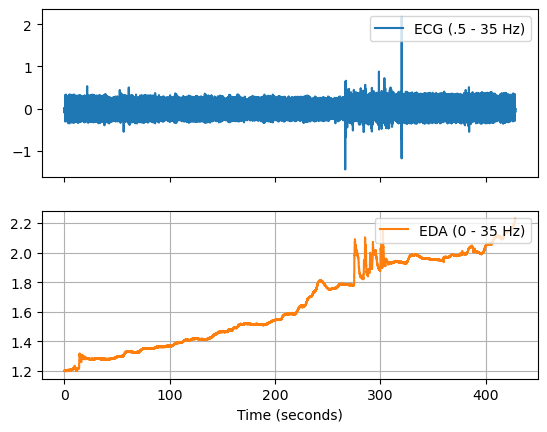

ECG of baseline:


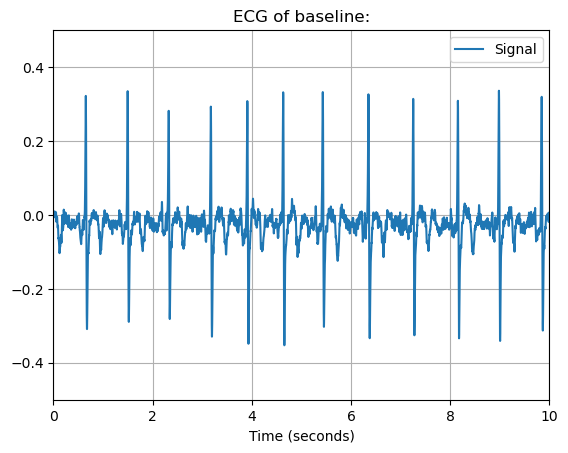

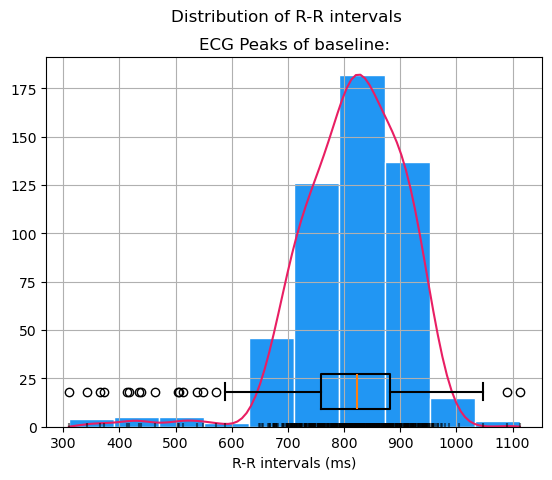

HRV of segment baseline:
   HRV_MeanNN    HRV_SDNN  HRV_SDANN1  HRV_SDNNI1  HRV_SDANN2  HRV_SDNNI2  \
0  813.489524  101.157794   25.131022    93.24203    25.07767   92.411373   

   HRV_SDANN5  HRV_SDNNI5   HRV_RMSSD    HRV_SDSD  ...  HRV_IQRNN  \
0         NaN         NaN  105.792863  105.893921  ...      122.0   

   HRV_SDRMSSD  HRV_Prc20NN  HRV_Prc80NN  HRV_pNN50  HRV_pNN20  HRV_MinNN  \
0     0.956187        743.0        897.2  37.142857  70.666667      310.0   

   HRV_MaxNN    HRV_HTI  HRV_TINN  
0     1113.0  20.192308  601.5625  

[1 rows x 25 columns]
0    813.489524
Name: HRV_MeanNN, dtype: float64
0    101.157794
Name: HRV_SDNN, dtype: float64
0    105.792863
Name: HRV_RMSSD, dtype: float64


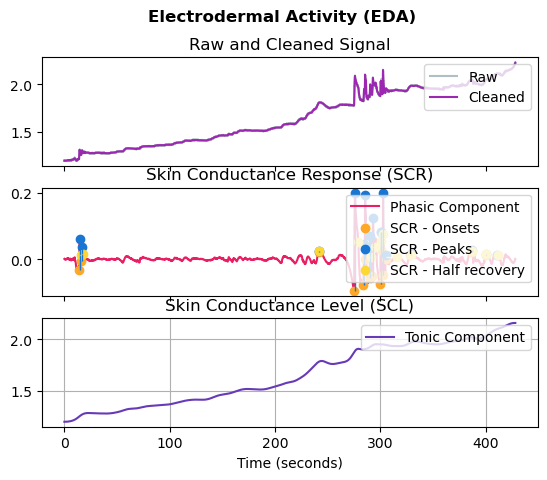

EDA of segment baseline:
   SCR_Peaks_N  SCR_Peaks_Amplitude_Mean  EDA_Tonic_SD  EDA_Sympathetic  \
0         16.0                  0.094927      0.286206         0.000358   

   EDA_SympatheticN  EDA_Autocorrelation  
0          0.002176             0.962817  
Segment stress1_ABBA:


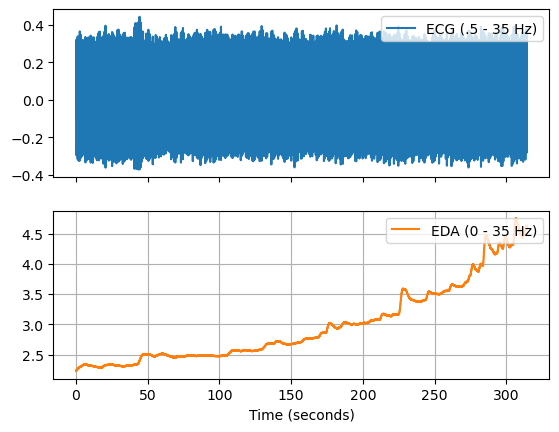

ECG of stress1_ABBA:


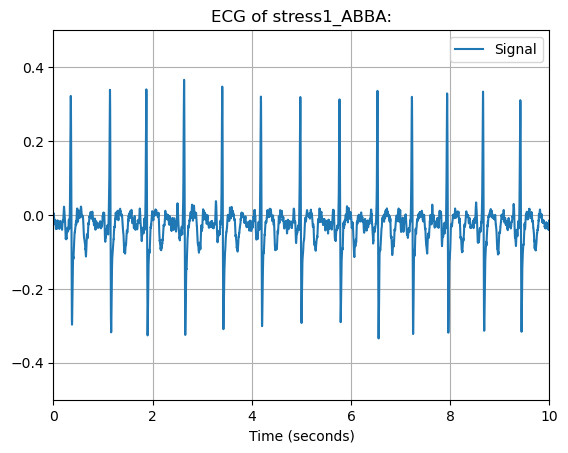

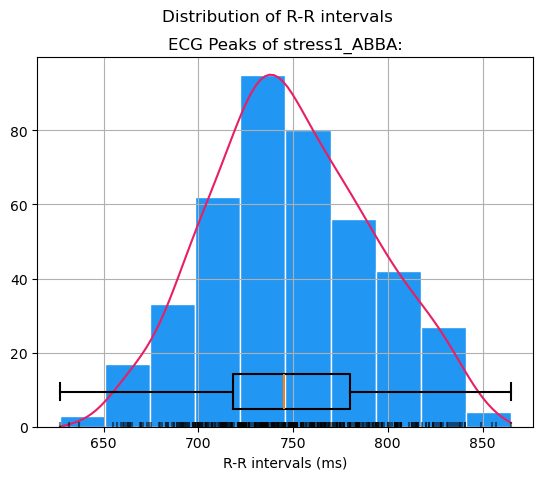

HRV of segment stress1_ABBA:
   HRV_MeanNN   HRV_SDNN  HRV_SDANN1  HRV_SDNNI1  HRV_SDANN2  HRV_SDNNI2  \
0  748.739857  44.399843   13.259147    42.69021   11.585793   43.135146   

   HRV_SDANN5  HRV_SDNNI5  HRV_RMSSD   HRV_SDSD  ...  HRV_IQRNN  HRV_SDRMSSD  \
0         NaN         NaN  32.212364  32.250936  ...       61.5     1.378348   

   HRV_Prc20NN  HRV_Prc80NN  HRV_pNN50  HRV_pNN20  HRV_MinNN  HRV_MaxNN  \
0        712.0        787.4  11.455847  52.983294      627.0      865.0   

     HRV_HTI  HRV_TINN  
0  11.324324  210.9375  

[1 rows x 25 columns]
0    748.739857
Name: HRV_MeanNN, dtype: float64
0    44.399843
Name: HRV_SDNN, dtype: float64
0    32.212364
Name: HRV_RMSSD, dtype: float64


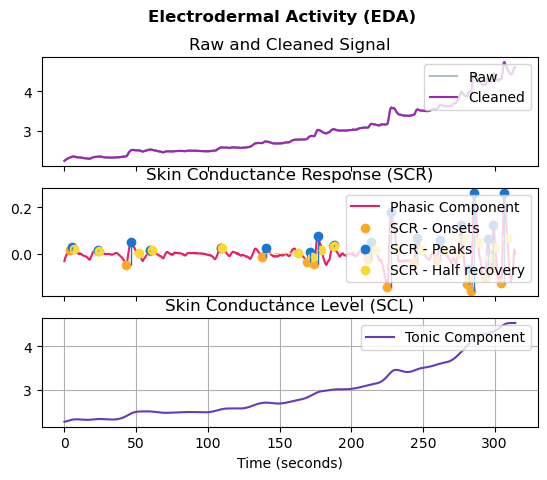

EDA of segment stress1_ABBA:
   SCR_Peaks_N  SCR_Peaks_Amplitude_Mean  EDA_Tonic_SD  EDA_Sympathetic  \
0         19.0                  0.118239      0.632646         0.001239   

   EDA_SympatheticN  EDA_Autocorrelation  
0          0.001639             0.943116  
Segment nf1_VR:


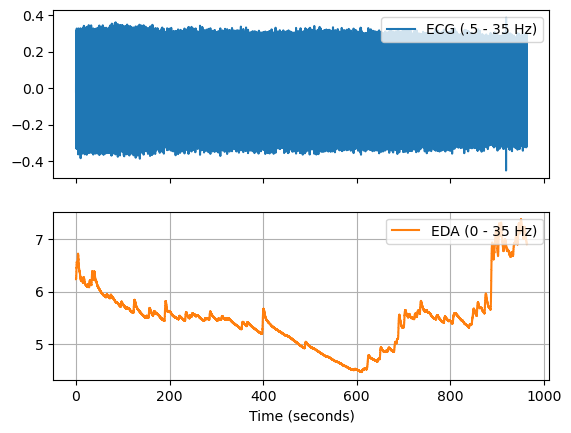

ECG of nf1_VR:


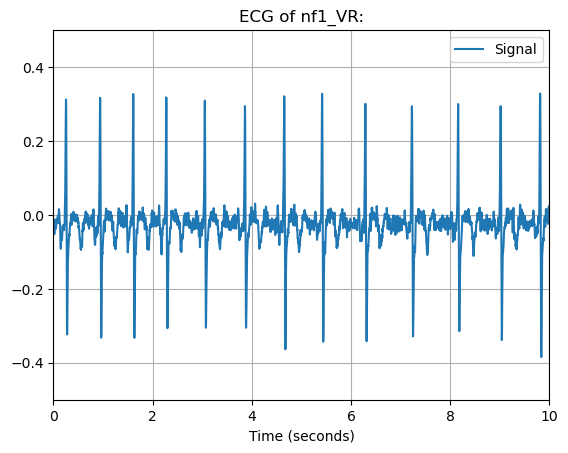

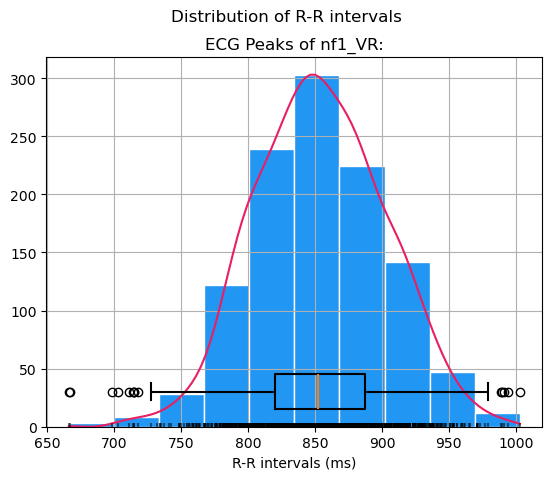

HRV of segment nf1_VR:
   HRV_MeanNN   HRV_SDNN  HRV_SDANN1  HRV_SDNNI1  HRV_SDANN2  HRV_SDNNI2  \
0  853.600177  49.818773   18.485736   46.681146   14.075137   48.147827   

   HRV_SDANN5  HRV_SDNNI5  HRV_RMSSD   HRV_SDSD  ...  HRV_IQRNN  HRV_SDRMSSD  \
0   10.186151   49.645363  43.107941  43.126815  ...       67.0     1.155675   

   HRV_Prc20NN  HRV_Prc80NN  HRV_pNN50  HRV_pNN20  HRV_MinNN  HRV_MaxNN  \
0        810.4        896.0  24.202128  65.514184      666.0     1003.0   

   HRV_HTI  HRV_TINN  
0     14.1  289.0625  

[1 rows x 25 columns]
0    853.600177
Name: HRV_MeanNN, dtype: float64
0    49.818773
Name: HRV_SDNN, dtype: float64
0    43.107941
Name: HRV_RMSSD, dtype: float64


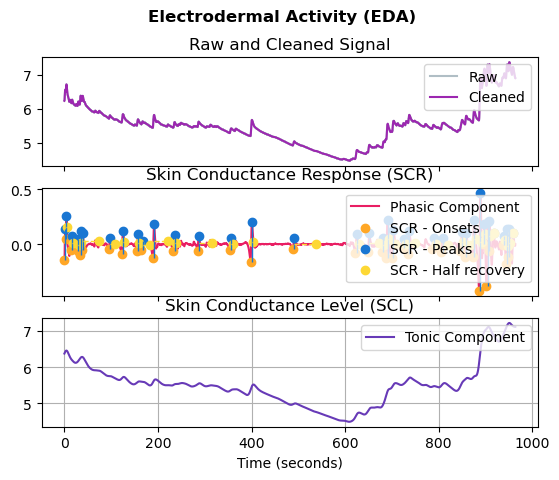

EDA of segment nf1_VR:
   SCR_Peaks_N  SCR_Peaks_Amplitude_Mean  EDA_Tonic_SD  EDA_Sympathetic  \
0         37.0                  0.208628      0.590706          0.00326   

   EDA_SympatheticN  EDA_Autocorrelation  
0          0.001791             0.959726  
Segment stress2_MIST:


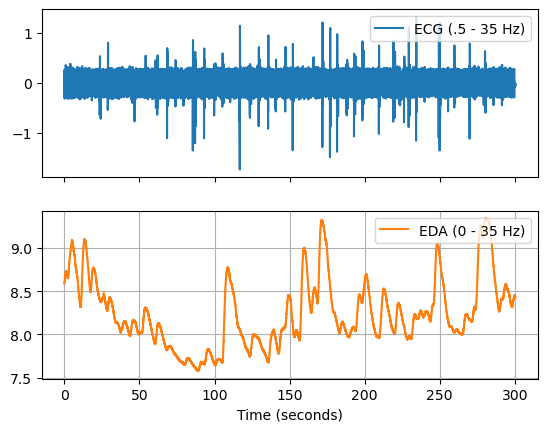

ECG of stress2_MIST:


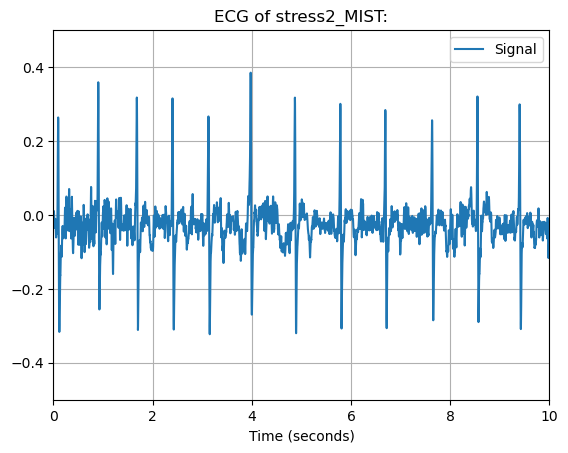

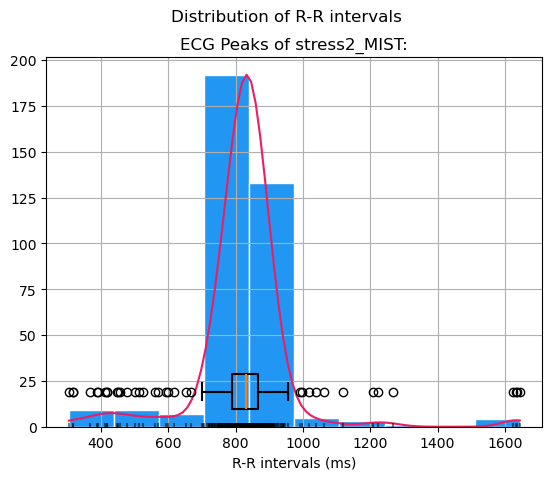

HRV of segment stress2_MIST:
   HRV_MeanNN    HRV_SDNN  HRV_SDANN1  HRV_SDNNI1  HRV_SDANN2  HRV_SDNNI2  \
0  822.906336  141.878058   18.019069  140.818651         NaN         NaN   

   HRV_SDANN5  HRV_SDNNI5   HRV_RMSSD    HRV_SDSD  ...  HRV_IQRNN  \
0         NaN         NaN  192.632189  192.898722  ...       77.5   

   HRV_SDRMSSD  HRV_Prc20NN  HRV_Prc80NN  HRV_pNN50  HRV_pNN20  HRV_MinNN  \
0     0.736523        777.4        874.0  41.597796  73.278237      305.0   

   HRV_MaxNN  HRV_HTI  HRV_TINN  
0     1644.0   15.125  632.8125  

[1 rows x 25 columns]
0    822.906336
Name: HRV_MeanNN, dtype: float64
0    141.878058
Name: HRV_SDNN, dtype: float64
0    192.632189
Name: HRV_RMSSD, dtype: float64


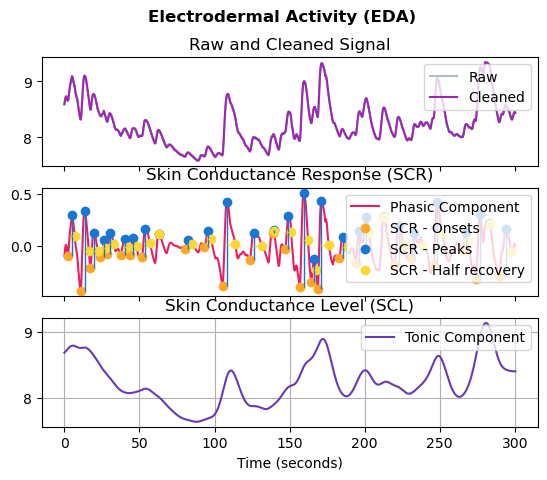

EDA of segment stress2_MIST:
   SCR_Peaks_N  SCR_Peaks_Amplitude_Mean  EDA_Tonic_SD  EDA_Sympathetic  \
0         30.0                  0.326063      0.341954         0.023519   

   EDA_SympatheticN  EDA_Autocorrelation  
0          0.001865             0.644239  
Segment nf2_2D:


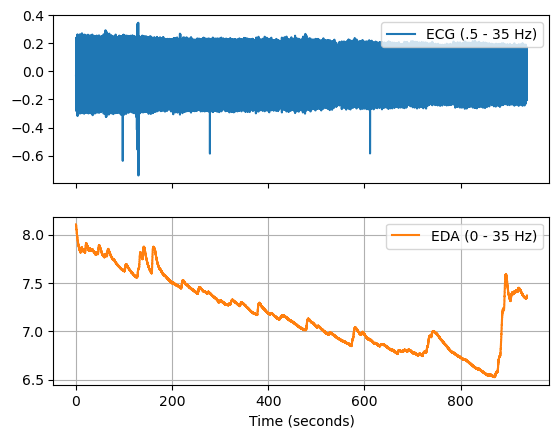

ECG of nf2_2D:


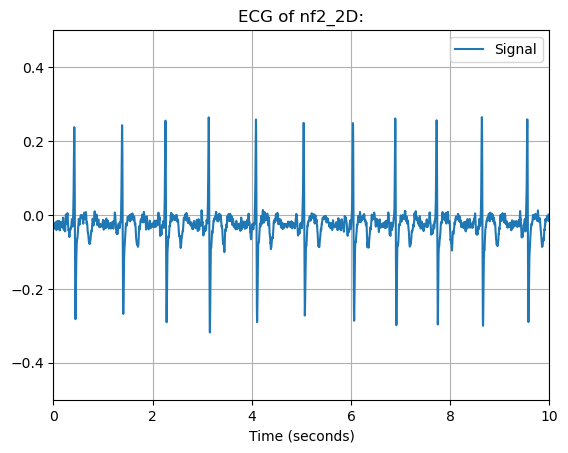

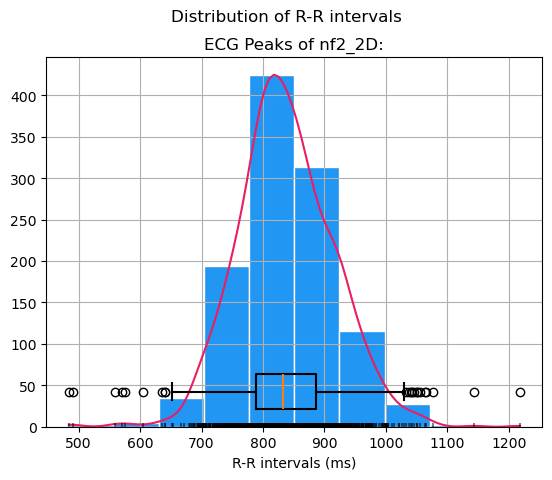

HRV of segment nf2_2D:
   HRV_MeanNN   HRV_SDNN  HRV_SDANN1  HRV_SDNNI1  HRV_SDANN2  HRV_SDNNI2  \
0  837.427167  78.679553   48.566047   60.795872   47.996146   64.032456   

   HRV_SDANN5  HRV_SDNNI5  HRV_RMSSD   HRV_SDSD  ...  HRV_IQRNN  HRV_SDRMSSD  \
0   46.815468   70.148037  63.441238  63.469572  ...       97.0     1.240196   

   HRV_Prc20NN  HRV_Prc80NN  HRV_pNN50  HRV_pNN20  HRV_MinNN  HRV_MaxNN  \
0        776.0        902.4  24.575514  62.466488      484.0     1218.0   

     HRV_HTI  HRV_TINN  
0  17.761905       0.0  

[1 rows x 25 columns]
0    837.427167
Name: HRV_MeanNN, dtype: float64
0    78.679553
Name: HRV_SDNN, dtype: float64
0    63.441238
Name: HRV_RMSSD, dtype: float64


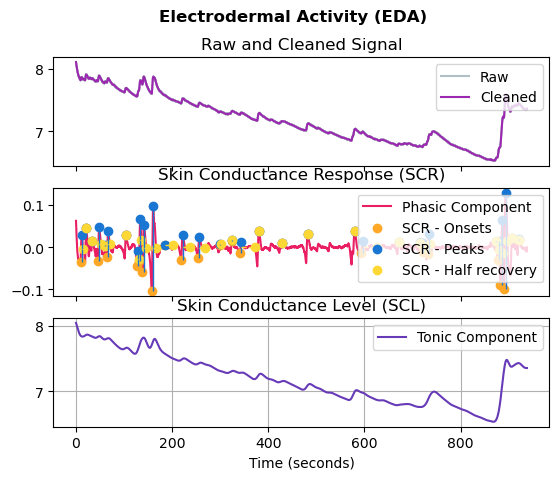

EDA of segment nf2_2D:
   SCR_Peaks_N  SCR_Peaks_Amplitude_Mean  EDA_Tonic_SD  EDA_Sympathetic  \
0         32.0                  0.041761      0.370668         0.000594   

   EDA_SympatheticN  EDA_Autocorrelation  
0           0.00022             0.980187  

For file PB14:
segment: [baseline] before: [None] after [stress1_ABBA] start [0] end [428175]
segment: [stress1_ABBA] before: [baseline] after [nf1_VR] start [428175] end [742565]
2218958
segment: [nf1_VR] before: [stress1_ABBA] after [stress2_MIST] start [1318215] end [2282108] marker_inside label[nf1_VR_unlimited] marker_inside index [2218958]
segment: [stress2_MIST] before: [nf1_VR] after [nf2_2D] start [3080685] end [3381041]
4567389
segment: [nf2_2D] before: [stress2_MIST] after [None] start [3666895] end [4605078] marker_inside label[nf2_2D_unlimited] marker_inside index [4567389]

File PB15:
Segment baseline:


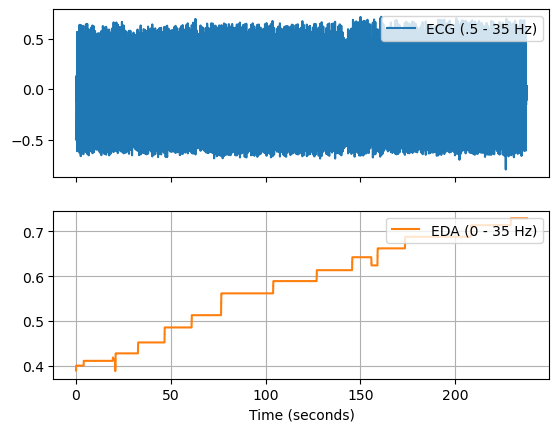

ECG of baseline:


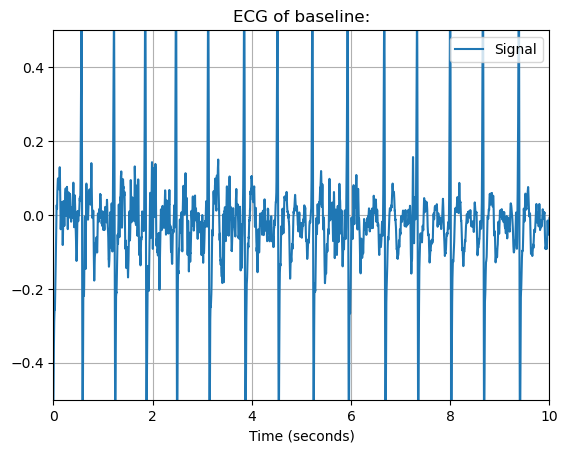

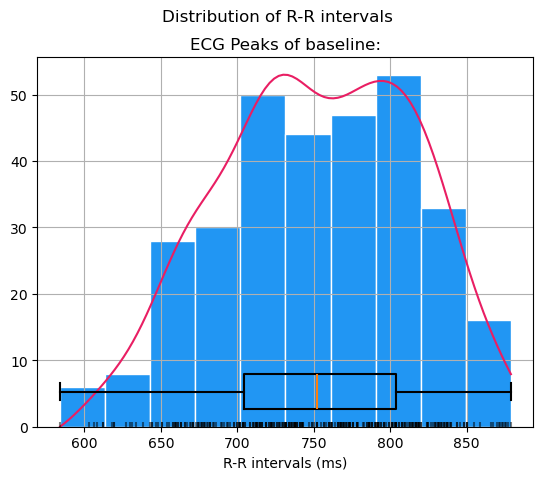

HRV of segment baseline:
   HRV_MeanNN   HRV_SDNN  HRV_SDANN1  HRV_SDNNI1  HRV_SDANN2  HRV_SDNNI2  \
0   751.35873  64.971441   13.149957   64.199716         NaN         NaN   

   HRV_SDANN5  HRV_SDNNI5  HRV_RMSSD   HRV_SDSD  ...  HRV_IQRNN  HRV_SDRMSSD  \
0         NaN         NaN  38.880021  38.941326  ...       99.5     1.671075   

   HRV_Prc20NN  HRV_Prc80NN  HRV_pNN50  HRV_pNN20  HRV_MinNN  HRV_MaxNN  \
0        692.6        813.2  16.190476  55.238095      584.0      879.0   

   HRV_HTI  HRV_TINN  
0     15.0    156.25  

[1 rows x 25 columns]
0    751.35873
Name: HRV_MeanNN, dtype: float64
0    64.971441
Name: HRV_SDNN, dtype: float64
0    38.880021
Name: HRV_RMSSD, dtype: float64


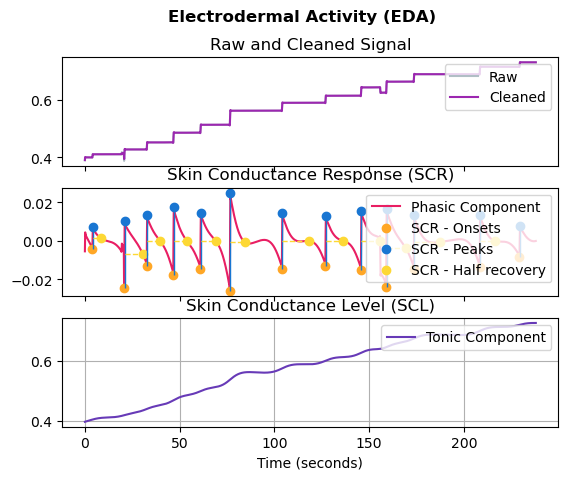

EDA of segment baseline:
   SCR_Peaks_N  SCR_Peaks_Amplitude_Mean  EDA_Tonic_SD  EDA_Sympathetic  \
0         14.0                  0.029787      0.101634          0.00004   

   EDA_SympatheticN  EDA_Autocorrelation  
0          0.001189             0.947054  
Segment stress1_ABBA:


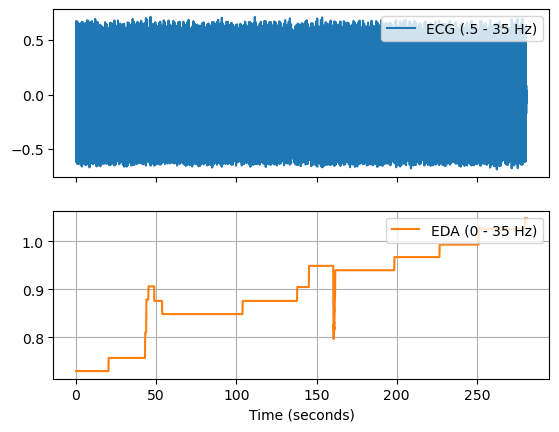

ECG of stress1_ABBA:


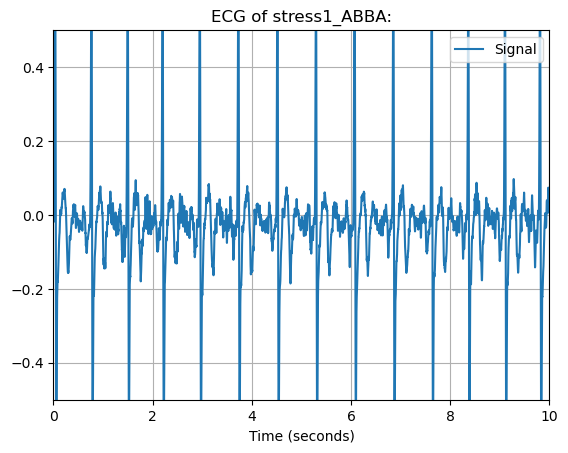

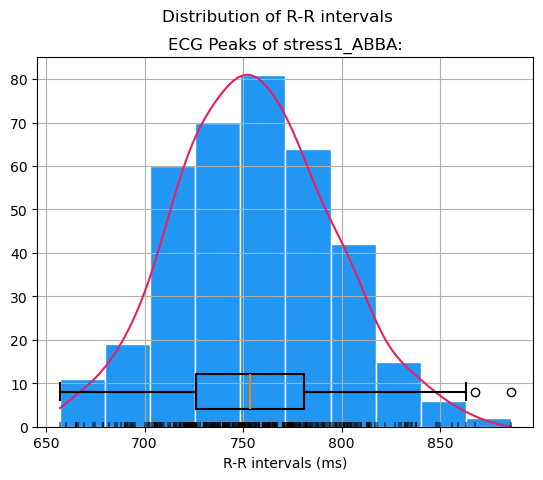

HRV of segment stress1_ABBA:
   HRV_MeanNN   HRV_SDNN  HRV_SDANN1  HRV_SDNNI1  HRV_SDANN2  HRV_SDNNI2  \
0  755.975676  40.498546    6.737225   40.910862         NaN         NaN   

   HRV_SDANN5  HRV_SDNNI5  HRV_RMSSD   HRV_SDSD  ...  HRV_IQRNN  HRV_SDRMSSD  \
0         NaN         NaN  32.043669  32.087148  ...       55.0     1.263855   

   HRV_Prc20NN  HRV_Prc80NN  HRV_pNN50  HRV_pNN20  HRV_MinNN  HRV_MaxNN  \
0        722.0        790.0  11.351351  52.702703      657.0      886.0   

     HRV_HTI  HRV_TINN  
0  10.882353      62.5  

[1 rows x 25 columns]
0    755.975676
Name: HRV_MeanNN, dtype: float64
0    40.498546
Name: HRV_SDNN, dtype: float64
0    32.043669
Name: HRV_RMSSD, dtype: float64


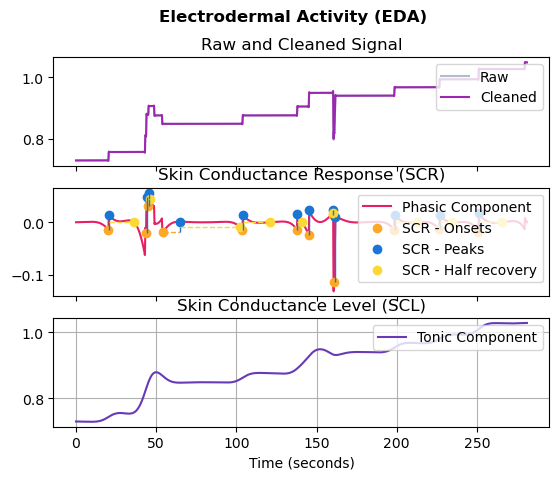

EDA of segment stress1_ABBA:
   SCR_Peaks_N  SCR_Peaks_Amplitude_Mean  EDA_Tonic_SD  EDA_Sympathetic  \
0         12.0                  0.039709      0.086369         0.000088   

   EDA_SympatheticN  EDA_Autocorrelation  
0          0.001116             0.925188  
Segment nf1_2D:


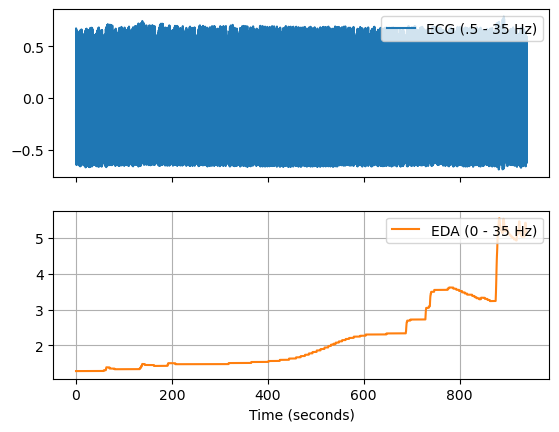

In [ ]:
main()